<h1>1.Imports & Data Loading</h1>

In [945]:
import csv
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
from sklearn.metrics import mutual_info_score
from sklearn.feature_selection import mutual_info_regression
warnings.filterwarnings('ignore')
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
#import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from skforecast.ForecasterAutoregMultiSeries import ForecasterAutoregMultiSeries
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.feature_selection import SelectPercentile








In [946]:
sales = pd.read_csv('Case2_Sales data.csv', delimiter=';', parse_dates=['DATE'], dayfirst=True)
market = pd.read_excel('Case2_Market data.xlsx')


In [947]:

# Assuming 'sales' DataFrame is already defined

# Convert 'DATE' column to datetime format
sales['DATE'] = pd.to_datetime(sales['DATE'], format='%d.%m.%Y')

# Replace commas with periods in 'Sales_EUR' column
sales['Sales_EUR'] = sales['Sales_EUR'].str.replace(',', '.')

# Convert 'Sales_EUR' column to numeric, errors='coerce' will turn non-numeric values into NaN
sales['Sales_EUR'] = pd.to_numeric(sales['Sales_EUR'], errors='coerce')

# Fill NaN values with 0
sales['Sales_EUR'].fillna(0, inplace=True)

# Convert 'DATE' column to period (month)
sales['date'] = sales['DATE'].dt.to_period('M')

# Group by 'month_year' and 'Mapped_GCK', then sum 'Sales_EUR'
sales = sales.groupby(['date', 'Mapped_GCK'])['Sales_EUR'].sum().unstack(fill_value=0)

# Calculate total sales for each month
sales['Total_Sales_EUR'] = sales.sum(axis=1)

# Calculate index change for each 'Mapped_GCK' category
index_change_prod_list = []
for col in sales.columns:
    sales[col + '_Index'] = (sales[col] / sales[col].iloc[0]) * 100
    index_change_prod_list.append(col + '_Index')

# Display the DataFrame
sales


Mapped_GCK,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,...,#16_Index,#20_Index,#3_Index,#36_Index,#4_Index,#5_Index,#6_Index,#8_Index,#9_Index,Total_Sales_EUR_Index
date,,,,,,,,,,,,,,,,,,,,,
2018-10,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,...,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
2018-11,5140760.00,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,11863001.51,21617.61,371322.42,...,413.48,127.06,146.65,333.88,93.35,359.89,128.12,89.80,58.27,62.18
2018-12,37889612.12,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8736859.39,13924.52,430100.96,...,1429.34,20.13,108.00,215.06,108.13,278.00,270.69,46.33,0.00,123.93
2019-01,27728148.35,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,10705300.63,15444.39,484173.88,...,283.00,52.55,132.34,238.54,121.72,329.45,162.19,65.08,46.19,103.82
2019-02,34793163.53,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10167796.86,8051.15,620031.80,...,77.36,13.60,125.69,124.35,155.88,275.27,146.80,62.87,100.46,109.84
2019-03,33856803.04,493999.81,10118.00,11890.00,7535.25,2258352.22,3369.55,11040544.57,7373.42,491643.59,...,677.78,73.84,136.48,113.88,123.60,476.75,199.23,100.89,405.38,124.18
2019-04,39688292.01,1484281.60,21813.27,7488.54,0.00,224501.90,3619.63,12317479.75,4280.25,426221.34,...,67.38,79.32,152.27,66.11,107.16,228.66,75.18,71.48,283.28,122.49
2019-05,38897974.29,1066063.90,24468.00,2550.31,17771.40,353451.54,938.90,12798945.18,16905.32,375671.57,...,106.08,20.58,158.22,261.10,94.45,455.76,85.58,50.99,143.32,132.53
2019-06,39106750.23,492133.20,44255.68,34849.21,63017.71,367425.38,772.94,11546452.19,15516.22,190721.15,...,110.27,16.94,142.73,239.65,47.95,547.48,76.64,71.79,139.41,133.92


In [948]:
sales.columns

Index(['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5',
       '#6', '#8', '#9', 'Total_Sales_EUR', '#1_Index', '#11_Index',
       '#12_Index', '#13_Index', '#14_Index', '#16_Index', '#20_Index',
       '#3_Index', '#36_Index', '#4_Index', '#5_Index', '#6_Index', '#8_Index',
       '#9_Index', 'Total_Sales_EUR_Index'],
      dtype='object', name='Mapped_GCK')

In [949]:
market

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,...,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,...,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,...,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.94,16.94,112.09,83.46,82.62,79.45,124.29,86.56,109.33,...,118.27,80.83,117.72,NaN,81.10,120.71,141.51,106.16,102.08,85.91
3,2004m3,23.71,23.71,136.33,106.17,100.56,97.01,143.41,106.34,140.88,...,148.12,102.13,119.22,NaN,76.69,138.31,152.88,140.29,117.23,97.67
4,2004m4,24.44,24.44,117.79,92.01,89.65,84.93,129.08,95.58,105.85,...,125.48,90.96,117.44,NaN,71.55,115.56,137.80,106.27,105.34,87.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,2021m12,310.76,310.76,100.57,134.59,118.10,149.36,94.01,150.48,127.77,...,112.79,129.19,109.62,132.28,114.33,121.07,72.92,109.01,80.76,97.77
217,2022m1,235.96,235.96,85.74,108.16,94.55,120.35,86.85,101.26,110.46,...,90.56,92.34,111.36,122.24,109.00,112.32,74.36,95.37,77.94,98.60
218,2022m2,235.96,235.96,90.60,117.72,103.99,129.38,106.58,120.96,117.88,...,97.77,102.82,114.69,127.37,103.67,115.56,91.18,103.95,79.00,106.13
219,2022m3,329.41,329.41,107.84,136.86,121.31,151.20,124.64,153.65,152.00,...,114.72,122.05,115.16,152.45,98.35,145.25,102.48,133.74,96.70,119.95


In [950]:
# Set the second row as column names
market.columns = market.iloc[1]

# Drop the second row
market = market.drop(1)

# Reset the index
market.reset_index(drop=True, inplace=True)
market.drop(index=market.index[0], inplace=True)
market

1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,...,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
1,2004m2,16.94,16.94,112.09,83.46,82.62,79.45,124.29,86.56,109.33,...,118.27,80.83,117.72,NaN,81.10,120.71,141.51,106.16,102.08,85.91
2,2004m3,23.71,23.71,136.33,106.17,100.56,97.01,143.41,106.34,140.88,...,148.12,102.13,119.22,NaN,76.69,138.31,152.88,140.29,117.23,97.67
3,2004m4,24.44,24.44,117.79,92.01,89.65,84.93,129.08,95.58,105.85,...,125.48,90.96,117.44,NaN,71.55,115.56,137.80,106.27,105.34,87.25
4,2004m5,23.71,23.71,109.00,85.70,86.88,82.37,135.59,100.09,101.86,...,116.65,88.08,117.90,NaN,66.41,119.27,143.86,101.61,96.62,84.68
5,2004m6,27.01,27.01,133.79,106.64,99.01,95.11,136.42,110.89,120.33,...,143.25,100.98,119.50,NaN,61.28,128.85,144.32,116.66,118.46,95.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,2021m12,310.76,310.76,100.57,134.59,118.10,149.36,94.01,150.48,127.77,...,112.79,129.19,109.62,132.28,114.33,121.07,72.92,109.01,80.76,97.77
216,2022m1,235.96,235.96,85.74,108.16,94.55,120.35,86.85,101.26,110.46,...,90.56,92.34,111.36,122.24,109.00,112.32,74.36,95.37,77.94,98.60
217,2022m2,235.96,235.96,90.60,117.72,103.99,129.38,106.58,120.96,117.88,...,97.77,102.82,114.69,127.37,103.67,115.56,91.18,103.95,79.00,106.13
218,2022m3,329.41,329.41,107.84,136.86,121.31,151.20,124.64,153.65,152.00,...,114.72,122.05,115.16,152.45,98.35,145.25,102.48,133.74,96.70,119.95


In [951]:

# Define a function to transform the date
def transform_date(date_str):
    date_str = date_str.strip()  # Remove leading and trailing whitespace
    parts = date_str.split('m')
    year = parts[0]
    month = parts[1]
    formatted_date = f"{year}-{month.zfill(2)}" 
    return formatted_date

# Apply the function to the "date" column
market['date'] = market['date'].apply(transform_date)

# Convert numeric columns to numeric type
numeric_columns = market.columns[1:]  # Exclude the 'date' column
market[numeric_columns] = market[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Calculate the scaling factor
scaling_factor_label = '2018-10'  
scaling_factor_row = market.loc[market['date'] == scaling_factor_label, numeric_columns]
scaling_factor = 100 / scaling_factor_row.values

# Apply the scaling factor to adjust the index values
market_adjusted = market.copy()
market_adjusted.loc[:, numeric_columns] *= scaling_factor.squeeze()

# Display the modified DataFrame
market_adjusted


1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,...,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
1,2004-02,7.99,7.99,103.52,68.16,66.51,57.68,105.02,70.69,87.32,...,103.10,63.41,104.32,NaN,71.79,101.72,152.16,94.47,104.32,72.62
2,2004-03,11.19,11.19,125.90,86.70,80.95,70.43,121.18,86.84,112.52,...,129.12,80.13,105.64,NaN,67.89,116.55,164.38,124.84,119.80,82.56
3,2004-04,11.53,11.53,108.78,75.14,72.17,61.66,109.07,78.05,84.54,...,109.38,71.36,104.07,NaN,63.34,97.38,148.17,94.57,107.65,73.76
4,2004-05,11.19,11.19,100.67,69.98,69.94,59.80,114.57,81.73,81.36,...,101.68,69.11,104.47,NaN,58.79,100.50,154.69,90.42,98.74,71.58
5,2004-06,12.74,12.74,123.55,87.09,79.70,69.05,115.27,90.55,96.10,...,124.87,79.22,105.89,NaN,54.24,108.58,155.18,103.81,121.06,80.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,2021-12,146.62,146.62,92.88,109.91,95.07,108.44,79.43,122.89,102.05,...,98.32,101.36,97.14,102.29,101.20,102.02,78.40,97.00,82.54,82.65
216,2022-01,111.32,111.32,79.19,88.33,76.11,87.38,73.38,82.69,88.22,...,78.94,72.45,98.68,94.52,96.48,94.65,79.95,84.87,79.66,83.35
217,2022-02,111.32,111.32,83.67,96.13,83.71,93.93,90.06,98.77,94.15,...,85.22,80.67,101.63,98.49,91.77,97.38,98.04,92.50,80.74,89.71
218,2022-03,155.42,155.42,99.60,111.77,97.65,109.77,105.31,125.47,121.40,...,100.00,95.75,102.05,117.88,87.05,122.40,110.19,119.01,98.83,101.39


In [952]:
references = [ 'MAB_ELE_PRO156', 'MAB_ELE_SHP156', 'MAB_ELE_PRO250',
       'MAB_ELE_SHP250', 'MAB_ELE_PRO276', 'MAB_ELE_SHP276',
       'MAB_ELE_PRO380', 'MAB_ELE_SHP380', 'MAB_ELE_PRO392',
       'MAB_ELE_SHP392', 'MAB_ELE_PRO756', 'MAB_ELE_SHP756',
       'MAB_ELE_PRO826', 'MAB_ELE_SHP826', 'MAB_ELE_PRO840',
       'MAB_ELE_SHP840', 'MAB_ELE_PRO1100', 'MAB_ELE_SHP1100',
       'RohiBASEMET1000_org', 'RohiENERGY1000_org', 'RohiMETMIN1000_org',
       'RohiNATGAS1000_org', 'RohCRUDE_PETRO1000_org',
       'RohCOPPER1000_org', 'WKLWEUR840_org', 'PRI27840_org',
       'PRI27826_org', 'PRI27380_org', 'PRI27250_org', 'PRI27276_org',
       'PRI27156_org', 'PRO28840_org', 'PRO281000_org', 'PRO28756_org',
       'PRO28826_org', 'PRO28380_org', 'PRO28392_org', 'PRO28250_org',
       'PRO28276_org', 'PRO27840_org', 'PRO271000_org', 'PRO27756_org',
       'PRO27826_org', 'PRO27380_org', 'PRO27392_org', 'PRO27250_org',
       'PRO27276_org']


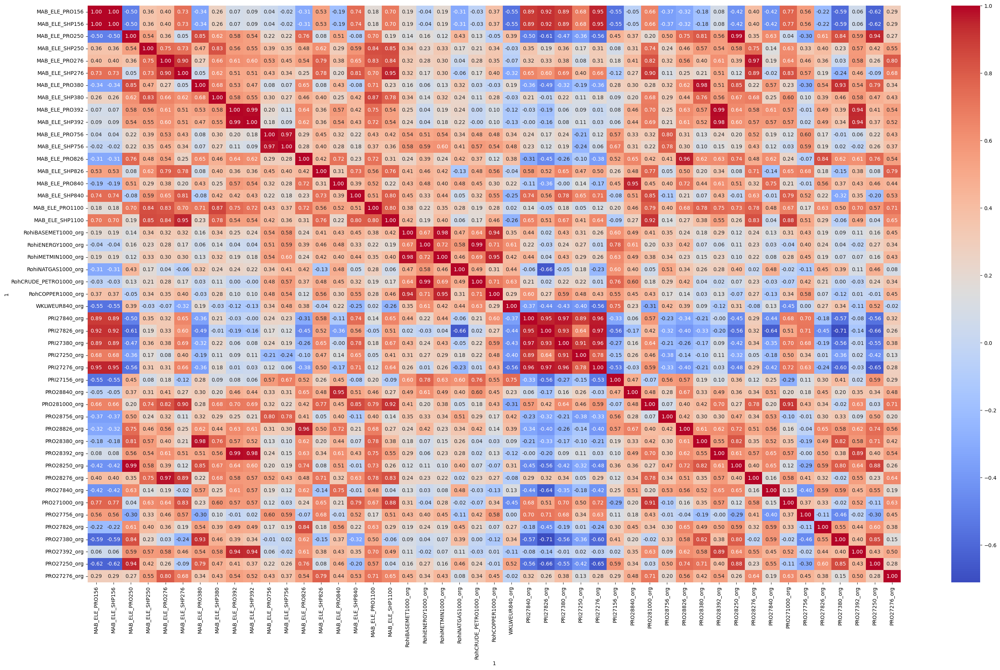

In [953]:
correlation_matrix = market_adjusted[references].corr()

# Set figure size
plt.figure(figsize=(35, 20))

# Plot the correlation matrix
sns.heatmap(market_adjusted[references].corr(), annot=True, fmt=".2f", cmap="coolwarm")

# Rotate y-axis labels for better readability
plt.yticks(rotation=0)

# Show plot
plt.show()

In [954]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.9).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                       1                  
MAB_ELE_SHP156          MAB_ELE_PRO156         True
MAB_ELE_SHP276          MAB_ELE_PRO276         True
MAB_ELE_SHP392          MAB_ELE_PRO392         True
MAB_ELE_SHP756          MAB_ELE_PRO756         True
MAB_ELE_SHP1100         MAB_ELE_SHP276         True
RohiMETMIN1000_org      RohiBASEMET1000_org    True
RohCRUDE_PETRO1000_org  RohiENERGY1000_org     True
RohCOPPER1000_org       RohiBASEMET1000_org    True
                        RohiMETMIN1000_org     True
PRI27826_org            MAB_ELE_PRO156         True
                        MAB_ELE_SHP156         True
                        PRI27840_org           True
PRI27380_org            PRI27840_org           True
                        PRI27826_org           True
PRI27250_org            PRI27380_org           True
PRI27276_org            MAB_ELE_PRO156         True
                        MAB_ELE_SHP156         True
                        PRI27840_org           True
                    

In [955]:
columns_to_drop = ['MAB_ELE_SHP156',
    'MAB_ELE_SHP276',              
    'MAB_ELE_SHP392',
    'MAB_ELE_SHP756',
    'MAB_ELE_SHP1100',
    'RohiMETMIN1000_org',
    'RohCRUDE_PETRO1000_org',
    'RohCOPPER1000_org',
    'PRI27826_org',
    'PRI27380_org',
    'PRI27250_org',
    'PRI27276_org',
    'PRO28840_org',
    'PRO281000_org',
    'PRO28826_org',
    'PRO28380_org',
    'PRO28392_org',
    'PRO28250_org',
    'PRO28276_org',
    'PRO271000_org',
    'PRO27380_org',
    'PRO27392_org',
    'PRO27250_org'
]

# Drop the specified columns
market_adjusted = market_adjusted.drop(columns=columns_to_drop)
references = [col for col in references if col not in columns_to_drop]

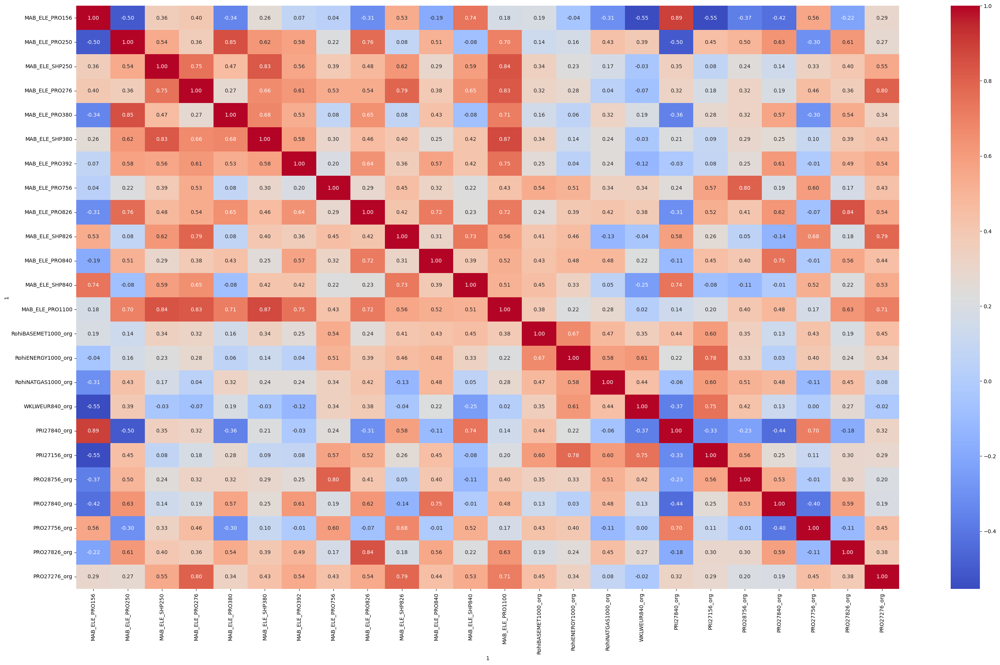

In [956]:
correlation_matrix = market_adjusted[references].corr()

# Set figure size
plt.figure(figsize=(35, 20))

# Plot the correlation matrix
sns.heatmap(market_adjusted[references].corr(), annot=True, fmt=".2f", cmap="coolwarm")

# Rotate y-axis labels for better readability
plt.yticks(rotation=0)

# Show plot
plt.show()

In [957]:
market_adjusted.columns

Index(['date', 'MAB_ELE_PRO156', 'MAB_ELE_PRO250', 'MAB_ELE_SHP250',
       'MAB_ELE_PRO276', 'MAB_ELE_PRO380', 'MAB_ELE_SHP380', 'MAB_ELE_PRO392',
       'MAB_ELE_PRO756', 'MAB_ELE_PRO826', 'MAB_ELE_SHP826', 'MAB_ELE_PRO840',
       'MAB_ELE_SHP840', 'MAB_ELE_PRO1100', 'RohiBASEMET1000_org',
       'RohiENERGY1000_org', 'RohiNATGAS1000_org', 'WKLWEUR840_org',
       'PRI27840_org', 'PRI27156_org', 'PRO28756_org', 'PRO27840_org',
       'PRO27756_org', 'PRO27826_org', 'PRO27276_org'],
      dtype='object', name=1)

<h4> Production : Machinery & Electricals </h4>
__________________________________________________________

In [958]:
selected_columns = ["date", "MAB_ELE_PRO156", "MAB_ELE_PRO250", "MAB_ELE_PRO276", 
                    "MAB_ELE_PRO380", "MAB_ELE_PRO392", "MAB_ELE_PRO756", 
                    "MAB_ELE_PRO826", "MAB_ELE_PRO840", "MAB_ELE_PRO1100"]

# Creating a new DataFrame with selected columns
Prod_Mach_Electrc = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Prod_Mach_Electrc.head()


1,date,MAB_ELE_PRO156,MAB_ELE_PRO250,MAB_ELE_PRO276,MAB_ELE_PRO380,MAB_ELE_PRO392,MAB_ELE_PRO756,MAB_ELE_PRO826,MAB_ELE_PRO840,MAB_ELE_PRO1100
1,2004-02,7.99,103.52,66.51,105.02,87.32,83.63,97.97,96.16,78.08
2,2004-03,11.19,125.90,80.95,121.18,112.52,78.72,112.23,98.47,91.47
3,2004-04,11.53,108.78,72.17,109.07,84.54,78.50,95.67,96.66,81.77
4,2004-05,11.19,100.67,69.94,114.57,81.36,78.27,97.35,96.89,81.42
5,2004-06,12.74,123.55,79.70,115.27,96.10,78.05,107.36,98.81,90.08


<h4> Production :  Machinery & Equipment </h4>
__________________________________________________________   

In [959]:
selected_columns = ["date", "PRO28756_org"]

# Creating a new DataFrame with selected columns
Prod_Mach_Equip = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Prod_Mach_Equip.head()

1,date,PRO28756_org
1,2004-02,90.90
2,2004-03,85.38
3,2004-04,87.81
4,2004-05,90.24
5,2004-06,92.67


<h4> Production :  Electric Equipment </h4>
__________________________________________________________   

In [960]:
selected_columns = ["date",'PRO27840_org',
       'PRO27756_org', 'PRO27826_org', 'PRO27276_org']

# Creating a new DataFrame with selected columns
Prod_Elect_Equip = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Prod_Elect_Equip.head()

1,date,PRO27840_org,PRO27756_org,PRO27826_org,PRO27276_org
1,2004-02,104.32,71.79,101.72,72.62
2,2004-03,105.64,67.89,116.55,82.56
3,2004-04,104.07,63.34,97.38,73.76
4,2004-05,104.47,58.79,100.50,71.58
5,2004-06,105.89,54.24,108.58,80.65


<h4> Resources Prices </h4>
__________________________________________________________   

In [961]:
selected_columns = ["date",'RohiBASEMET1000_org',
       'RohiENERGY1000_org', 'RohiNATGAS1000_org']

# Creating a new DataFrame with selected columns
Resources_Prices = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Resources_Prices.head()

1,date,RohiBASEMET1000_org,RohiENERGY1000_org,RohiNATGAS1000_org
1,2004-02,62.76,44.03,97.22
2,2004-03,63.49,47.48,97.35
3,2004-04,63.73,47.67,102.02
4,2004-05,59.50,53.47,110.58
5,2004-06,61.41,50.69,110.12


<h4> Shipments : Machinery & Electricals </h4>
__________________________________________________________   

In [962]:
selected_columns = ["date", "MAB_ELE_SHP250", "MAB_ELE_SHP380", "MAB_ELE_SHP826", 
                    "MAB_ELE_SHP840"]

# Creating a new DataFrame with selected columns
Ship_Mach_Electrc = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Ship_Mach_Electrc.head()


1,date,MAB_ELE_SHP250,MAB_ELE_SHP380,MAB_ELE_SHP826,MAB_ELE_SHP840
1,2004-02,68.16,70.69,65.53,62.00
2,2004-03,86.70,86.84,74.83,77.16
3,2004-04,75.14,78.05,65.02,70.24
4,2004-05,69.98,81.73,66.41,68.43
5,2004-06,87.09,90.55,73.31,76.18


<h4> Producer Prices : Machinery & Electricals </h4>
__________________________________________________________   

In [963]:
selected_columns = ["date", 'PRI27840_org', 'PRI27156_org']

# Creating a new DataFrame with selected columns
Prod_Prices_Mach_Electrc = market_adjusted.loc[:, selected_columns].copy()

# Displaying the first few rows of the new DataFrame
Prod_Prices_Mach_Electrc.head()


1,date,PRI27840_org,PRI27156_org
1,2004-02,71.34,NaN
2,2004-03,71.97,NaN
3,2004-04,72.57,NaN
4,2004-05,72.99,NaN
5,2004-06,73.09,NaN


<h1>2.Data Exploration</h1>


<h4> Sales </h4>
__________________________________________________________

In [964]:
print("This data set has",sales.shape[1],"columns and", sales.shape[0],"rows")

This data set has 30 columns and 43 rows


In [965]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 43 entries, 2018-10 to 2022-04
Freq: M
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   #1                     43 non-null     float64
 1   #11                    43 non-null     float64
 2   #12                    43 non-null     float64
 3   #13                    43 non-null     float64
 4   #14                    43 non-null     float64
 5   #16                    43 non-null     float64
 6   #20                    43 non-null     float64
 7   #3                     43 non-null     float64
 8   #36                    43 non-null     float64
 9   #4                     43 non-null     float64
 10  #5                     43 non-null     float64
 11  #6                     43 non-null     float64
 12  #8                     43 non-null     float64
 13  #9                     43 non-null     float64
 14  Total_Sales_EUR        43 non-null     f

In [966]:
sales.describe(include ='all').T

,count,mean,std,min,25%,50%,75%,max
Mapped_GCK,,,,,,,,
#1,43.00,35911767.37,5905116.65,5140760.00,34408959.20,37323903.07,38888667.25,44483013.86
#11,43.00,1532588.71,981159.83,18200.00,903599.21,1226122.00,2161183.73,3891447.76
#12,43.00,192546.19,141016.79,1070.00,39235.21,172712.88,321795.05,445648.06
#13,43.00,23468.77,16140.16,2550.31,10466.47,20663.64,30966.41,68180.00
#14,43.00,11484.23,16116.17,-2851.45,2015.03,5951.85,15305.89,76161.44
#16,43.00,427701.76,782489.87,40360.08,137554.15,224501.90,328372.45,4762524.66
#20,43.00,1821.55,2307.90,0.00,330.81,842.93,2543.02,8485.60
#3,43.00,12405662.50,2577331.85,3804319.74,11059074.07,12317479.75,13775667.65,18686819.85
#36,43.00,23223.58,42651.28,674.00,6244.50,12377.77,21995.05,253519.04


In [967]:
# Get the indices of the rows where each column is equal to 0
zero_indices = {}
for column in sales.columns[:14]:
    zero_indices[column] = sales.index[sales[column] == 0].tolist()

print("\nIndices of rows where each column is equal to 0:")
for column, indices in zero_indices.items():
    print(f"{column}: {indices}")


Indices of rows where each column is equal to 0:
#1: []
#11: []
#12: []
#13: []
#14: [Period('2018-12', 'M'), Period('2019-04', 'M'), Period('2019-12', 'M'), Period('2021-08', 'M')]
#16: []
#20: [Period('2019-12', 'M'), Period('2020-02', 'M'), Period('2021-01', 'M'), Period('2021-09', 'M'), Period('2022-01', 'M')]
#3: []
#36: []
#4: []
#5: []
#6: []
#8: []
#9: [Period('2018-12', 'M')]


In [968]:
# Find the index of the row where total sales were the lowest
index_lowest_total_sales = sales['Total_Sales_EUR'].idxmin()

print("Total sales was the lowest on:", index_lowest_total_sales)

Total sales was the lowest on: 2018-11


In [969]:
# Get the index of the row where the maximum value of each column is achieved
max_indices = sales.iloc[:,:15].idxmax()

# Display the results
print("Index of the row where the maximum value of each column is achieved:")
print(max_indices)

Index of the row where the maximum value of each column is achieved:
Mapped_GCK
#1                 2021-10
#11                2020-09
#12                2020-11
#13                2018-11
#14                2021-07
#16                2018-12
#20                2020-12
#3                 2021-11
#36                2021-04
#4                 2021-06
#5                 2021-08
#6                 2018-12
#8                 2021-12
#9                 2020-10
Total_Sales_EUR    2019-09
dtype: period[M]


In [970]:
# Group the data by year and calculate the sum for 'Total_Sales_EUR'
sales_sum_per_year = sales.resample('Y').sum()

# Select only the years 2019, 2020, and 2021
sales_sum_per_year_2019_2021 = sales_sum_per_year.loc['2019':'2021']

# Extract the total sum 'Total_Sales_EUR' values for 2019, 2020, and 2021
sum_sales_2019 = sales_sum_per_year_2019_2021.loc['2019', 'Total_Sales_EUR']
sum_sales_2020 = sales_sum_per_year_2019_2021.loc['2020', 'Total_Sales_EUR']
sum_sales_2021 = sales_sum_per_year_2019_2021.loc['2021', 'Total_Sales_EUR']

print("Total Sales EUR for 2019:", sum_sales_2019)
print("Total Sales EUR for 2020:", sum_sales_2020)
print("Total Sales EUR for 2021:", sum_sales_2021)
print("Mean of Total Sales EUR per year:", (sum_sales_2019+sum_sales_2020+sum_sales_2021)/3)

Total Sales EUR for 2019: 756488260.5600001
Total Sales EUR for 2020: 737218879.35
Total Sales EUR for 2021: 773208458.97
Mean of Total Sales EUR per year: 755638532.96


In [971]:
# Extract the columns except 'Total_Sales_EUR'
sales_except_total = sales.drop(columns=['Total_Sales_EUR'])

# Group the data by year and calculate the sum for each column
sales_sum_per_year = sales_except_total.resample('Y').sum()

# Select only the years 2019, 2020, and 2021
sales_sum_per_year_2019_2021 = sales_sum_per_year.loc['2019':'2021']

# Get the top three column names with the highest sum for each year
top_columns_2019 = sales_sum_per_year_2019_2021.loc['2019'].nlargest(3).index.tolist()
top_columns_2020 = sales_sum_per_year_2019_2021.loc['2020'].nlargest(3).index.tolist()
top_columns_2021 = sales_sum_per_year_2019_2021.loc['2021'].nlargest(3).index.tolist()

print("Top three columns with the highest sum for 2019:", top_columns_2019)
print("Top three columns with the highest sum for 2020:", top_columns_2020)
print("Top three columns with the highest sum for 2021:", top_columns_2021)

Top three columns with the highest sum for 2019: ['#1', '#3', '#5']
Top three columns with the highest sum for 2020: ['#1', '#3', '#5']
Top three columns with the highest sum for 2021: ['#1', '#3', '#5']


In [972]:
# Calculate the percentage contribution of column '#1' to the total sales
percentage_contribution = (sales['#1'] / sales['Total_Sales_EUR']) * 100

# Print the percentage contribution for the first few rows
print("Percentage Contribution of Column '#1' to Total Sales:")
print(percentage_contribution)

Percentage Contribution of Column '#1' to Total Sales:
date
2018-10   72.97
2018-11   16.71
2018-12   61.80
2019-01   53.99
2019-02   64.03
2019-03   55.11
2019-04   65.49
2019-05   59.33
2019-06   59.03
2019-07   58.39
2019-08   61.73
2019-09   51.34
2019-10   61.49
2019-11   60.04
2019-12   57.39
2020-01   62.31
2020-02   56.86
2020-03   59.61
2020-04   62.81
2020-05   57.09
2020-06   47.97
2020-07   60.88
2020-08   58.43
2020-09   51.44
2020-10   71.32
2020-11   57.38
2020-12   61.28
2021-01   82.22
2021-02   47.58
2021-03   53.09
2021-04   62.70
2021-05   61.50
2021-06   54.99
2021-07   58.27
2021-08   49.54
2021-09   48.01
2021-10   62.45
2021-11   51.16
2021-12   55.32
2022-01   60.79
2022-02   57.70
2022-03   53.86
2022-04   62.78
Freq: M, dtype: float64


In [973]:
# Exclude 'Total_Sales_EUR' column
columns_to_check = sales.drop(columns=['Total_Sales_EUR'])

# Find the column with the maximum value for each row
max_column = columns_to_check.idxmax(axis=1)

# Get the maximum value for each row
max_value = columns_to_check.max(axis=1)

# Calculate the percentage contribution of the maximum column to the total sales
percentage_contribution_max = (max_value / sales['Total_Sales_EUR']) * 100

# Create a new DataFrame to store the results
results = pd.DataFrame({'Max_Column': max_column, 'Percentage_Contribution_Max': percentage_contribution_max})

# Print the results for the first few rows
print("Maximum Contributing Column and Percentage Contribution to Total Sales:")
print(results)

Maximum Contributing Column and Percentage Contribution to Total Sales:
        Max_Column  Percentage_Contribution_Max
date                                           
2018-10         #1                        72.97
2018-11         #3                        38.57
2018-12         #1                        61.80
2019-01         #1                        53.99
2019-02         #1                        64.03
2019-03         #1                        55.11
2019-04         #1                        65.49
2019-05         #1                        59.33
2019-06         #1                        59.03
2019-07         #1                        58.39
2019-08         #1                        61.73
2019-09         #1                        51.34
2019-10         #1                        61.49
2019-11         #1                        60.04
2019-12         #1                        57.39
2020-01         #1                        62.31
2020-02         #1                        56.86
2020-03         

<h4> Production : Machinery & Electricals </h4>
__________________________________________________________

In [974]:
print("This data set has",Prod_Mach_Electrc.shape[1],"columns and", Prod_Mach_Electrc.shape[0],"rows")

This data set has 10 columns and 219 rows


In [975]:
Prod_Mach_Electrc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date             219 non-null    object 
 1   MAB_ELE_PRO156   219 non-null    float64
 2   MAB_ELE_PRO250   219 non-null    float64
 3   MAB_ELE_PRO276   219 non-null    float64
 4   MAB_ELE_PRO380   219 non-null    float64
 5   MAB_ELE_PRO392   219 non-null    float64
 6   MAB_ELE_PRO756   218 non-null    float64
 7   MAB_ELE_PRO826   219 non-null    float64
 8   MAB_ELE_PRO840   219 non-null    float64
 9   MAB_ELE_PRO1100  219 non-null    float64
dtypes: float64(9), object(1)
memory usage: 17.2+ KB


In [976]:
Prod_Mach_Electrc.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MAB_ELE_PRO156,219.00,NaN,NaN,NaN,65.25,37.22,7.99,32.31,62.99,93.64,155.42
MAB_ELE_PRO250,219.00,NaN,NaN,NaN,96.45,17.47,46.88,86.45,94.88,105.37,141.06
MAB_ELE_PRO276,219.00,NaN,NaN,NaN,86.53,9.55,59.84,80.95,87.74,93.16,105.35
MAB_ELE_PRO380,219.00,NaN,NaN,NaN,88.91,19.86,28.91,79.71,88.79,98.89,130.07
MAB_ELE_PRO392,219.00,NaN,NaN,NaN,89.41,12.37,53.93,82.85,89.20,96.96,122.91
MAB_ELE_PRO756,218.00,NaN,NaN,NaN,89.69,7.56,71.33,84.72,89.45,95.23,106.96
MAB_ELE_PRO826,219.00,NaN,NaN,NaN,95.68,10.64,53.71,88.42,95.82,103.82,121.14
MAB_ELE_PRO840,219.00,NaN,NaN,NaN,97.78,7.05,76.85,93.47,98.44,102.40,113.18


<h4> Production :  Machinery & Equipment </h4>
__________________________________________________________   

In [977]:
print("This data set has",Prod_Mach_Equip.shape[1],"columns and", Prod_Mach_Equip.shape[0],"rows")

This data set has 2 columns and 219 rows


In [978]:
Prod_Mach_Equip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          219 non-null    object 
 1   PRO28756_org  218 non-null    float64
dtypes: float64(1), object(1)
memory usage: 3.6+ KB


In [979]:
Prod_Mach_Equip.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PRO28756_org,218.00,NaN,NaN,NaN,93.35,9.80,72.98,87.05,91.79,98.30,126.70


<h4> Production :  Electric Equipment </h4>
__________________________________________________________   

In [980]:
print("This data set has",Prod_Elect_Equip.shape[1],"columns and", Prod_Elect_Equip.shape[0],"rows")

This data set has 5 columns and 219 rows


In [981]:
Prod_Elect_Equip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          219 non-null    object 
 1   PRO27840_org  219 non-null    float64
 2   PRO27756_org  218 non-null    float64
 3   PRO27826_org  219 non-null    float64
 4   PRO27276_org  219 non-null    float64
dtypes: float64(4), object(1)
memory usage: 8.7+ KB


In [982]:
Prod_Elect_Equip.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PRO27840_org,219.00,NaN,NaN,NaN,98.27,7.48,81.11,94.47,96.72,103.21,114.94
PRO27756_org,218.00,NaN,NaN,NaN,83.73,11.92,50.31,79.92,86.41,91.39,104.05
PRO27826_org,219.00,NaN,NaN,NaN,98.31,11.13,65.69,90.51,98.59,106.16,130.47
PRO27276_org,219.00,NaN,NaN,NaN,86.33,8.42,64.60,80.86,87.53,92.02,102.70


<h4> Resources Prices </h4>
__________________________________________________________   

In [983]:
print("This data set has",Resources_Prices.shape[1],"columns and", Resources_Prices.shape[0],"rows")

This data set has 4 columns and 219 rows


In [984]:
Resources_Prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 219 non-null    object 
 1   RohiBASEMET1000_org  219 non-null    float64
 2   RohiENERGY1000_org   219 non-null    float64
 3   RohiNATGAS1000_org   219 non-null    float64
dtypes: float64(3), object(1)
memory usage: 7.0+ KB


In [985]:
Resources_Prices.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RohiBASEMET1000_org,219.00,NaN,NaN,NaN,104.22,24.17,59.02,88.95,102.66,121.23,174.08
RohiENERGY1000_org,219.00,NaN,NaN,NaN,92.35,30.55,31.56,69.77,86.09,120.45,173.10
RohiNATGAS1000_org,219.00,NaN,NaN,NaN,115.40,46.61,37.95,81.05,111.96,133.05,302.64


<h4> Shipments : Machinery & Electricals </h4>
__________________________________________________________   

In [986]:
print("This data set has",Ship_Mach_Electrc.shape[1],"columns and", Ship_Mach_Electrc.shape[0],"rows")

This data set has 5 columns and 219 rows


In [987]:
Ship_Mach_Electrc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            219 non-null    object 
 1   MAB_ELE_SHP250  219 non-null    float64
 2   MAB_ELE_SHP380  219 non-null    float64
 3   MAB_ELE_SHP826  201 non-null    float64
 4   MAB_ELE_SHP840  218 non-null    float64
dtypes: float64(4), object(1)
memory usage: 8.7+ KB


In [988]:
Ship_Mach_Electrc.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MAB_ELE_SHP250,219.00,NaN,NaN,NaN,86.01,10.42,52.61,79.58,86.57,93.94,111.77
MAB_ELE_SHP380,219.00,NaN,NaN,NaN,86.34,16.29,36.90,78.38,87.95,97.86,125.47
MAB_ELE_SHP826,201.00,NaN,NaN,NaN,85.43,11.53,51.16,76.75,87.14,93.72,112.48
MAB_ELE_SHP840,218.00,NaN,NaN,NaN,89.32,11.45,62.00,81.84,90.54,96.57,129.82


<h4> Producer Prices : Machinery & Electricals </h4>
__________________________________________________________   

In [989]:
print("This data set has",Prod_Prices_Mach_Electrc.shape[1],"columns and", Prod_Prices_Mach_Electrc.shape[0],"rows")

This data set has 3 columns and 219 rows


In [990]:
Prod_Prices_Mach_Electrc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          219 non-null    object 
 1   PRI27840_org  219 non-null    float64
 2   PRI27156_org  196 non-null    float64
dtypes: float64(2), object(1)
memory usage: 5.3+ KB


In [991]:
Prod_Prices_Mach_Electrc.describe(include ='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
1,,,,,,,,,,,
date,219,219,2004-02,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PRI27840_org,219.00,NaN,NaN,NaN,92.31,9.51,71.34,87.93,93.84,95.39,124.24
PRI27156_org,196.00,NaN,NaN,NaN,101.42,3.36,93.74,98.71,101.59,103.68,108.55


In [992]:
# Calculate the sum of values in column '#1'
sum_column_1 = sales['#1'].sum()

# Calculate the sum of values in column 'Total_Sales_EUR'
total_sales = sales['Total_Sales_EUR'].sum()

# Calculate the percentage contribution of column '#1' to 'Total_Sales_EUR'
percentage_contribution = (sum_column_1 / total_sales) * 100

print("Percentage contribution of column '#1' to Total_Sales_EUR:", percentage_contribution)

Percentage contribution of column '#1' to Total_Sales_EUR: 57.752256511364365


<h1>3.Data Preparing</h1>


##### Sales revenue variation in time - for each product

In [993]:
columns_to_plot = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5',
       '#6', '#8', '#9', 'Total_Sales_EUR']

# Generate date range from '2018-10' to '2022-02' to match the length of sales data
date_range = pd.date_range(start='2018-10', end='2022-05', freq='M')

# Creating a lineplot to visualize the monthly sales development of the different products
fig = px.line(sales, x=date_range, y=columns_to_plot)

fig.show()


##### Total Sales revenue variation in time - highlighting special months

In [994]:
import plotly.express as px

# Generate date range from '2018-10' to '2022-02' to match the length of sales data
date_range = pd.date_range(start='2018-10', end='2022-05', freq='M')

# Creating a lineplot to visualize the monthly sales development of the different products
fig = px.line(sales, x=date_range, y='Total_Sales_EUR')

# Add black stars on specific months
special_months = ['2019-09-30', '2020-09-30', '2021-09-30', '2018-11-30', '2021-01-31']

fig.add_scatter(x=special_months,
                y=[sales.loc['2019-09', 'Total_Sales_EUR'], sales.loc['2020-09', 'Total_Sales_EUR'],
                   sales.loc['2021-09', 'Total_Sales_EUR'], sales.loc['2018-11', 'Total_Sales_EUR'],
                   sales.loc['2021-01', 'Total_Sales_EUR']],
                mode='markers',
                marker=dict(color='black', symbol='circle', size=8),
                name='Special Months')

# Update layout settings
fig.update_layout(
    plot_bgcolor='rgba(240,240,240,1)',  # Grey background
    title='Monthly Sales Development',
    xaxis=dict(title='Date', tickangle=-45, tickmode='array', tickvals=special_months),
    yaxis=dict(title='Total Sales (EUR)'),
    xaxis_showgrid=False,  # No x-axis grid
    yaxis_showgrid=False,  # No y-axis grid
)

fig.show()

##### Sales revenue variation in time and corresponding trend and seasonality- for each product

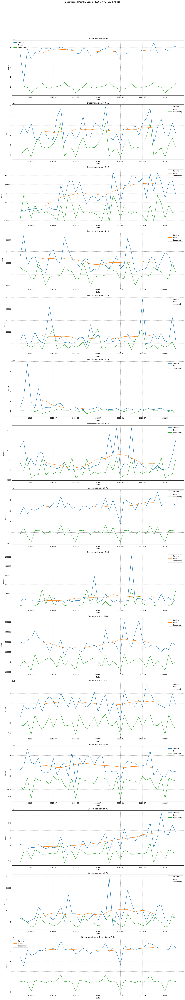

In [995]:
def decompose_series(df: pd.DataFrame) -> None:
    """
    This function decomposes the time series into trend, seasonality, and residuals for each product.
    ---
    Args:
        df (pd.DataFrame): DataFrame that contains the timeseries data with period months as index
                            and products as columns
        
    Returns: None
    """
    # Convert Period index to DatetimeIndex
    df.index = pd.to_datetime(df.index.to_timestamp())
    
    # Figure
    num_rows = len(df.columns)
    fig, axes = plt.subplots(nrows=num_rows, ncols=1, figsize=(16, 6 * num_rows), facecolor='w')

    for i, col in enumerate(df.columns):
        # Decomposition
        decomposition = seasonal_decompose(df[col])
        trend = decomposition.trend
        seasonal = decomposition.seasonal
        
        # Plotting
        axes[i].plot(df.index, df[col], label='Original')
        axes[i].plot(df.index, trend, label='Trend')
        axes[i].plot(df.index, seasonal, label='Seasonality')
        

        # Labels and legend
        axes[i].set_title(f'Decomposition of {col}')
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Values')
        axes[i].legend()
        axes[i].grid(linestyle=":", color='grey')

    plt.suptitle('Decomposed Monthly Orders (2018-10-01 - 2022-04-01)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example usage
decompose_series(sales.iloc[:, :15])

##### Tests to check stationarity

In [996]:
def perform_adf_test(df: pd.DataFrame) -> None:
    """
    Augmented Dickey Fuller Test
    - The null hypothesis for this test is that there is a unit root (non_stationary)
    - The alternate hypothesis is that there is no unit root in the series.
    ---
    Args:
        df (pd.DataFrame): DataFrame containing the timeseries data
        
    Returns: None
    """
    print('\nAugmented Dickey Fuller Test')
    print('---'*15)
    
    for col in df.columns:
        adf_stat, p_value, n_lags, n_observ, crit_vals, icbest = adfuller(df[col])
        
        print(f'Column: {col}')
        print('ADF Statistic: %f' % adf_stat)
        print('p-value: %f' % p_value)
        print(f'Number of lags used: {n_lags}')
        print(f'Number of observations used: {n_observ}')
        print(f'T values corresponding to adfuller test:')
        for key, value in crit_vals.items():
            print(key, value)

def perform_kpss_test(df: pd.DataFrame) -> None:
    """
    Kwiatkowski-Phillips-Schmidt-Shin test for stationary.
    - The null hypothesis for the test is that the data is stationary.
    - The alternate hypothesis for the test is that the data is not stationary.
    ---
    Args:
        df (pd.DataFrame): DataFrame containing the timeseries data
        
    Returns: None
    """
    print('\nKwiatkowski-Phillips-Schmidt-Shin test')
    print('---'*15)
    
    for col in df.columns:
        kpss_stat, p_value, n_lags, crit_vals = kpss(df[col], nlags='auto', store=False)
        
        print(f'Column: {col}')
        print('KPSS Statistic: %f' % kpss_stat)
        print('p-value: %f' % p_value)
        print(f'Number of lags used: {n_lags}')
        print(f'Critical values of KPSS test:')
        for key, value in crit_vals.items():
            print(key, value)

# Example usage
perform_adf_test(sales.iloc[:, :15])
perform_kpss_test(sales.iloc[:, :15])


Augmented Dickey Fuller Test
---------------------------------------------
Column: #1
ADF Statistic: -6.002443
p-value: 0.000000
Number of lags used: 0
Number of observations used: 42
T values corresponding to adfuller test:
1% -3.596635636000432
5% -2.933297331821618
10% -2.6049909750566895
Column: #11
ADF Statistic: -5.577923
p-value: 0.000001
Number of lags used: 1
Number of observations used: 41
T values corresponding to adfuller test:
1% -3.60098336718852
5% -2.9351348158036012
10% -2.6059629803688282
Column: #12
ADF Statistic: -3.869337
p-value: 0.002272
Number of lags used: 0
Number of observations used: 42
T values corresponding to adfuller test:
1% -3.596635636000432
5% -2.933297331821618
10% -2.6049909750566895
Column: #13
ADF Statistic: -3.254199
p-value: 0.017054
Number of lags used: 2
Number of observations used: 40
T values corresponding to adfuller test:
1% -3.6055648906249997
5% -2.937069375
10% -2.606985625
Column: #14
ADF Statistic: -6.871822
p-value: 0.000000
Number

ADF NULL -----> a unit root is present in a time series sample (non stationary)
KPSS NULL ----> a univariate time series is trend stationary 




Since ADF Statistic  < -3.43 and p-value: < 0.05 we can reject the null hypothesis in the favor of the aternative (#1,#11,#12,#14,#16,#3,#36,#4,#5,#6,#9,total)
Since ADF Statistic  > -3.43 and p-value: > 0.05 we fail to reject the null hypothesis (#13,#20,#8)

Since KPSS Statistic < 0.463 and > 0.05 we fail to reject the null hypothesis (#1,#11,#13,#14,#20,#36,#4,#5,#6,#9,Total)
Since KPSS Statistic > 0.463 and < 0.05 we can reject the null hypothesis in the favor of the aternative ('#12',#16,#3,#8)



Stationary time series
#1, #11, #14, #36, #4, #5, #6, #9, total

Non-Stationary time series
#8

Conflicting Results
#13, #12, #16, #3, #20

In [997]:
market_adjusted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 219 non-null    object 
 1   MAB_ELE_PRO156       219 non-null    float64
 2   MAB_ELE_PRO250       219 non-null    float64
 3   MAB_ELE_SHP250       219 non-null    float64
 4   MAB_ELE_PRO276       219 non-null    float64
 5   MAB_ELE_PRO380       219 non-null    float64
 6   MAB_ELE_SHP380       219 non-null    float64
 7   MAB_ELE_PRO392       219 non-null    float64
 8   MAB_ELE_PRO756       218 non-null    float64
 9   MAB_ELE_PRO826       219 non-null    float64
 10  MAB_ELE_SHP826       201 non-null    float64
 11  MAB_ELE_PRO840       219 non-null    float64
 12  MAB_ELE_SHP840       218 non-null    float64
 13  MAB_ELE_PRO1100      219 non-null    float64
 14  RohiBASEMET1000_org  219 non-null    float64
 15  RohiENERGY1000_org   219 non-null    flo

##### Market indexes variation in time 

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<Figure size 1000x600 with 0 Axes>

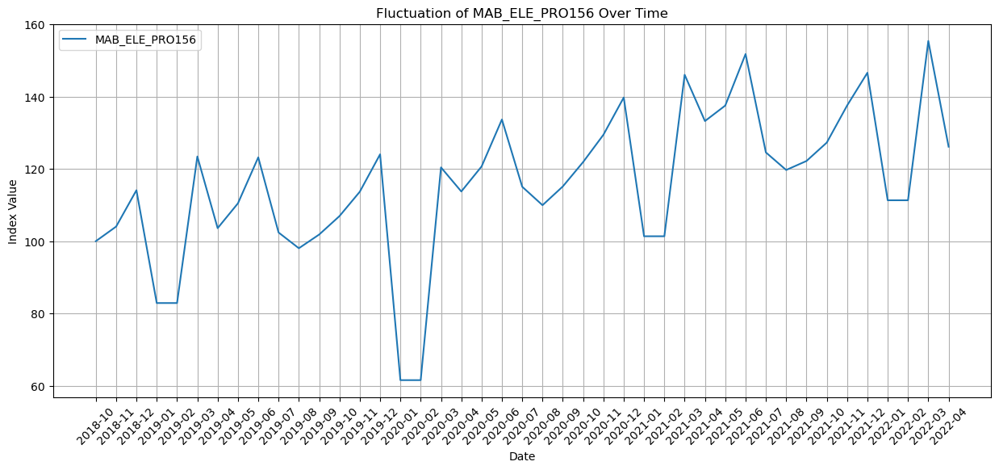

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


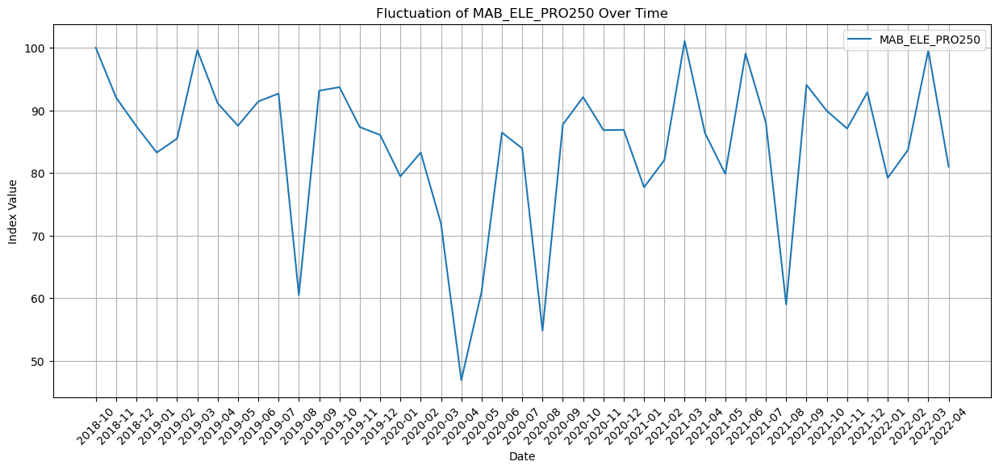

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


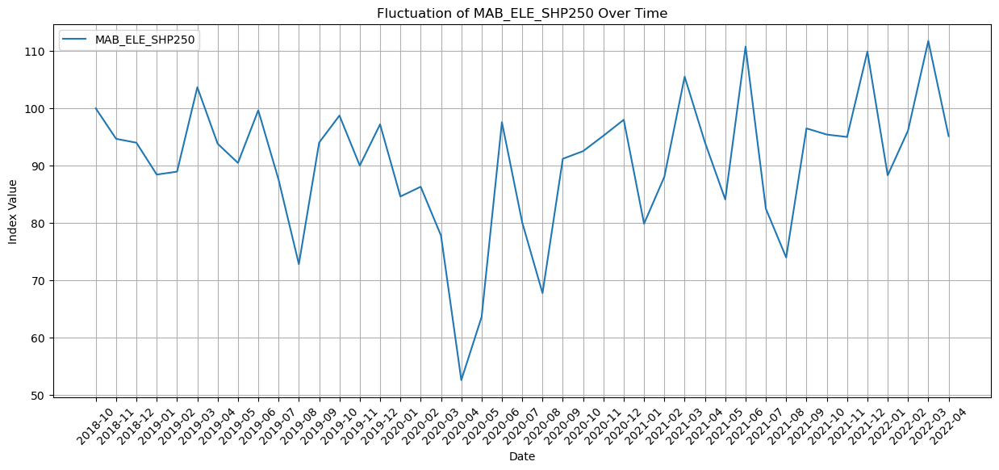

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


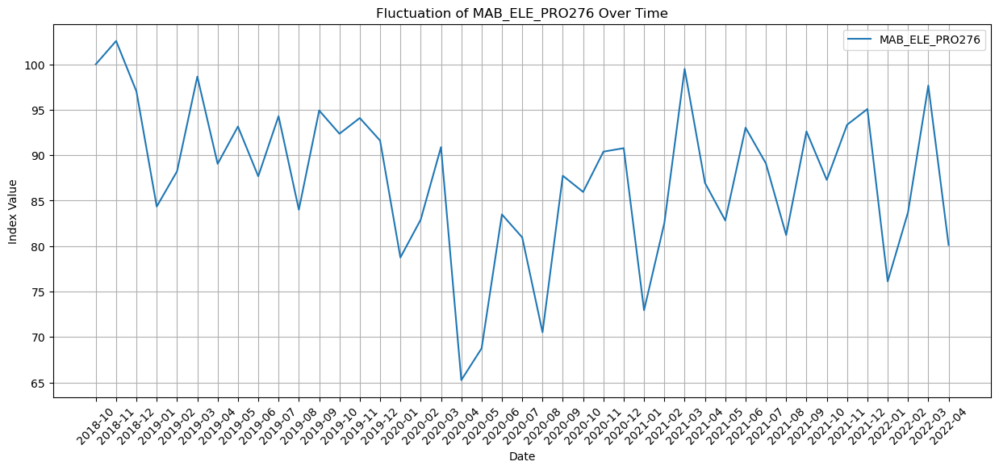

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


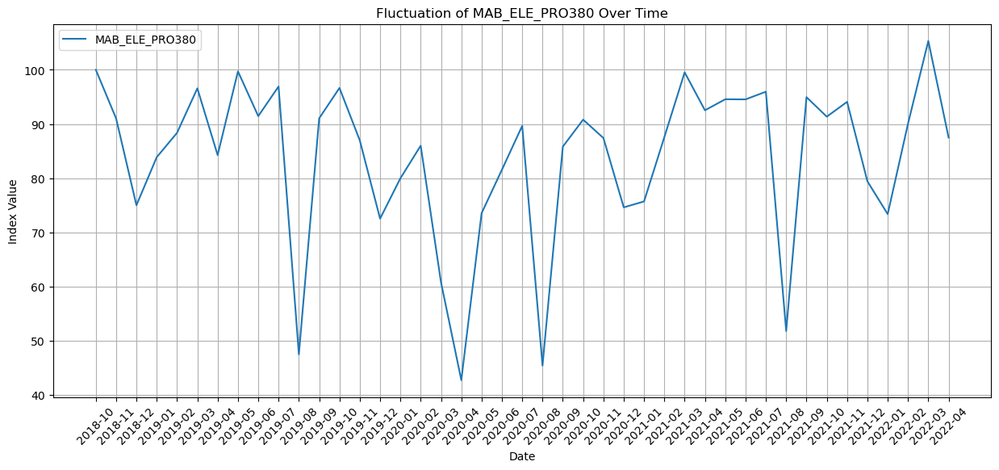

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


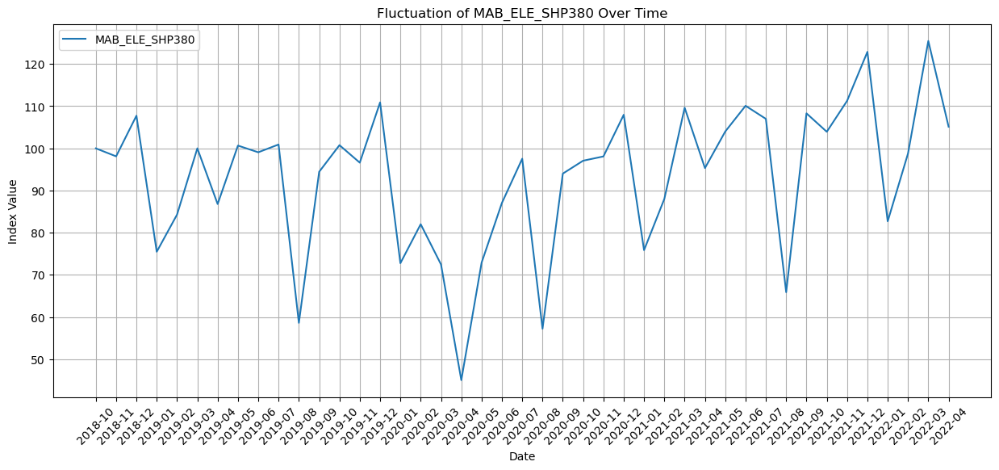

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


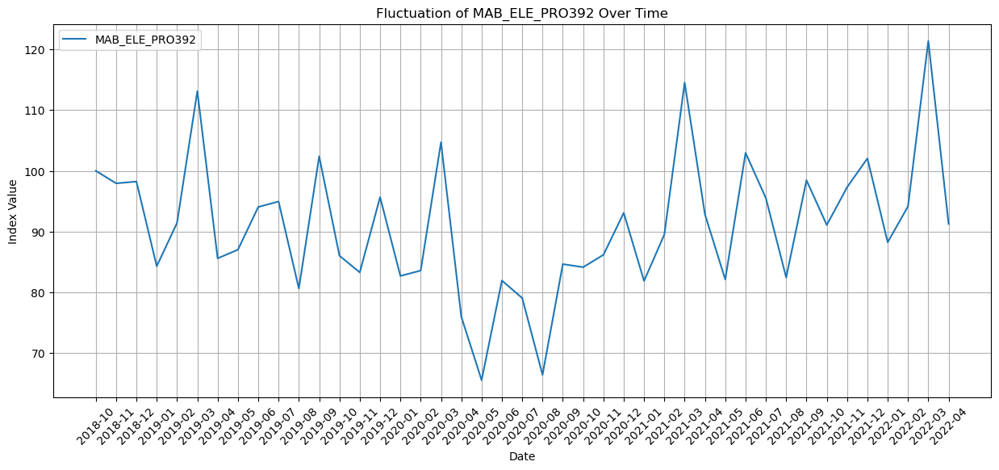

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


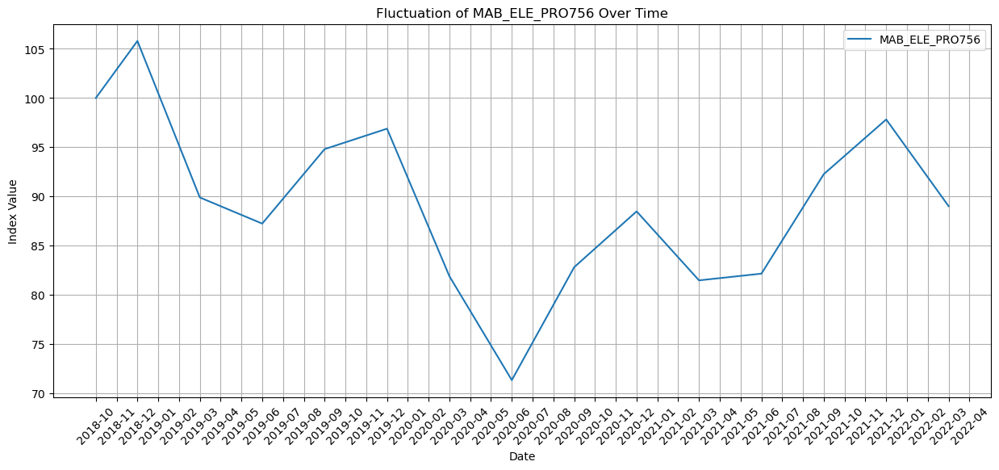

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


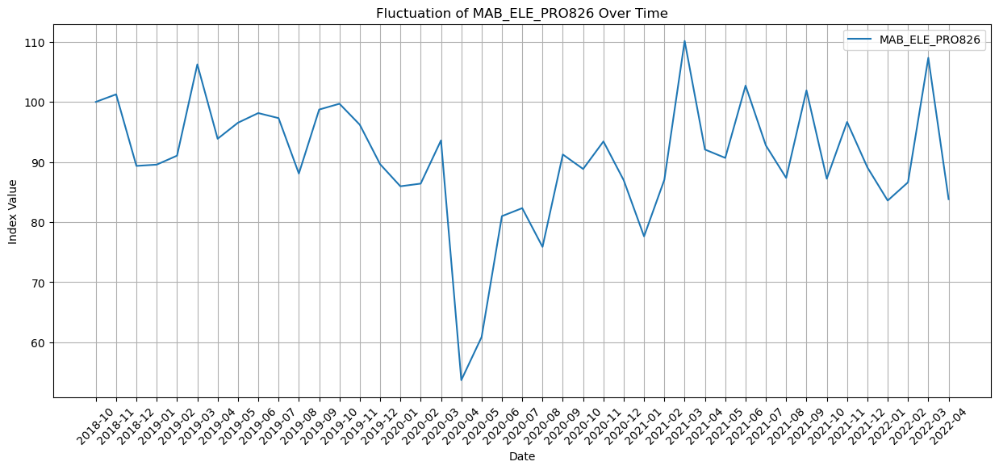

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


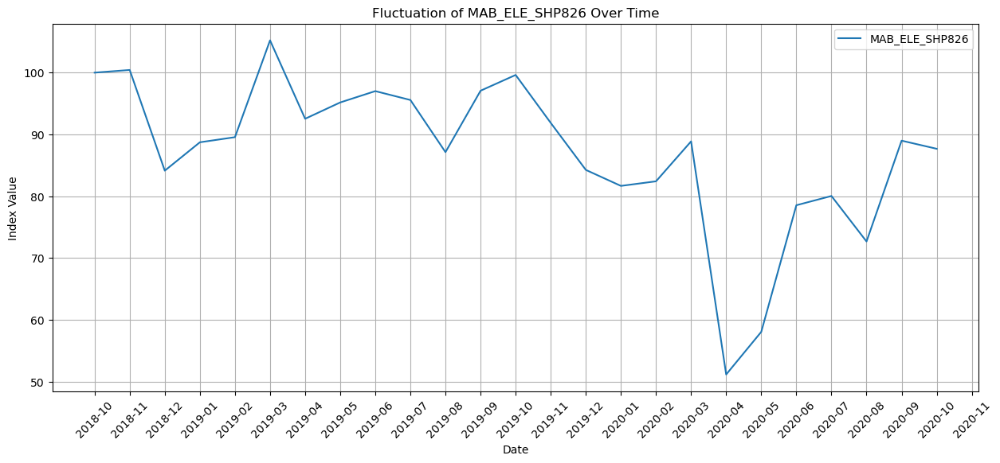

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


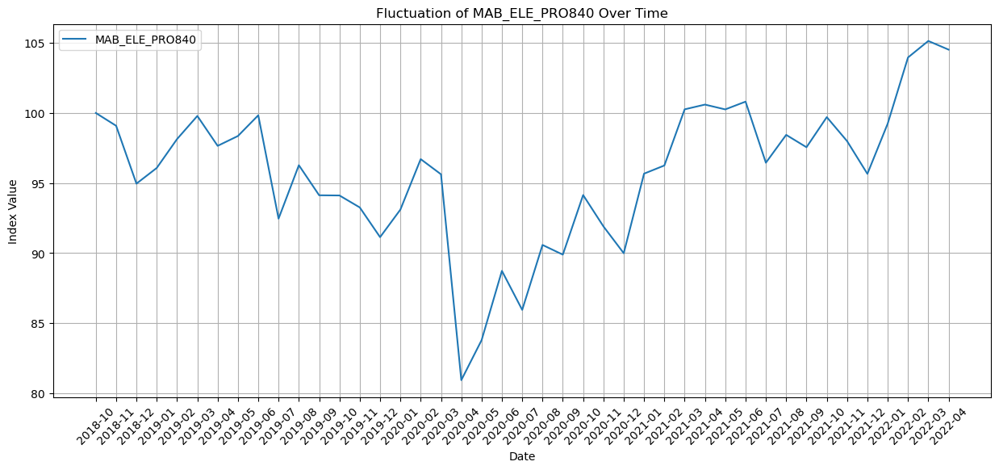

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


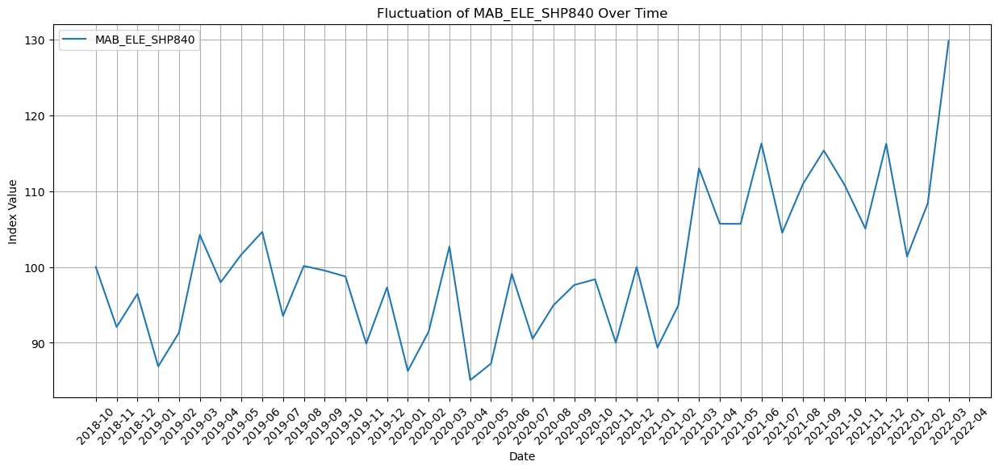

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


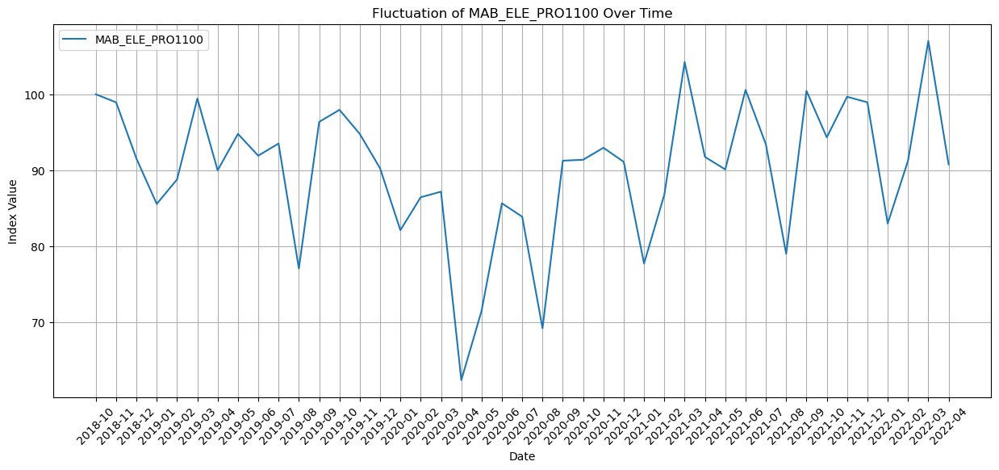

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


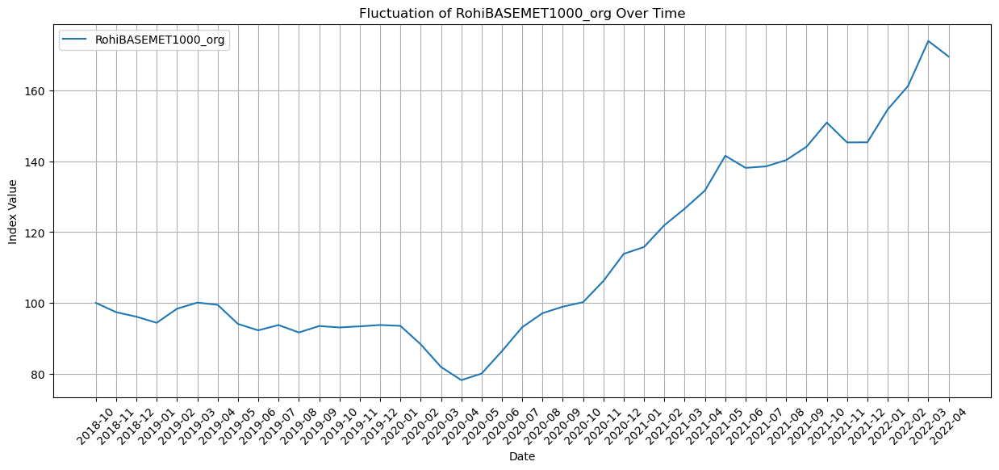

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


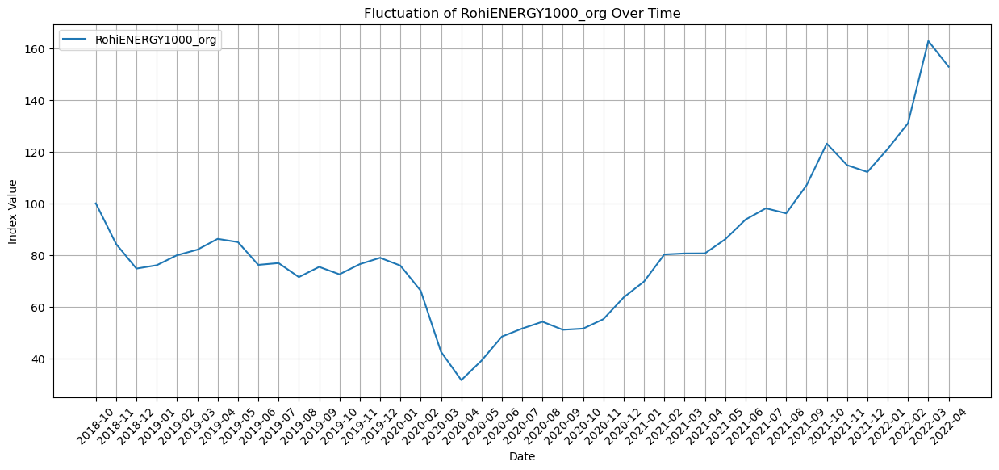

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


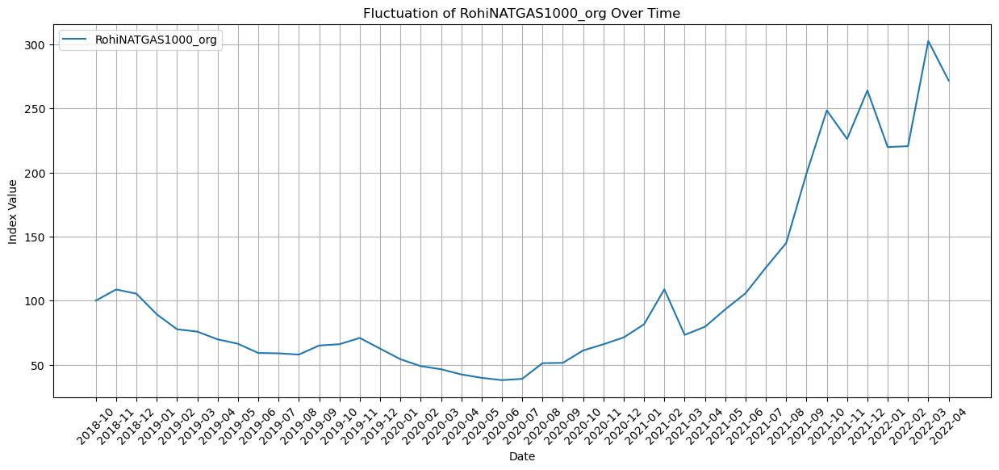

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


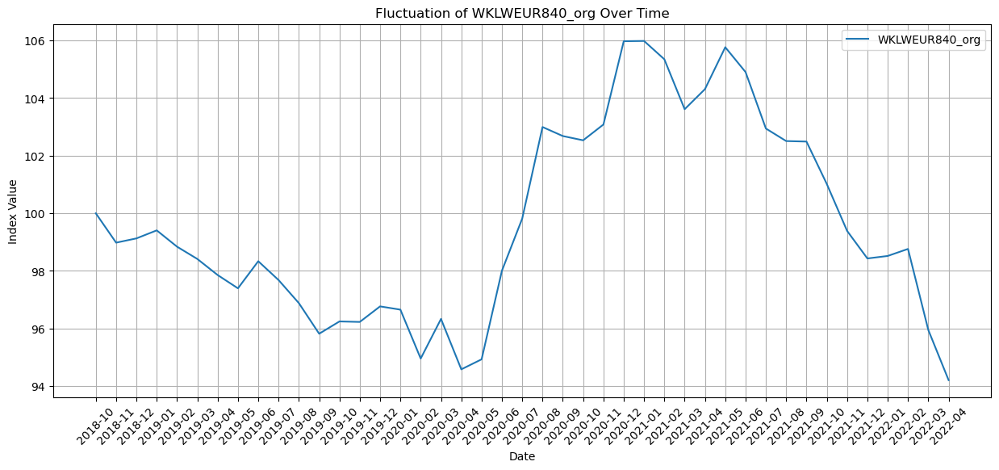

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


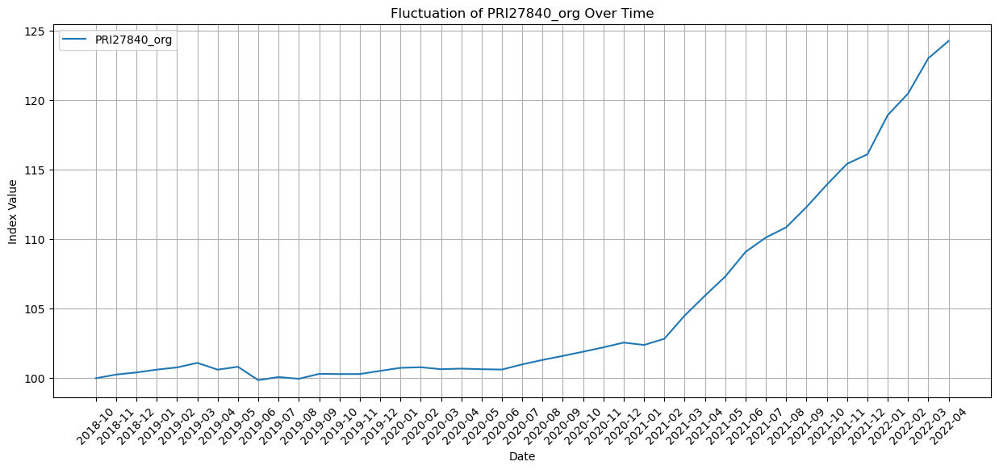

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


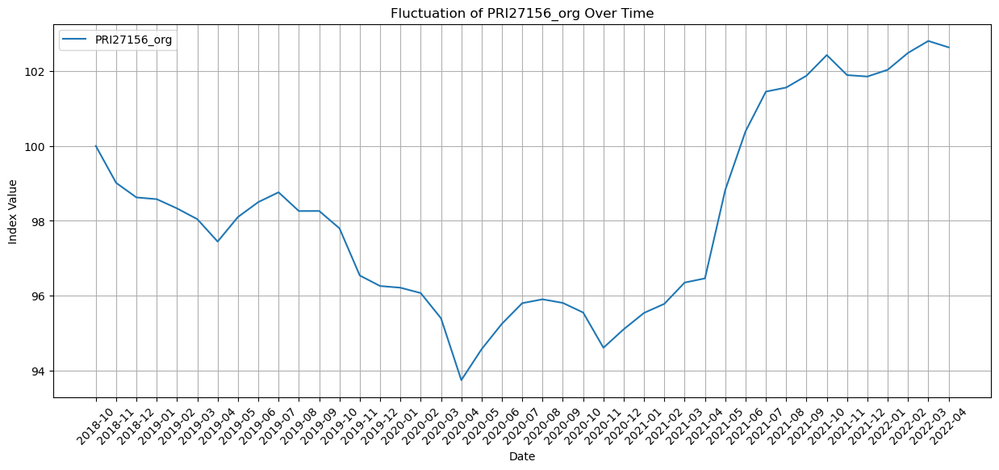

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


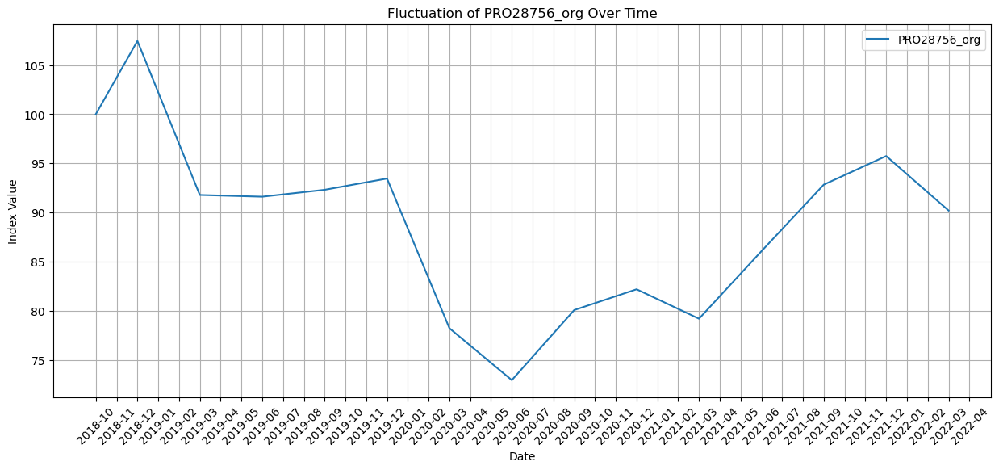

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


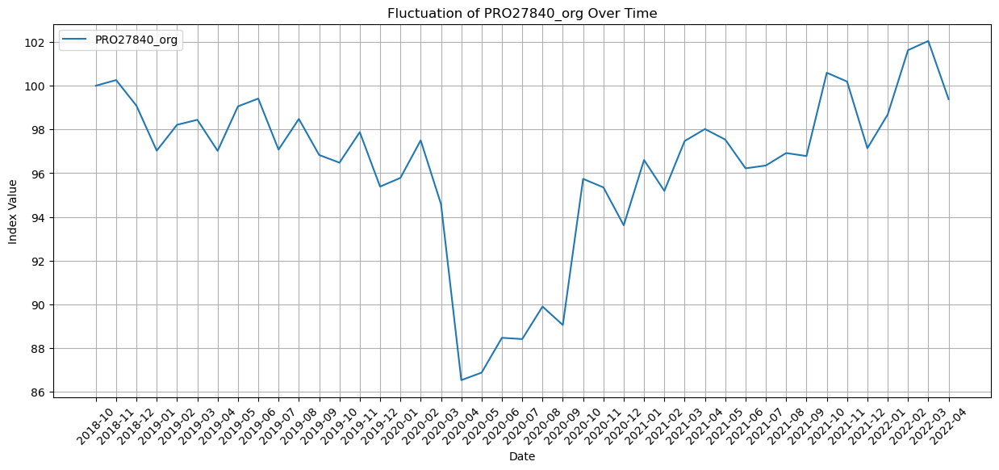

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


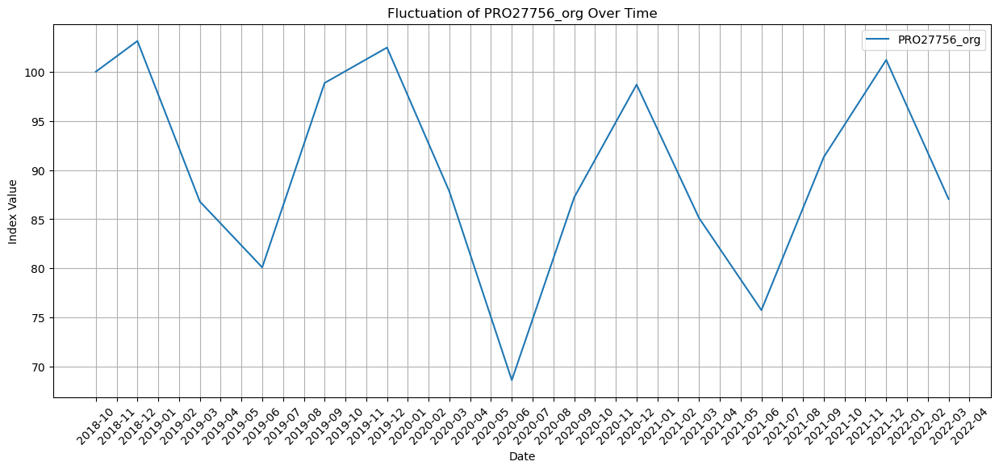

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


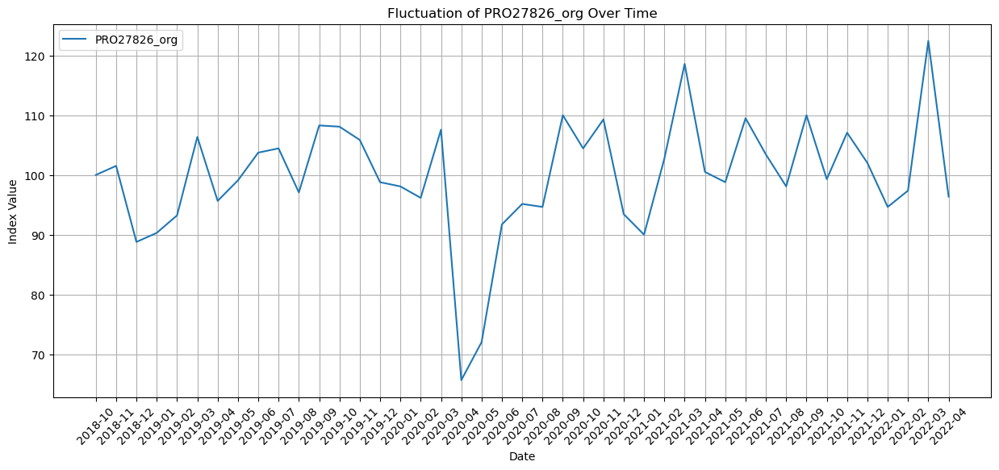

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


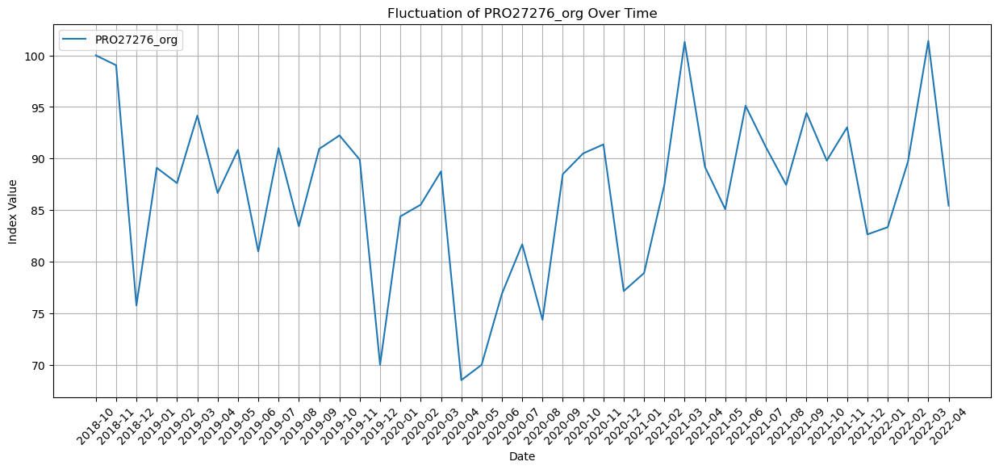

In [998]:
# Filter the DataFrame for rows starting from '2018-10'
df_filtered = market_adjusted[market_adjusted['date'] >= '2018-10']

# Set the size of each individual plot
plt.figure(figsize=(10, 6))

# Iterate over each column except 'date' and create a separate plot
for i, column in enumerate(df_filtered.columns):
    if column != 'date':
        plt.figure(figsize=(15, 6))  # Set the size of the plot
        plt.plot(df_filtered['date'], df_filtered[column], label=column)
        plt.xlabel('Date')
        plt.ylabel('Index Value')
        plt.title(f'Fluctuation of {column} Over Time')
        plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
        plt.legend()
        plt.grid(True)
        plt.show()

<h2>3.1 Treating Missing/Strange Values </h2>


In [999]:

# Filter the DataFrame based on the condition where date is '2018-10' until the end
filtered_data = market_adjusted[market_adjusted['date'] >= '2018-10']

# Check missing values in the filtered DataFrame
missing_values = filtered_data.isna().sum()

# Calculate the percentage of missing values
percentage_missing = (missing_values / filtered_data.shape[0]) * 100

# Combine the results into a new DataFrame for better readability
missing_data_summary = pd.DataFrame({
    'Variable': missing_values.index,
    'Missing Values': missing_values.values,
    'Percentage Missing': percentage_missing.values
})

# Display the summary
print(missing_data_summary)


               Variable  Missing Values  Percentage Missing
0                  date               0                0.00
1        MAB_ELE_PRO156               0                0.00
2        MAB_ELE_PRO250               0                0.00
3        MAB_ELE_SHP250               0                0.00
4        MAB_ELE_PRO276               0                0.00
5        MAB_ELE_PRO380               0                0.00
6        MAB_ELE_SHP380               0                0.00
7        MAB_ELE_PRO392               0                0.00
8        MAB_ELE_PRO756               1                2.33
9        MAB_ELE_PRO826               0                0.00
10       MAB_ELE_SHP826              18               41.86
11       MAB_ELE_PRO840               0                0.00
12       MAB_ELE_SHP840               1                2.33
13      MAB_ELE_PRO1100               0                0.00
14  RohiBASEMET1000_org               0                0.00
15   RohiENERGY1000_org               0 

In [1000]:
# Define the time series data for each column
time_series_data_MAB_ELE_SHP840 = market_adjusted['MAB_ELE_SHP840'][:-1]
time_series_data_PRO28756_org = market_adjusted['PRO28756_org'][:-1]
time_series_data_PRO27756_org = market_adjusted['PRO27756_org'][:-1]
time_series_data_MAB_ELE_PRO756 = market_adjusted['MAB_ELE_PRO756'][:-1]

# Create a DataFrame with proper date ranges for each column
start_date = '2004-02-01'
end_date = '2022-04-01'
date_range = pd.date_range(start=start_date, end=end_date, freq='M')

data_with_dates_MAB_ELE_SHP840 = pd.DataFrame({'Date': date_range, 'Value': time_series_data_MAB_ELE_SHP840})
data_with_dates_PRO28756_org = pd.DataFrame({'Date': date_range, 'Value': time_series_data_PRO28756_org})
data_with_dates_PRO27756_org = pd.DataFrame({'Date': date_range, 'Value': time_series_data_PRO27756_org})
data_with_dates_MAB_ELE_PRO756 = pd.DataFrame({'Date': date_range, 'Value': time_series_data_MAB_ELE_PRO756})

# Set the date as the index for each DataFrame
data_with_dates_MAB_ELE_SHP840.set_index('Date', inplace=True)
data_with_dates_PRO28756_org.set_index('Date', inplace=True)
data_with_dates_PRO27756_org.set_index('Date', inplace=True)
data_with_dates_MAB_ELE_PRO756.set_index('Date', inplace=True)

# Fit ARIMA models to the time series data for each column
model_MAB_ELE_SHP840 = ARIMA(data_with_dates_MAB_ELE_SHP840, order=(1, 1, 1))
model_fit_MAB_ELE_SHP840 = model_MAB_ELE_SHP840.fit()

model_PRO28756_org = ARIMA(data_with_dates_PRO28756_org, order=(1, 1, 1))
model_fit_PRO28756_org = model_PRO28756_org.fit()

model_PRO27756_org = ARIMA(data_with_dates_PRO27756_org, order=(1, 1, 1))
model_fit_PRO27756_org = model_PRO27756_org.fit()

model_MAB_ELE_PRO756 = ARIMA(data_with_dates_MAB_ELE_PRO756, order=(1, 1, 1))
model_fit_MAB_ELE_PRO756 = model_MAB_ELE_PRO756.fit()

# Forecast the values for April 2022 for each column
forecast_value_MAB_ELE_SHP840 = model_fit_MAB_ELE_SHP840.forecast(steps=1)[0]
forecast_value_PRO28756_org = model_fit_PRO28756_org.forecast(steps=1)[0]
forecast_value_PRO27756_org = model_fit_PRO27756_org.forecast(steps=1)[0]
forecast_value_MAB_ELE_PRO756 = model_fit_MAB_ELE_PRO756.forecast(steps=1)[0]

# Print the forecasted values for each column
print("Forecasted value for MAB_ELE_SHP840 in 2022-04:", forecast_value_MAB_ELE_SHP840)
print("Forecasted value for PRO28756_org in 2022-04:", forecast_value_PRO28756_org)
print("Forecasted value for PRO27756_org in 2022-04:", forecast_value_PRO27756_org)
print("Forecasted value for MAB_ELE_PRO756 in 2022-04:", forecast_value_MAB_ELE_PRO756)

market_adjusted.iloc[-1, market_adjusted.columns.get_loc('MAB_ELE_SHP840')] = forecast_value_MAB_ELE_SHP840
market_adjusted.iloc[-1, market_adjusted.columns.get_loc('PRO28756_org')] = forecast_value_PRO28756_org
market_adjusted.iloc[-1, market_adjusted.columns.get_loc('PRO27756_org')] = forecast_value_PRO27756_org
market_adjusted.iloc[-1, market_adjusted.columns.get_loc('MAB_ELE_PRO756')] = forecast_value_MAB_ELE_PRO756




Forecasted value for MAB_ELE_SHP840 in 2022-04: 113.7370256823636
Forecasted value for PRO28756_org in 2022-04: 89.42177051855056
Forecasted value for PRO27756_org in 2022-04: 84.96633324493483
Forecasted value for MAB_ELE_PRO756 in 2022-04: 87.29493810642177


In [1001]:

# Filter the DataFrame based on the condition where date is '2018-10' until the end
filtered_data = market_adjusted[market_adjusted['date'] >= '2018-10']

# Check missing values in the filtered DataFrame
missing_values = filtered_data.isna().sum()

# Calculate the percentage of missing values
percentage_missing = (missing_values / filtered_data.shape[0]) * 100

# Combine the results into a new DataFrame for better readability
missing_data_summary = pd.DataFrame({
    'Variable': missing_values.index,
    'Missing Values': missing_values.values,
    'Percentage Missing': percentage_missing.values
})

# Display the summary
print(missing_data_summary)


               Variable  Missing Values  Percentage Missing
0                  date               0                0.00
1        MAB_ELE_PRO156               0                0.00
2        MAB_ELE_PRO250               0                0.00
3        MAB_ELE_SHP250               0                0.00
4        MAB_ELE_PRO276               0                0.00
5        MAB_ELE_PRO380               0                0.00
6        MAB_ELE_SHP380               0                0.00
7        MAB_ELE_PRO392               0                0.00
8        MAB_ELE_PRO756               0                0.00
9        MAB_ELE_PRO826               0                0.00
10       MAB_ELE_SHP826              18               41.86
11       MAB_ELE_PRO840               0                0.00
12       MAB_ELE_SHP840               0                0.00
13      MAB_ELE_PRO1100               0                0.00
14  RohiBASEMET1000_org               0                0.00
15   RohiENERGY1000_org               0 

In [1002]:
# Assuming 'date' is a column in the DataFrame 'market_adjusted'
market_adjusted['date'] = pd.to_datetime(market_adjusted['date'])  

# Filter the DataFrame to remove rows where the date is less than '2018-04'
market_adjusted = market_adjusted[market_adjusted['date'] >= '2018-10']


In [1003]:
market_adjusted.drop(columns=['MAB_ELE_SHP826'], inplace=True)
market_adjusted1=market_adjusted.copy()


market_adjusted1.set_index(market_adjusted1.columns[0], inplace=True)
market_adjusted1
# Convert index to datetime format
market_adjusted1.index = pd.to_datetime(market_adjusted1.index)

# Convert index to PeriodIndex with monthly frequency
market_adjusted1.index = market_adjusted1.index.to_period('M')

<h2>3.2 Feature Selection </h2>

In [1004]:

#Defining new dataframes with the market column and sales column of specific group product

market_1 = pd.merge(market_adjusted1, sales[['#1']], left_index=True, right_index=True)
market_11 = pd.merge(market_adjusted1, sales[['#11']], left_index=True, right_index=True)
market_12 = pd.merge(market_adjusted1, sales[['#12']], left_index=True, right_index=True)
market_13 = pd.merge(market_adjusted1, sales[['#13']], left_index=True, right_index=True)
market_14 = pd.merge(market_adjusted1, sales[['#14']], left_index=True, right_index=True)
market_16 = pd.merge(market_adjusted1, sales[['#16']], left_index=True, right_index=True)
market_20 = pd.merge(market_adjusted1, sales[['#20']], left_index=True, right_index=True)
market_3 = pd.merge(market_adjusted1, sales[['#3']], left_index=True, right_index=True)
market_36 = pd.merge(market_adjusted1, sales[['#36']], left_index=True, right_index=True)
market_4 = pd.merge(market_adjusted1, sales[['#4']], left_index=True, right_index=True)
market_5 = pd.merge(market_adjusted1, sales[['#5']], left_index=True, right_index=True)
market_9 = pd.merge(market_adjusted1, sales[['#9']], left_index=True, right_index=True)
market_8 = pd.merge(market_adjusted1, sales[['#8']], left_index=True, right_index=True)
market_6 = pd.merge(market_adjusted1, sales[['#6']], left_index=True, right_index=True)

In [1005]:
#Defining target(y) and depedent features(M)

M1 = market_1.copy()
y1 = M1.pop('#1')

M11 = market_11.copy()
y11 = M11.pop('#11')

M12 = market_12.copy()
y12 = M12.pop('#12')

M13 = market_13.copy()
y13 = M13.pop('#13')

M14 = market_14.copy()
y14 = M14.pop('#14')

M16 = market_16.copy()
y16 = M16.pop('#16')

M20 = market_20.copy()
y20 = M20.pop('#20')

M3 = market_3.copy()
y3 = M3.pop('#3')

M36 = market_36.copy()
y36 = M36.pop('#36')

M4 = market_4.copy()
y4 = M4.pop('#4')

M5 = market_5.copy()
y5 = M5.pop('#5')

M6 = market_6.copy()
y6 = M6.pop('#6')

M8 = market_8.copy()
y8 = M8.pop('#8')

M9 = market_9.copy()
y9 = M9.pop('#9')



In [1006]:
def make_mi_scores(M, y):
    mi_scores = mutual_info_regression(M, y, discrete_features=False)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=M.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

# Define a list of tuples containing (M, y) pairs
data_pairs = [(M1, y1), (M11, y11), (M12, y12), (M13, y13), (M14, y14),
              (M16, y16), (M20, y20), (M3, y3), (M36, y36), (M4, y4),
              (M5, y5), (M6, y6), (M8, y8), (M9, y9)]

# Dictionary to store MI scores for each pair
mi_scores_dict = {}

# Calculate MI scores for each pair
for idx, (M, y) in enumerate(data_pairs, start=1):
    mi_scores_dict[f'mi_scores_{idx}'] = make_mi_scores(M, y)

# Display MI scores for each pair
for key, value in mi_scores_dict.items():
    print(f"MI Scores for pair {key}:")
    print(value)
    print("\n")

MI Scores for pair mi_scores_1:
MAB_ELE_PRO1100       0.16
PRO28756_org          0.10
MAB_ELE_PRO156        0.10
RohiENERGY1000_org    0.09
RohiBASEMET1000_org   0.09
RohiNATGAS1000_org    0.07
WKLWEUR840_org        0.07
PRO27756_org          0.05
MAB_ELE_PRO380        0.05
MAB_ELE_SHP250        0.05
MAB_ELE_SHP380        0.05
MAB_ELE_PRO826        0.05
MAB_ELE_SHP840        0.05
PRI27156_org          0.04
MAB_ELE_PRO392        0.04
MAB_ELE_PRO250        0.03
PRI27840_org          0.02
PRO27840_org          0.00
PRO27826_org          0.00
MAB_ELE_PRO276        0.00
MAB_ELE_PRO840        0.00
MAB_ELE_PRO756        0.00
PRO27276_org          0.00
Name: MI Scores, dtype: float64


MI Scores for pair mi_scores_2:
RohiNATGAS1000_org    0.07
MAB_ELE_SHP380        0.07
MAB_ELE_PRO276        0.05
MAB_ELE_PRO156        0.05
PRI27156_org          0.03
RohiENERGY1000_org    0.02
MAB_ELE_PRO250        0.01
PRO27826_org          0.00
PRO27756_org          0.00
PRO27840_org          0.00
PRO28756_or

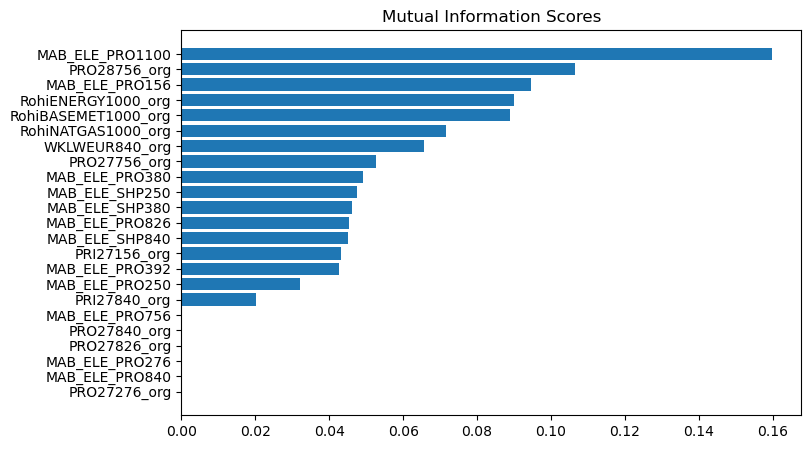

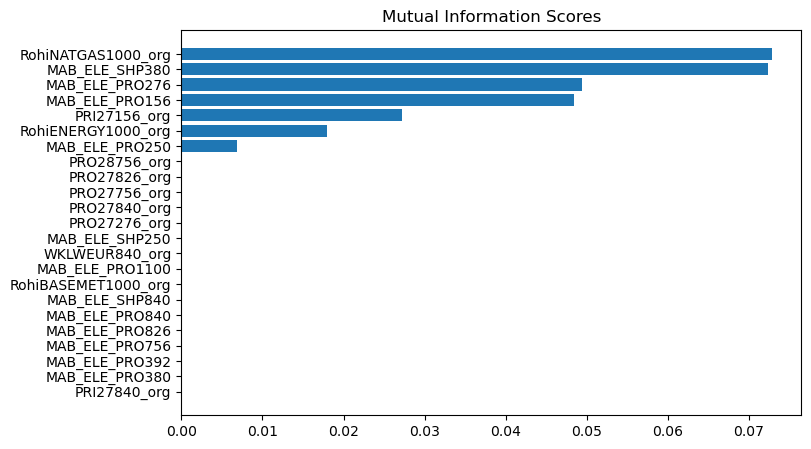

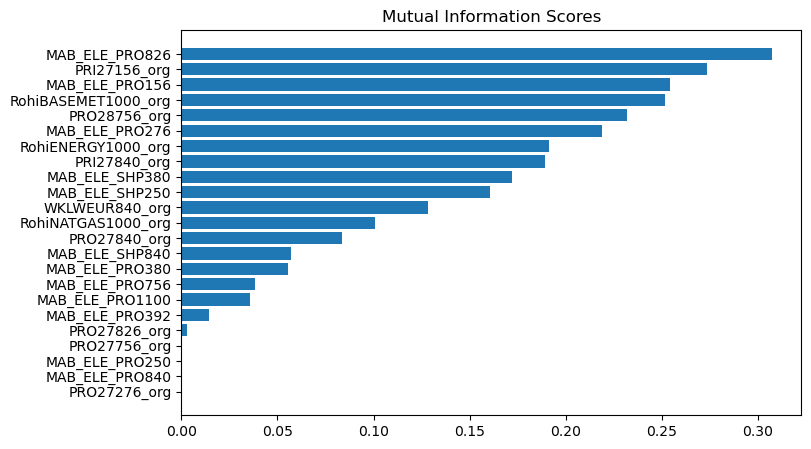

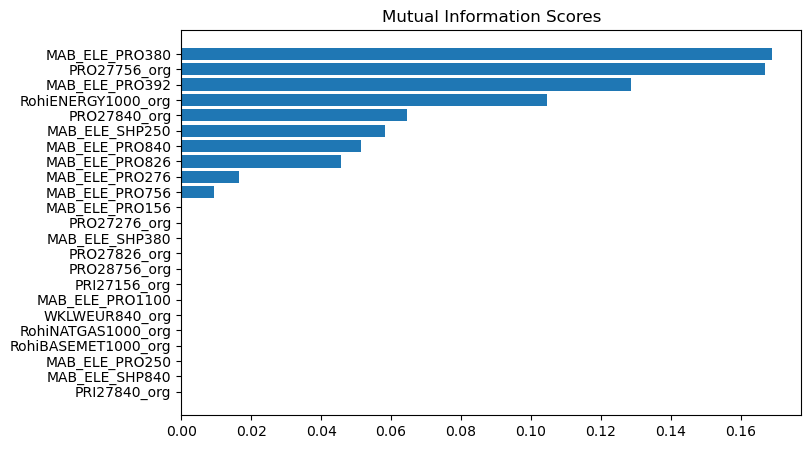

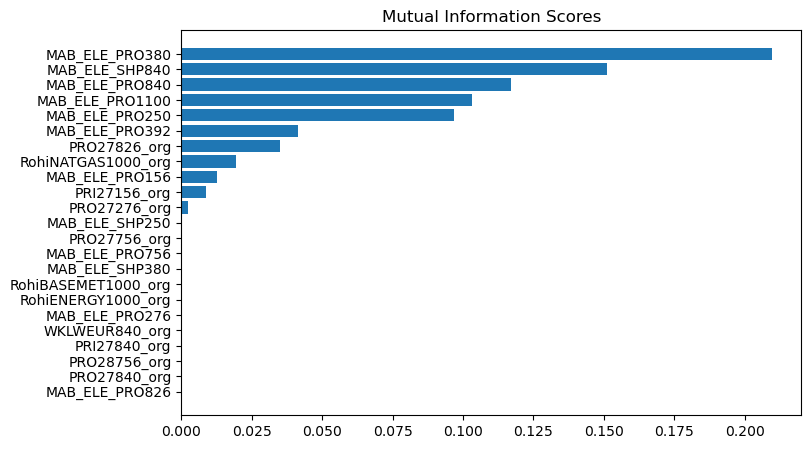

...

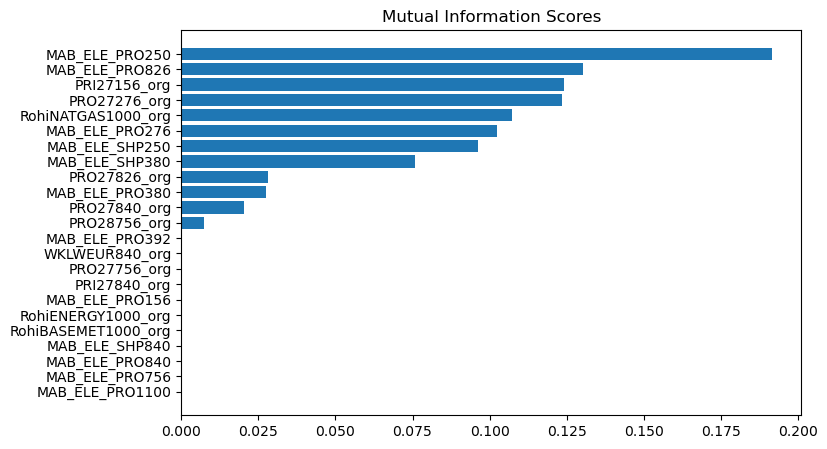

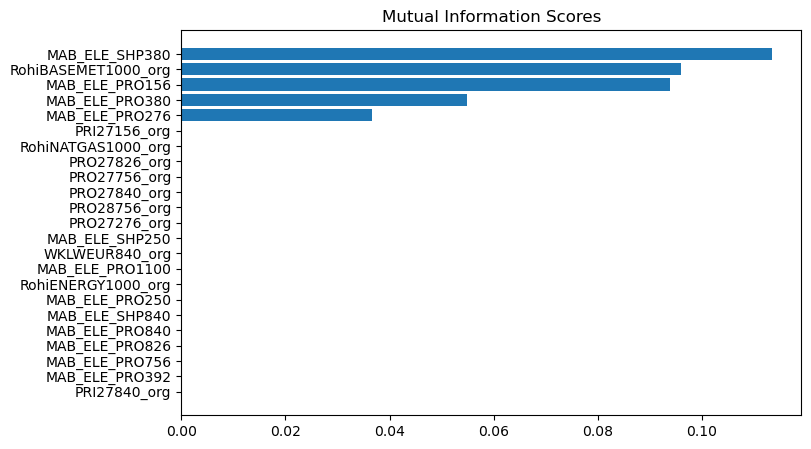

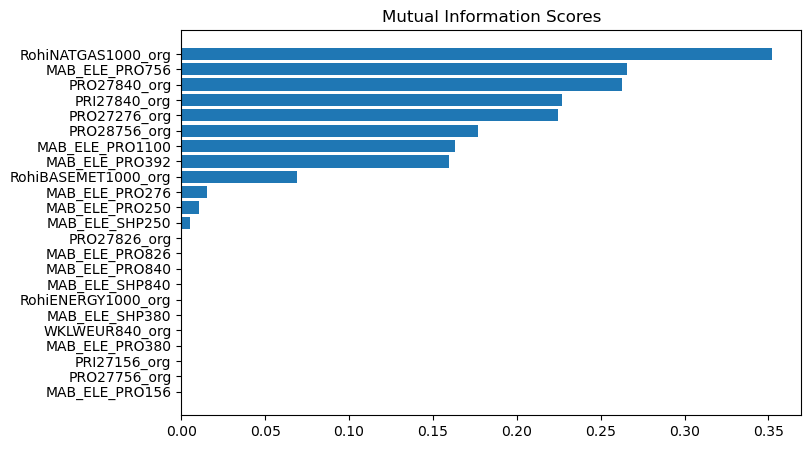

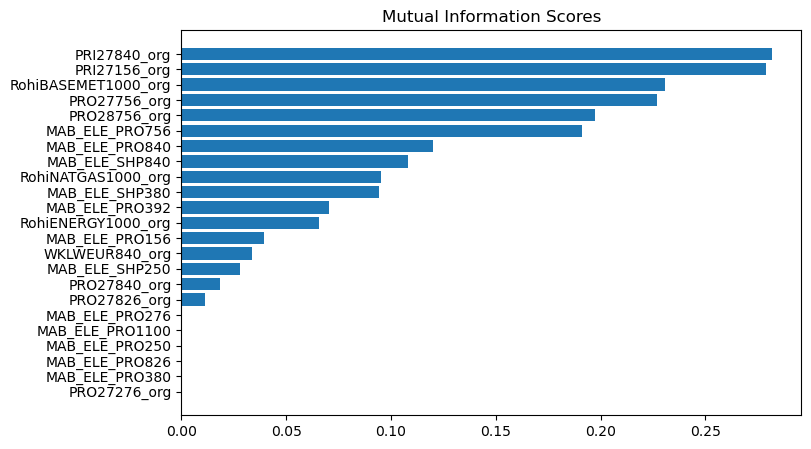

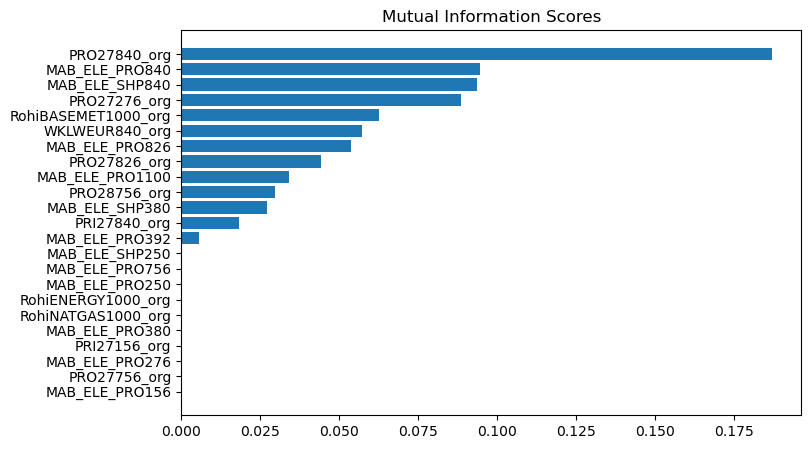

In [1007]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")
    plt.show()

# Define a list of tuples containing (M, y) pairs
data_pairs = [(M1, y1), (M11, y11), (M12, y12), (M13, y13), (M14, y14),
              (M16, y16), (M20, y20), (M3, y3), (M36, y36), (M4, y4),
              (M5, y5), (M6, y6), (M8, y8), (M9, y9)]

# Calculate MI scores for each pair and plot them
for idx, (M, y) in enumerate(data_pairs, start=1):
    mi_scores = make_mi_scores(M, y)
    plt.figure(dpi=100, figsize=(8, 5))
    plot_mi_scores(mi_scores)

In [1008]:
# Loop through each pair of M and y
for idx, (M, y) in enumerate(data_pairs, start=1):
    # Calculate MI scores for the current pair
    mi_scores = make_mi_scores(M, y)
    
    # Filter columns with MI scores different from 0
    non_zero_mi_columns = mi_scores[mi_scores != 0].index
    
    # Update the M_ dataframe to keep only selected columns
    globals()[f'M{idx}'] = M[non_zero_mi_columns]

In [1009]:
M1.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 43 entries, 2018-10 to 2022-04
Freq: M
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   MAB_ELE_PRO1100      43 non-null     float64
 1   PRO28756_org         43 non-null     float64
 2   RohiENERGY1000_org   43 non-null     float64
 3   RohiBASEMET1000_org  43 non-null     float64
 4   MAB_ELE_PRO156       43 non-null     float64
 5   RohiNATGAS1000_org   43 non-null     float64
 6   WKLWEUR840_org       43 non-null     float64
 7   PRO27756_org         43 non-null     float64
 8   MAB_ELE_PRO380       43 non-null     float64
 9   MAB_ELE_SHP250       43 non-null     float64
 10  MAB_ELE_SHP380       43 non-null     float64
 11  MAB_ELE_PRO826       43 non-null     float64
 12  MAB_ELE_SHP840       43 non-null     float64
 13  PRI27156_org         43 non-null     float64
 14  MAB_ELE_PRO392       43 non-null     float64
 15  MAB_ELE_PRO250       4

In [1010]:
# Create an empty dictionary to store column counts
column_counts = {}

# Iterate over each M_ dataframe
for idx in range(1, 14 + 1):  # Replace num_of_dataframes with the actual number of M_ dataframes
    M = globals()[f'M{idx}']
    # Update column counts
    for column in M.columns:
        column_counts[column] = column_counts.get(column, 0) + 1

# Sort the dictionary by value in descending order
sorted_columns = sorted(column_counts.items(), key=lambda x: x[1], reverse=True)

# Print the occurrences of all columns
for column, count in sorted_columns:
    print(f"Column '{column}': {count} occurrences")

Column 'MAB_ELE_SHP380': 11 occurrences
Column 'RohiBASEMET1000_org': 10 occurrences
Column 'RohiNATGAS1000_org': 10 occurrences
Column 'PRI27156_org': 10 occurrences
Column 'PRO28756_org': 9 occurrences
Column 'RohiENERGY1000_org': 9 occurrences
Column 'MAB_ELE_PRO380': 9 occurrences
Column 'MAB_ELE_SHP250': 9 occurrences
Column 'MAB_ELE_PRO392': 9 occurrences
Column 'PRO27826_org': 9 occurrences
Column 'MAB_ELE_PRO250': 8 occurrences
Column 'PRI27840_org': 8 occurrences
Column 'PRO27840_org': 8 occurrences
Column 'MAB_ELE_PRO1100': 7 occurrences
Column 'MAB_ELE_PRO156': 7 occurrences
Column 'WKLWEUR840_org': 7 occurrences
Column 'MAB_ELE_PRO826': 7 occurrences
Column 'MAB_ELE_PRO276': 7 occurrences
Column 'PRO27276_org': 7 occurrences
Column 'PRO27756_org': 6 occurrences
Column 'MAB_ELE_SHP840': 6 occurrences
Column 'MAB_ELE_PRO756': 6 occurrences
Column 'MAB_ELE_PRO840': 5 occurrences


<h2>3.3 Feature Engineering </h2>

In [1011]:

# Set the 'date' column as the index
market_adjusted.set_index('date', inplace=True)

# Define the target range for the lagged data
target_range = pd.date_range(start='2018-10', end='2022-04', freq='MS')

# Loop over the columns in market_adjusted and add 12 lags
for col in market_adjusted.columns:
    for lag in range(1, 13):
        # Define the name of the new column with the lag value
        new_col_name = f"{col}_lag{lag}"
        # Shift the data in the column by the lag value
        lagged_data = market_adjusted[col].shift(lag)
        # Set the index of the lagged data to be the same as the target range
        lagged_data.index = target_range
        # Add the lagged data to market_adjusted as a new column
        market_adjusted[new_col_name] = lagged_data

# Convert index to datetime format
market_adjusted.index = pd.to_datetime(market_adjusted.index)

# Convert index to PeriodIndex with monthly frequency
market_adjusted.index = market_adjusted.index.to_period('M')

# Display the modified DataFrame
market_adjusted.head()

1,MAB_ELE_PRO156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_PRO756,MAB_ELE_PRO826,MAB_ELE_PRO840,...,PRO27276_org_lag3,PRO27276_org_lag4,PRO27276_org_lag5,PRO27276_org_lag6,PRO27276_org_lag7,PRO27276_org_lag8,PRO27276_org_lag9,PRO27276_org_lag10,PRO27276_org_lag11,PRO27276_org_lag12
date,,,,,,,,,,,,,,,,,,,,,
2018-10,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-11,104.04,92.02,94.70,102.56,91.02,98.10,97.94,102.90,101.26,99.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12,114.10,87.45,94.02,97.01,75.02,107.74,98.23,105.80,89.35,94.96,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01,82.88,83.25,88.46,84.34,83.88,75.47,84.27,100.50,89.57,96.08,...,100.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-02,82.88,85.47,88.97,88.22,88.37,84.29,91.42,95.20,91.06,98.14,...,99.04,100.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1012]:
market_adjusted.index

PeriodIndex(['2018-10', '2018-11', '2018-12', '2019-01', '2019-02', '2019-03',
             '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09',
             '2019-10', '2019-11', '2019-12', '2020-01', '2020-02', '2020-03',
             '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09',
             '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-03',
             '2021-04', '2021-05', '2021-06', '2021-07', '2021-08', '2021-09',
             '2021-10', '2021-11', '2021-12', '2022-01', '2022-02', '2022-03',
             '2022-04'],
            dtype='period[M]', name='date')

<h2>3.4 Data Scaling </h2>

In [1013]:
# List of columns to remove
columns_to_remove = ['#1', '#11', '#12', '#13', '#14', '#16', '#20', '#3', '#36', '#4', '#5', '#6', '#8', '#9', 'Total_Sales_EUR']

# Drop the specified columns
sales_index = sales.drop(columns=columns_to_remove)
sales_index.head()
sales_index.index

PeriodIndex(['2018-10', '2018-11', '2018-12', '2019-01', '2019-02', '2019-03',
             '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09',
             '2019-10', '2019-11', '2019-12', '2020-01', '2020-02', '2020-03',
             '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09',
             '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-03',
             '2021-04', '2021-05', '2021-06', '2021-07', '2021-08', '2021-09',
             '2021-10', '2021-11', '2021-12', '2022-01', '2022-02', '2022-03',
             '2022-04'],
            dtype='period[M]', name='date')

In [1014]:
# Define the minimum and maximum values for each feature manually
X_min_1 = sales_index['#1_Index'].min()
X_max_1 = sales_index['#1_Index'].max()

X_min_11 = sales_index['#11_Index'].min()
X_max_11 = sales_index['#11_Index'].max()

X_min_12 = sales_index['#12_Index'].min()
X_max_12 = sales_index['#12_Index'].max()

X_min_13 = sales_index['#13_Index'].min()
X_max_13 = sales_index['#13_Index'].max()

X_min_14 = sales_index['#14_Index'].min()
X_max_14 = sales_index['#14_Index'].max()

X_min_16 = sales_index['#16_Index'].min()
X_max_16 = sales_index['#16_Index'].max()

X_min_20 = sales_index['#20_Index'].min()
X_max_20 = sales_index['#20_Index'].max()

X_min_3 = sales_index['#3_Index'].min()
X_max_3 = sales_index['#3_Index'].max()

X_min_36 = sales_index['#36_Index'].min()
X_max_36 = sales_index['#36_Index'].max()

X_min_4 = sales_index['#4_Index'].min()
X_max_4 = sales_index['#4_Index'].max()

X_min_5 = sales_index['#5_Index'].min()
X_max_5 = sales_index['#5_Index'].max()

X_min_6 = sales_index['#6_Index'].min()
X_max_6 = sales_index['#6_Index'].max()

X_min_8 = sales_index['#8_Index'].min()
X_max_8 = sales_index['#8_Index'].max()

X_min_9 = sales_index['#9_Index'].min()
X_max_9 = sales_index['#9_Index'].max()


In [1015]:

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Scale the market_adjusted DataFrame
scaled_market_adjusted = pd.DataFrame(scaler.fit_transform(market_adjusted), columns=market_adjusted.columns, index=market_adjusted.index)

# Scale the sales_index DataFrame
scaled_sales_index = pd.DataFrame(scaler.fit_transform(sales_index), columns=sales_index.columns, index=sales_index.index)

# Merge the scaled DataFrames using the index
merged_data = pd.merge(scaled_sales_index, scaled_market_adjusted, left_index=True, right_index=True)

# Display the merged DataFrame
merged_data.head()

,#1_Index,#11_Index,#12_Index,#13_Index,#14_Index,#16_Index,#20_Index,#3_Index,#36_Index,#4_Index,...,PRO27276_org_lag3,PRO27276_org_lag4,PRO27276_org_lag5,PRO27276_org_lag6,PRO27276_org_lag7,PRO27276_org_lag8,PRO27276_org_lag9,PRO27276_org_lag10,PRO27276_org_lag11,PRO27276_org_lag12
date,,,,,,,,,,,,,,,,,,,,,
2018-10,0.79,0.26,0.06,0.38,0.11,0.06,0.54,0.29,0.02,0.41,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-11,0.00,0.49,0.00,1.00,0.25,0.28,0.68,0.54,0.08,0.38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-12,0.83,0.31,0.04,0.20,0.04,1.00,0.11,0.33,0.05,0.46,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01,0.57,0.57,0.05,0.38,0.06,0.19,0.28,0.46,0.06,0.53,...,0.96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-02,0.75,0.15,0.07,0.46,0.28,0.05,0.07,0.43,0.03,0.72,...,0.93,0.96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h1>4.Modeling</h1>


In [1016]:
# Initialize Random Forest Regression
rf_model = RandomForestRegressor()

# Initialize Support Vector Regression (SVR)
svr_model = SVR()

# Initialize XGBoost
xgb_model = xgb.XGBRegressor()


<h2>4.1 Product #1 </h2>

In [1017]:

# Target column
target_column = '#1_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.25  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product1_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product1_list

['MAB_ELE_PRO250_lag1',
 'MAB_ELE_PRO250_lag10',
 'MAB_ELE_SHP380_lag10',
 'MAB_ELE_PRO826_lag1',
 'PRO27826_org_lag1',
 'PRO27826_org_lag7']

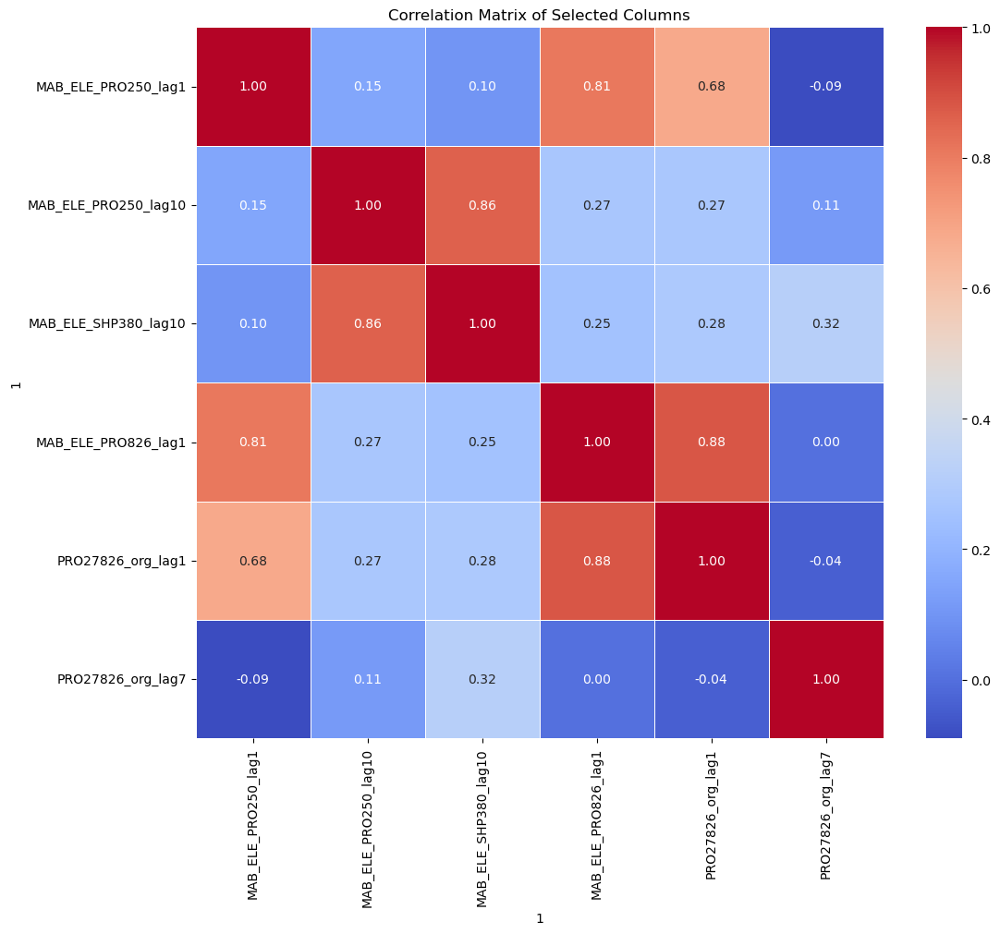

In [1018]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product1_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1019]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                     1                   
MAB_ELE_SHP380_lag10  MAB_ELE_PRO250_lag10    True
MAB_ELE_PRO826_lag1   MAB_ELE_PRO250_lag1     True
PRO27826_org_lag1     MAB_ELE_PRO826_lag1     True
dtype: bool


In [1020]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product1_list and column2 in selected_features_product1_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product1_list
selected_features_product1_list = [feature for feature in selected_features_product1_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product1_list)


['MAB_ELE_SHP380_lag10', 'MAB_ELE_PRO826_lag1', 'PRO27826_org_lag7']


<h4> XGBoost </h4>
__________________________________________________________   

In [1021]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product1_list].dropna()

# Create the target variable
y = scaled_sales_index['#1_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-08':], y_train['2019-08':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_1_xgb = y_test.to_frame()
predictions_1_xgb['Prediction'] = y_pred_test
predictions_1_xgb['Residual'] = y_test - predictions_1_xgb['Prediction']
print(predictions_1_xgb.head())  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #1_Index  Prediction  Residual
date                                   
2021-07      0.81        0.86     -0.05
2021-08      0.79        0.85     -0.06
2021-09      0.79        0.77      0.02
2021-10      1.00        0.88      0.12
2021-11      0.74        0.72      0.02
Mean Absolute Error (MAE): 0.061984449539816654
Mean Squared Error (MSE): 0.005252481603937453
Root Mean Squared Error (RMSE): 0.0724740064018642


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1022]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product1_list].dropna()

# Create the target variable
y = scaled_sales_index['#1_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-08':], y_train['2019-08':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_1_svr = y_test.to_frame()
predictions_1_svr['Prediction'] = y_pred_test
predictions_1_svr['Residual'] = y_test - predictions_1_svr['Prediction']
print(predictions_1_svr)  # Display the first few rows of the DataFrame


# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #1_Index  Prediction  Residual
date                                   
2021-07      0.81        0.80      0.02
2021-08      0.79        0.79     -0.00
2021-09      0.79        0.81     -0.02
2021-10      1.00        0.81      0.19
2021-11      0.74        0.70      0.04
2021-12      0.73        0.78     -0.04
2022-01      0.83        0.82      0.01
2022-02      0.79        0.79     -0.00
2022-03      0.89        0.82      0.07
2022-04      0.91        0.81      0.10
Mean Absolute Error (MAE): 0.05055484506199245
Mean Squared Error (MSE): 0.00572142211661855
Root Mean Squared Error (RMSE): 0.0756400827380467


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1023]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product1_list].dropna()

# Create the target variable
y = scaled_sales_index['#1_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
rf_model.fit(X_train['2019-08':], y_train['2019-08':])

# Predict y for training and test sets using the SVR model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_1_rf = y_test.to_frame()
predictions_1_rf['Prediction'] = y_pred_test
predictions_1_rf['Residual'] = y_test - predictions_1_rf['Prediction']
print(predictions_1_rf)  # Display the first few rows of the DataFrame


# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #1_Index  Prediction  Residual
date                                   
2021-07      0.81        0.84     -0.02
2021-08      0.79        0.83     -0.04
2021-09      0.79        0.80     -0.00
2021-10      1.00        0.88      0.12
2021-11      0.74        0.75     -0.01
2021-12      0.73        0.82     -0.09
2022-01      0.83        0.86     -0.03
2022-02      0.79        0.77      0.02
2022-03      0.89        0.81      0.08
2022-04      0.91        0.90      0.02
Mean Absolute Error (MAE): 0.044048019017840744
Mean Squared Error (MSE): 0.0032992404414836076
Root Mean Squared Error (RMSE): 0.05743901497661331


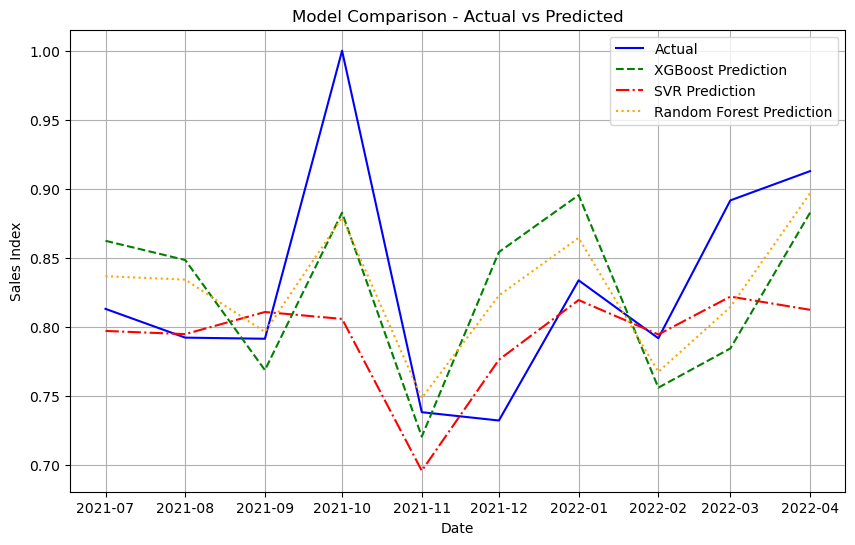

In [1024]:

# Convert index to timestamp
predictions_1_xgb.index = predictions_1_xgb.index.to_timestamp()
predictions_1_svr.index = predictions_1_svr.index.to_timestamp()
predictions_1_rf.index = predictions_1_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_1_svr.index, y_test, label='Actual', color='blue', linestyle='-')
plt.plot(predictions_1_xgb.index, predictions_1_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_1_svr.index, predictions_1_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_1_rf.index, predictions_1_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()


In [1025]:
pd.options.display.float_format = '{:.2f}'.format

# Select features for product 1 and add target variable
features = selected_features_product1_list
features.append('#1_Index')


# Drop rows with missing values
final_p1_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=rf_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p1_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 1
predictions_p1 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p1), freq='M').strftime('%Y-%m')
predictions_p1.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 1
p1_pred_df = pd.concat([final_p1_df, predictions_p1])

# Unscaled predictions_p1['#1_Index'] manually
unscaled_predictions_p1 = predictions_p1.copy()  # Make a copy of predictions_p1 DataFrame
unscaled_predictions_p1['#1_Index'] = predictions_p1['#1_Index'] * (X_max_1 - X_min_1) + X_min_1
unscaled_predictions_p1['#1'] = (unscaled_predictions_p1['#1_Index'] /100)*sales['#1'].iloc[0]

p1_pred_df['#1_Index'] = p1_pred_df['#1_Index'] * (X_max_1 - X_min_1) + X_min_1
p1_pred_df['#1'] = (p1_pred_df['#1_Index'] /100)*sales['#1'].iloc[0]
TotalForecast = pd.DataFrame(p1_pred_df['#1'], index=p1_pred_df.index)

# Create a DataFrame called forecast with the unscaled predictions
forecast = pd.DataFrame(unscaled_predictions_p1['#1'], index=predictions_p1.index)

# Display the forecast DataFrame
TotalForecast

,#1
2019-08,38042677.05
2019-09,40602780.64
2019-10,39012299.19
2019-11,37323903.07
2019-12,37701509.37
2020-01,34116651.47
2020-02,33505879.26
2020-03,39064430.88
2020-04,37981531.32
2020-05,31400212.54


<h2>4.2 Product #11 </h2>

In [1026]:

# Target column
target_column = '#11_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.3  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product11_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product11_list

['MAB_ELE_PRO392',
 'MAB_ELE_SHP840',
 'MAB_ELE_PRO156_lag9',
 'MAB_ELE_PRO392_lag5',
 'MAB_ELE_PRO392_lag6',
 'MAB_ELE_PRO392_lag9',
 'MAB_ELE_PRO756_lag7',
 'MAB_ELE_PRO756_lag8',
 'MAB_ELE_SHP840_lag9',
 'MAB_ELE_SHP840_lag12']

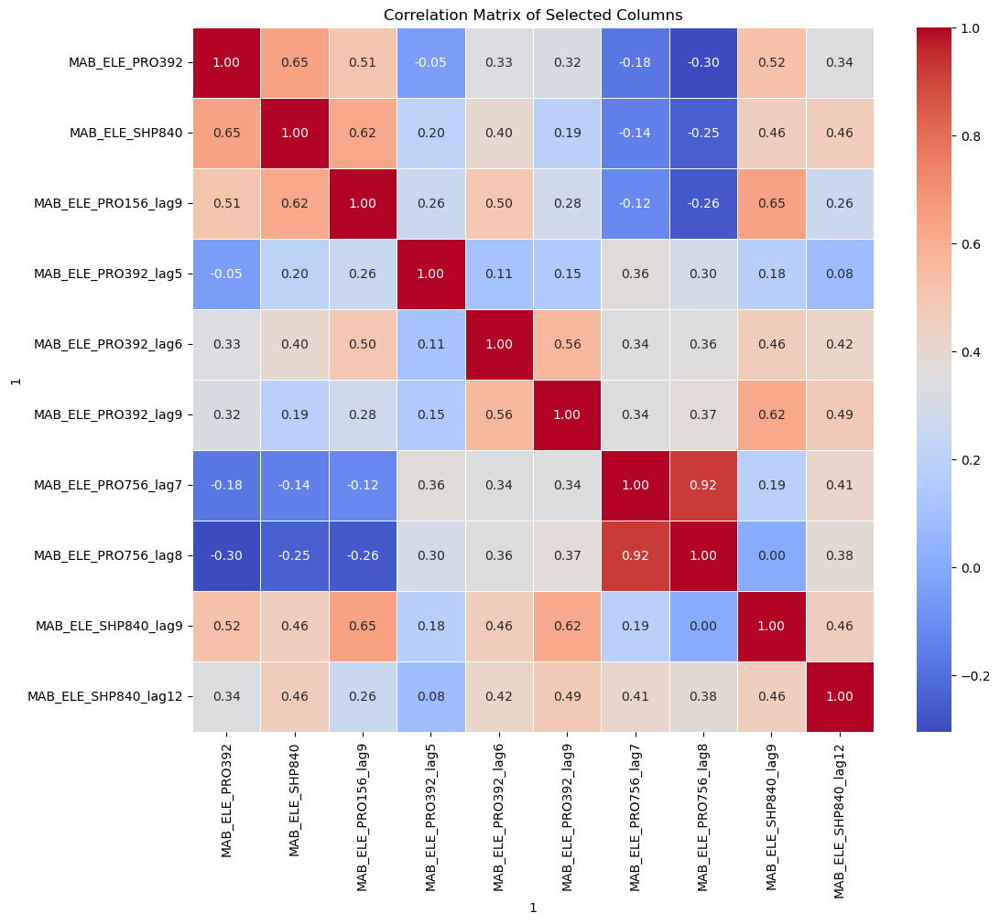

In [1027]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product11_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1028]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                    1                  
MAB_ELE_PRO756_lag8  MAB_ELE_PRO756_lag7    True
dtype: bool


In [1029]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product11_list and column2 in selected_features_product11_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product11_list
selected_features_product11_list = [feature for feature in selected_features_product11_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product11_list)


['MAB_ELE_PRO392', 'MAB_ELE_SHP840', 'MAB_ELE_PRO156_lag9', 'MAB_ELE_PRO392_lag5', 'MAB_ELE_PRO392_lag6', 'MAB_ELE_PRO392_lag9', 'MAB_ELE_PRO756_lag7', 'MAB_ELE_SHP840_lag9', 'MAB_ELE_SHP840_lag12']


<h4> XGBoost </h4>
__________________________________________________________   

In [1030]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product11_list].dropna()

# Create the target variable
y = scaled_sales_index['#11_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_11_xgb = y_test.to_frame()
predictions_11_xgb['Prediction'] = y_pred_test
predictions_11_xgb['Residual'] = y_test - predictions_11_xgb['Prediction']
print(predictions_11_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #11_Index  Prediction  Residual
date                                    
2021-07       0.58        0.40      0.17
2021-08       0.70        0.40      0.30
2021-09       0.98        0.91      0.06
2021-10       0.04        0.31     -0.27
2021-11       0.47        0.27      0.20
2021-12       0.68        0.74     -0.06
2022-01       0.27        0.28     -0.02
2022-02       0.24        0.36     -0.12
2022-03       0.59        0.71     -0.13
2022-04       0.29        0.33     -0.04
Mean Absolute Error (MAE): 0.13676245686827823
Mean Squared Error (MSE): 0.02741006096554916
Root Mean Squared Error (RMSE): 0.16555984104108448


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1031]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product11_list].dropna()

# Create the target variable
y = scaled_sales_index['#11_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_11_svr = y_test.to_frame()
predictions_11_svr['Prediction'] = y_pred_test
predictions_11_svr['Residual'] = y_test - predictions_11_svr['Prediction']
print(predictions_11_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #11_Index  Prediction  Residual
date                                    
2021-07       0.58        0.41      0.17
2021-08       0.70        0.36      0.33
2021-09       0.98        0.53      0.45
2021-10       0.04        0.30     -0.26
2021-11       0.47        0.30      0.17
2021-12       0.68        0.37      0.30
2022-01       0.27        0.51     -0.24
2022-02       0.24        0.41     -0.17
2022-03       0.59        0.35      0.24
2022-04       0.29        0.45     -0.17
Mean Absolute Error (MAE): 0.24940437222916872
Mean Squared Error (MSE): 0.06989687581988176
Root Mean Squared Error (RMSE): 0.2643801728947951


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1032]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product11_list].dropna()

# Create the target variable
y = scaled_sales_index['#11_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_11_rf = y_test.to_frame()
predictions_11_rf['Prediction'] = y_pred_test
predictions_11_rf['Residual'] = y_test - predictions_11_rf['Prediction']
print(predictions_11_rf)  # Display the first few rows of the DataFrame


# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #11_Index  Prediction  Residual
date                                    
2021-07       0.58        0.35      0.22
2021-08       0.70        0.40      0.29
2021-09       0.98        0.71      0.26
2021-10       0.04        0.27     -0.23
2021-11       0.47        0.28      0.19
2021-12       0.68        0.72     -0.04
2022-01       0.27        0.54     -0.27
2022-02       0.24        0.40     -0.15
2022-03       0.59        0.61     -0.02
2022-04       0.29        0.44     -0.15
Mean Absolute Error (MAE): 0.18360646707506253
Mean Squared Error (MSE): 0.04150251688123688
Root Mean Squared Error (RMSE): 0.20372166522301174


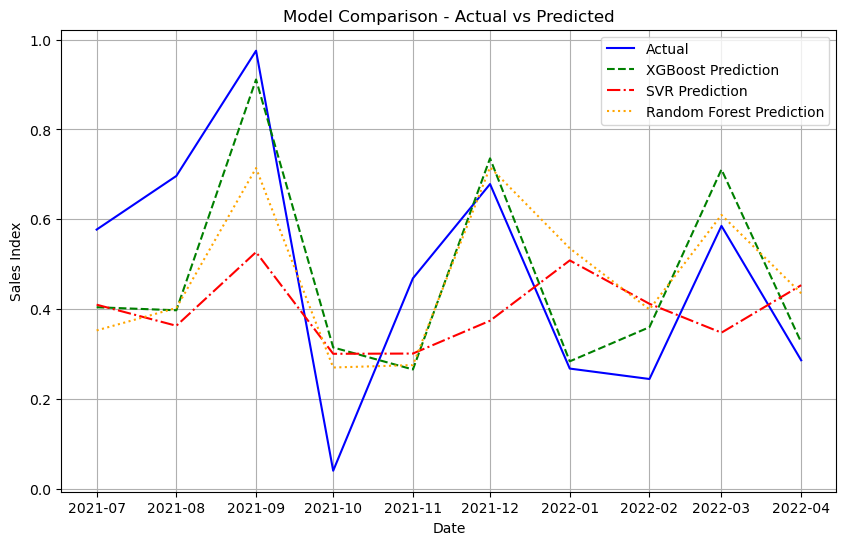

In [1033]:

# Convert index to timestamp
predictions_11_xgb.index = predictions_11_xgb.index.to_timestamp()
predictions_11_svr.index = predictions_11_svr.index.to_timestamp()
predictions_11_rf.index = predictions_11_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_11_svr.index, y_test, label='Actual', color='blue', linestyle='-')
plt.plot(predictions_11_xgb.index, predictions_11_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_11_svr.index, predictions_11_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_11_rf.index, predictions_11_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()


In [1034]:
features = selected_features_product11_list
features.append('#11_Index')
final_p11_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = xgb_model,
                 lags               = 10
             )

forecaster.fit(series=final_p11_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions_p11 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p11), freq='M').strftime('%Y-%m')
predictions_p11.index = new_index

p11_pred_df = pd.concat([final_p11_df, predictions_p11])
# Unscaled predictions_p11['#11_Index'] manually using X_min_11 and X_max_11
unscaled_predictions_p11 = predictions_p11.copy()  # Make a copy of predictions_p11 DataFrame
unscaled_predictions_p11['#11_Index'] = predictions_p11['#11_Index'] * (X_max_11 - X_min_11) + X_min_11

unscaled_predictions_p11['#11'] = (unscaled_predictions_p11['#11_Index'] /100)*sales['#11'].iloc[0]

p11_pred_df['#11_Index'] = p11_pred_df['#11_Index'] * (X_max_11 - X_min_11) + X_min_11
p11_pred_df['#11'] = (p11_pred_df['#11_Index'] /100)*sales['#11'].iloc[0]
TotalForecast['#11']=p11_pred_df['#11']
# Add the unscaled predictions for #11_Index to the existing forecast DataFrame
forecast['#11'] = unscaled_predictions_p11['#11']

# Display the updated forecast DataFrame
TotalForecast

,#1,#11
2019-08,38042677.05,NaN
2019-09,40602780.64,NaN
2019-10,39012299.19,218976.78
2019-11,37323903.07,1194770.75
2019-12,37701509.37,1278545.62
2020-01,34116651.47,584370.00
2020-02,33505879.26,1233609.73
2020-03,39064430.88,2969948.65
2020-04,37981531.32,813303.01
2020-05,31400212.54,842526.10


<h2>4.3 Product #12 </h2>

In [1035]:

# Target column
target_column = '#12_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.27  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product12_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product12_list


['MAB_ELE_SHP250',
 'MAB_ELE_PRO276',
 'MAB_ELE_PRO380',
 'MAB_ELE_SHP380',
 'MAB_ELE_PRO826',
 'MAB_ELE_PRO840',
 'MAB_ELE_PRO1100',
 'PRO27840_org',
 'PRO27826_org',
 'MAB_ELE_PRO156_lag6',
 'MAB_ELE_PRO156_lag8',
 'MAB_ELE_PRO250_lag2',
 'MAB_ELE_SHP250_lag5',
 'MAB_ELE_PRO276_lag2',
 'MAB_ELE_SHP380_lag2',
 'MAB_ELE_PRO392_lag2',
 'MAB_ELE_PRO826_lag2',
 'MAB_ELE_PRO840_lag1',
 'MAB_ELE_PRO1100_lag2',
 'PRO27840_org_lag1']

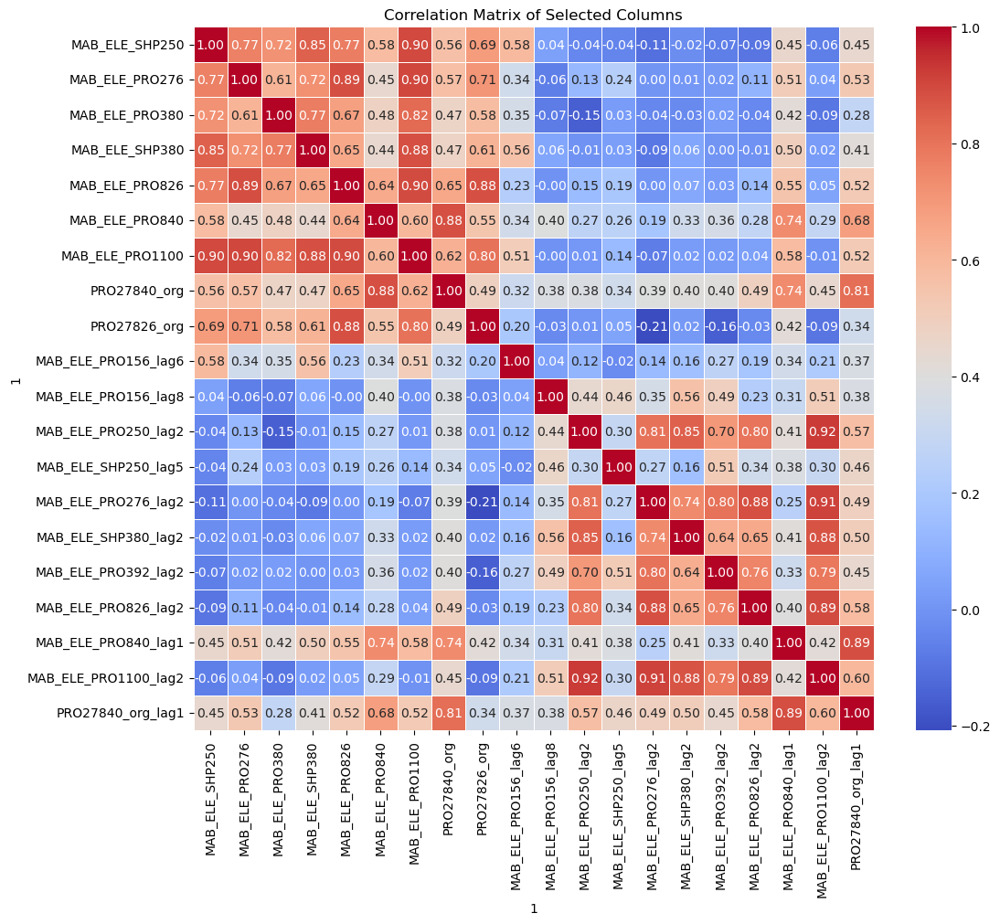

In [1036]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product12_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1037]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                     1                  
MAB_ELE_SHP380        MAB_ELE_SHP250         True
MAB_ELE_PRO826        MAB_ELE_PRO276         True
MAB_ELE_PRO1100       MAB_ELE_SHP250         True
                      MAB_ELE_PRO276         True
                      MAB_ELE_PRO380         True
                      MAB_ELE_SHP380         True
                      MAB_ELE_PRO826         True
PRO27840_org          MAB_ELE_PRO840         True
PRO27826_org          MAB_ELE_PRO826         True
                      MAB_ELE_PRO1100        True
MAB_ELE_PRO276_lag2   MAB_ELE_PRO250_lag2    True
MAB_ELE_SHP380_lag2   MAB_ELE_PRO250_lag2    True
MAB_ELE_PRO392_lag2   MAB_ELE_PRO276_lag2    True
MAB_ELE_PRO826_lag2   MAB_ELE_PRO250_lag2    True
                      MAB_ELE_PRO276_lag2    True
MAB_ELE_PRO1100_lag2  MAB_ELE_PRO250_lag2    True
                      MAB_ELE_PRO276_lag2    True
                      MAB_ELE_SHP380_lag2    True
                      MAB_ELE_PRO826_lag2    True
PRO27840

In [1038]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product12_list and column2 in selected_features_product12_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product12_list
selected_features_product12_list = [feature for feature in selected_features_product12_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product12_list)


['MAB_ELE_PRO276', 'MAB_ELE_PRO156_lag6', 'MAB_ELE_PRO156_lag8', 'MAB_ELE_SHP250_lag5', 'MAB_ELE_SHP380_lag2', 'MAB_ELE_PRO392_lag2', 'MAB_ELE_PRO840_lag1']


<h4> XGBoost </h4>
__________________________________________________________   

In [1039]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product12_list].dropna()

# Create the target variable
y = scaled_sales_index['#12_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-06':], y_train['2019-06':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_12_xgb = y_test.to_frame()
predictions_12_xgb['Prediction'] = y_pred_test
predictions_12_xgb['Residual'] = y_test - predictions_12_xgb['Prediction']
print(predictions_12_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #12_Index  Prediction  Residual
date                                    
2021-07       0.82        0.68      0.14
2021-08       0.32        0.66     -0.34
2021-09       0.95        0.73      0.22
2021-10       0.49        0.71     -0.23
2021-11       0.96        0.76      0.20
2021-12       0.72        0.64      0.08
2022-01       0.33        0.81     -0.48
2022-02       0.70        0.73     -0.03
2022-03       0.77        0.74      0.03
2022-04       0.40        0.85     -0.45
Mean Absolute Error (MAE): 0.2199199665135058
Mean Squared Error (MSE): 0.07223044726749103
Root Mean Squared Error (RMSE): 0.2687572273772206


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1040]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product12_list].dropna()

# Create the target variable
y = scaled_sales_index['#12_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-06':], y_train['2019-06':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_12_svr = y_test.to_frame()
predictions_12_svr['Prediction'] = y_pred_test
predictions_12_svr['Residual'] = y_test - predictions_12_svr['Prediction']
print(predictions_12_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #12_Index  Prediction  Residual
date                                    
2021-07       0.82        0.53      0.28
2021-08       0.32        0.57     -0.25
2021-09       0.95        0.82      0.13
2021-10       0.49        0.45      0.04
2021-11       0.96        0.73      0.23
2021-12       0.72        0.71      0.01
2022-01       0.33        0.49     -0.16
2022-02       0.70        0.64      0.06
2022-03       0.77        0.68      0.09
2022-04       0.40        0.73     -0.33
Mean Absolute Error (MAE): 0.15923245787269197
Mean Squared Error (MSE): 0.03644559625453582
Root Mean Squared Error (RMSE): 0.190907297541335


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1041]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product12_list].dropna()

# Create the target variable
y = scaled_sales_index['#12_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
rf_model.fit(X_train['2019-06':], y_train['2019-06':])

# Predict y for training and test sets using the SVR model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_12_rf = y_test.to_frame()
predictions_12_rf['Prediction'] = y_pred_test
predictions_12_rf['Residual'] = y_test - predictions_12_rf['Prediction']
print(predictions_12_rf)  # Display the first few rows of the DataFrame


# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #12_Index  Prediction  Residual
date                                    
2021-07       0.82        0.52      0.30
2021-08       0.32        0.60     -0.28
2021-09       0.95        0.71      0.24
2021-10       0.49        0.47      0.01
2021-11       0.96        0.78      0.18
2021-12       0.72        0.66      0.06
2022-01       0.33        0.64     -0.31
2022-02       0.70        0.73     -0.03
2022-03       0.77        0.74      0.03
2022-04       0.40        0.75     -0.35
Mean Absolute Error (MAE): 0.17879731239998664
Mean Squared Error (MSE): 0.047900553372576114
Root Mean Squared Error (RMSE): 0.21886195049066


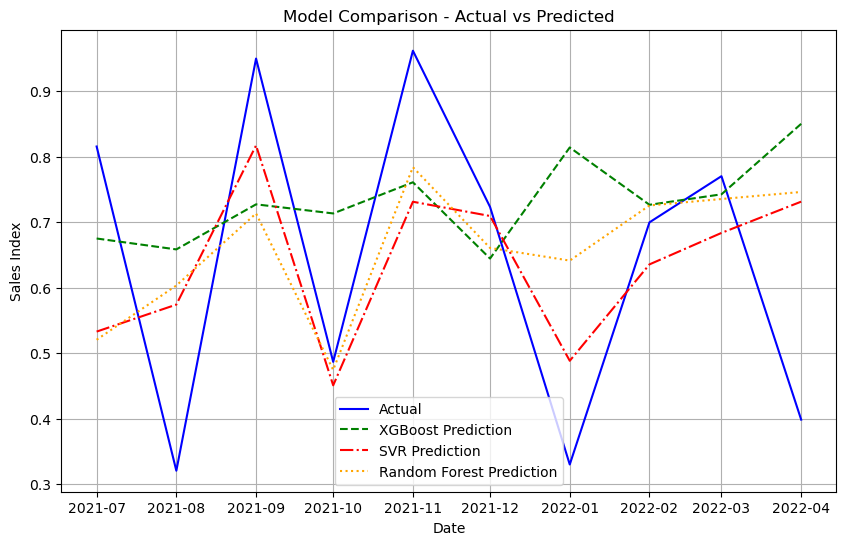

In [1042]:

# Convert index to timestamp
predictions_12_xgb.index = predictions_12_xgb.index.to_timestamp()
predictions_12_svr.index = predictions_12_svr.index.to_timestamp()
predictions_12_rf.index = predictions_12_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_12_xgb.index, predictions_12_xgb['#12_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_12_xgb.index, predictions_12_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_12_svr.index, predictions_12_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_12_rf.index, predictions_12_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1043]:
# Select features for product 12 and add target variable
features = selected_features_product12_list
features.append('#12_Index')

# Drop rows with missing values
final_p12_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=svr_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p12_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 12
predictions_p12 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p12), freq='M').strftime('%Y-%m')
predictions_p12.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 12
p12_pred_df = pd.concat([final_p12_df, predictions_p12])

# Unscaled predictions_p12['#12_Index'] manually using X_min_12 and X_max_12
unscaled_predictions_p12 = predictions_p12.copy()  # Make a copy of predictions_p12 DataFrame
unscaled_predictions_p12['#12_Index'] = predictions_p12['#12_Index'] * (X_max_12 - X_min_12) + X_min_12
unscaled_predictions_p12['#12'] = (unscaled_predictions_p12['#12_Index'] /100)*sales['#12'].iloc[0]
p12_pred_df['#12_Index'] = p12_pred_df['#12_Index'] * (X_max_12 - X_min_12) + X_min_12
p12_pred_df['#12'] = (p12_pred_df['#12_Index'] /100)*sales['#12'].iloc[0]
TotalForecast['#12']=p12_pred_df['#12']

# Add the unscaled predictions for #12_Index to the existing forecast DataFrame
forecast['#12'] = unscaled_predictions_p12['#12']


<h2>4.4 Product #13 </h2>

In [1044]:

# Target column
target_column = '#13_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.33  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product13_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product13_list

['MAB_ELE_PRO392',
 'MAB_ELE_PRO756',
 'PRO28756_org',
 'MAB_ELE_PRO392_lag1',
 'MAB_ELE_PRO392_lag12',
 'MAB_ELE_PRO756_lag1',
 'MAB_ELE_PRO756_lag2',
 'MAB_ELE_PRO756_lag3',
 'MAB_ELE_PRO756_lag4',
 'RohiENERGY1000_org_lag1',
 'RohiNATGAS1000_org_lag7',
 'RohiNATGAS1000_org_lag8',
 'RohiNATGAS1000_org_lag11',
 'RohiNATGAS1000_org_lag12',
 'PRO28756_org_lag1',
 'PRO28756_org_lag2',
 'PRO28756_org_lag3',
 'PRO28756_org_lag4',
 'PRO28756_org_lag5',
 'PRO28756_org_lag6',
 'PRO28756_org_lag7',
 'PRO28756_org_lag8',
 'PRO28756_org_lag9',
 'PRO28756_org_lag10',
 'PRO28756_org_lag11']

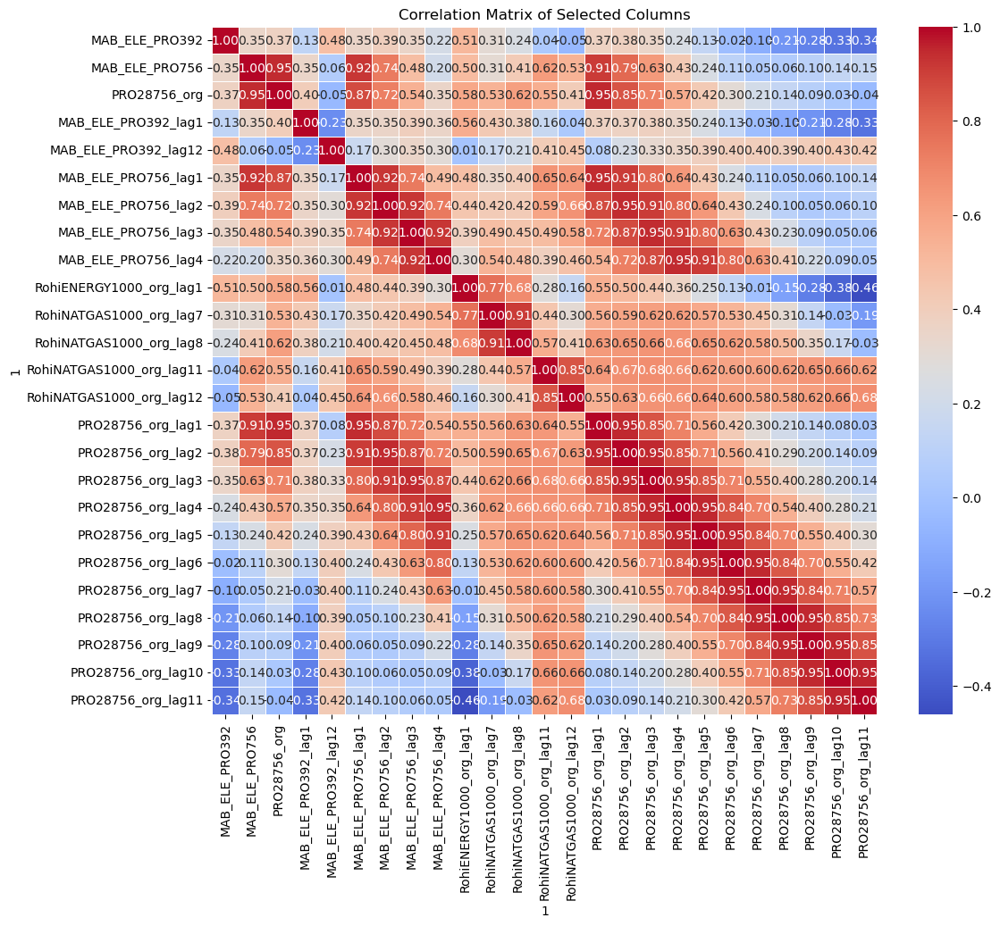

In [1045]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product13_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1046]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                         1                       
PRO28756_org              MAB_ELE_PRO756              True
MAB_ELE_PRO756_lag1       MAB_ELE_PRO756              True
                          PRO28756_org                True
MAB_ELE_PRO756_lag2       MAB_ELE_PRO756_lag1         True
MAB_ELE_PRO756_lag3       MAB_ELE_PRO756_lag2         True
MAB_ELE_PRO756_lag4       MAB_ELE_PRO756_lag3         True
RohiNATGAS1000_org_lag8   RohiNATGAS1000_org_lag7     True
RohiNATGAS1000_org_lag12  RohiNATGAS1000_org_lag11    True
PRO28756_org_lag1         MAB_ELE_PRO756              True
                          PRO28756_org                True
                          MAB_ELE_PRO756_lag1         True
                          MAB_ELE_PRO756_lag2         True
PRO28756_org_lag2         PRO28756_org                True
                          MAB_ELE_PRO756_lag1         True
                          MAB_ELE_PRO756_lag2         True
                          MAB_ELE_PRO756_lag3         True
     

In [1047]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product13_list and column2 in selected_features_product13_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product13_list
selected_features_product13_list = [feature for feature in selected_features_product13_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product13_list)


['MAB_ELE_PRO392', 'MAB_ELE_PRO392_lag1', 'MAB_ELE_PRO392_lag12', 'RohiENERGY1000_org_lag1', 'RohiNATGAS1000_org_lag8', 'RohiNATGAS1000_org_lag11', 'PRO28756_org_lag3']


<h4> XGBoost </h4>
__________________________________________________________   

In [1048]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product13_list].dropna()

# Create the target variable
y = scaled_sales_index['#13_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_13_xgb = y_test.to_frame()
predictions_13_xgb['Prediction'] = y_pred_test
predictions_13_xgb['Residual'] = y_test - predictions_13_xgb['Prediction']
print(predictions_13_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #13_Index  Prediction  Residual
date                                    
2021-07       0.09        0.52     -0.43
2021-08       0.13        0.05      0.08
2021-09       0.40        0.17      0.23
2021-10       0.43        0.33      0.10
2021-11       0.09        0.16     -0.07
2021-12       0.34        0.35     -0.01
2022-01       0.54        0.37      0.17
2022-02       0.47        0.25      0.22
2022-03       0.15        0.95     -0.81
2022-04       0.22        0.61     -0.38
Mean Absolute Error (MAE): 0.2500446319632997
Mean Squared Error (MSE): 0.11349230793487033
Root Mean Squared Error (RMSE): 0.33688619433700506


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1049]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product13_list].dropna()

# Create the target variable
y = scaled_sales_index['#13_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_13_svr = y_test.to_frame()
predictions_13_svr['Prediction'] = y_pred_test
predictions_13_svr['Residual'] = y_test - predictions_13_svr['Prediction']
print(predictions_13_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #13_Index  Prediction  Residual
date                                    
2021-07       0.09        0.30     -0.21
2021-08       0.13        0.18     -0.05
2021-09       0.40        0.20      0.20
2021-10       0.43        0.38      0.05
2021-11       0.09        0.36     -0.28
2021-12       0.34        0.51     -0.17
2022-01       0.54        0.64     -0.10
2022-02       0.47        0.41      0.06
2022-03       0.15        0.46     -0.31
2022-04       0.22        0.47     -0.25
Mean Absolute Error (MAE): 0.16637248118128314
Mean Squared Error (MSE): 0.03645018248269498
Root Mean Squared Error (RMSE): 0.19091930882625513


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1050]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product13_list].dropna()

# Create the target variable
y = scaled_sales_index['#13_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_13_rf = y_test.to_frame()
predictions_13_rf['Prediction'] = y_pred_test
predictions_13_rf['Residual'] = y_test - predictions_13_rf['Prediction']
print(predictions_13_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #13_Index  Prediction  Residual
date                                    
2021-07       0.09        0.36     -0.27
2021-08       0.13        0.25     -0.13
2021-09       0.40        0.35      0.05
2021-10       0.43        0.47     -0.05
2021-11       0.09        0.39     -0.30
2021-12       0.34        0.44     -0.10
2022-01       0.54        0.52      0.02
2022-02       0.47        0.41      0.07
2022-03       0.15        0.72     -0.58
2022-04       0.22        0.50     -0.28
Mean Absolute Error (MAE): 0.18365702672068093
Mean Squared Error (MSE): 0.06128547793881249
Root Mean Squared Error (RMSE): 0.24755903929934064


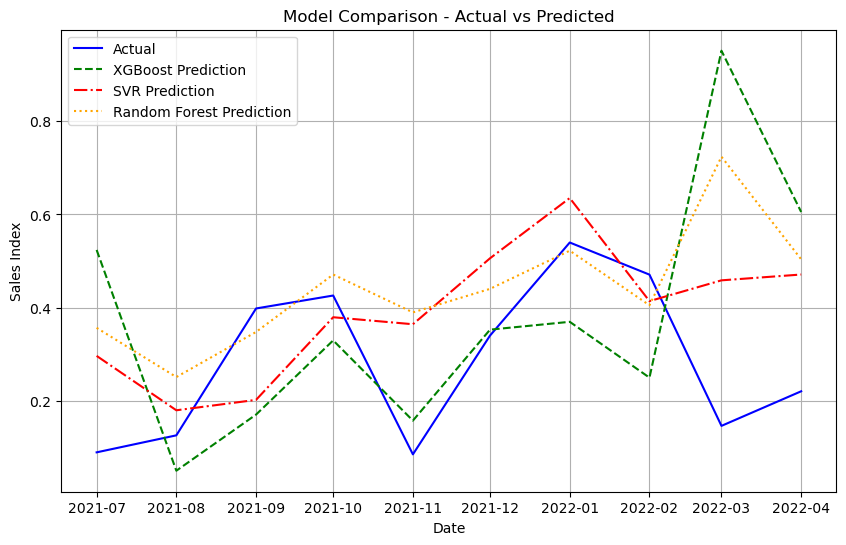

In [1051]:

# Convert index to timestamp
predictions_13_xgb.index = predictions_13_xgb.index.to_timestamp()
predictions_13_svr.index = predictions_13_svr.index.to_timestamp()
predictions_13_rf.index = predictions_13_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_13_xgb.index, predictions_13_xgb['#13_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_13_xgb.index, predictions_13_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_13_svr.index, predictions_13_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_13_rf.index, predictions_13_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1052]:
# Select features for product 13 and add target variable
features = selected_features_product13_list
features.append('#13_Index')

# Drop rows with missing values
final_p13_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=svr_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p13_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 13
predictions_p13 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p13), freq='M').strftime('%Y-%m')
predictions_p13.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 13
p13_pred_df = pd.concat([final_p13_df, predictions_p13])

# Unscaled predictions_p13['#13_Index'] manually using X_min_13 and X_max_13
unscaled_predictions_p13 = predictions_p13.copy()  # Make a copy of predictions_p13 DataFrame
unscaled_predictions_p13['#13_Index'] = predictions_p13['#13_Index'] * (X_max_13 - X_min_13) + X_min_13
unscaled_predictions_p13['#13'] = (unscaled_predictions_p13['#13_Index'] /100)*sales['#13'].iloc[0]
p13_pred_df['#13_Index'] = p13_pred_df['#13_Index'] * (X_max_13 - X_min_13) + X_min_13
p13_pred_df['#13'] = (p13_pred_df['#13_Index'] /100)*sales['#13'].iloc[0]
TotalForecast['#13']=p13_pred_df['#13']
# Add the unscaled predictions for #13_Index to the existing forecast DataFrame
forecast['#13'] = unscaled_predictions_p13['#13']


<h2>4.5 Product #14 </h2>

In [1053]:

# Target column
target_column = '#14_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.35  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product14_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product14_list

['MAB_ELE_SHP840',
 'PRI27840_org',
 'PRO28756_org',
 'MAB_ELE_SHP840_lag1',
 'MAB_ELE_SHP840_lag9',
 'RohiBASEMET1000_org_lag10',
 'RohiBASEMET1000_org_lag11',
 'RohiENERGY1000_org_lag1',
 'RohiNATGAS1000_org_lag3',
 'RohiNATGAS1000_org_lag4',
 'RohiNATGAS1000_org_lag5',
 'RohiNATGAS1000_org_lag6',
 'RohiNATGAS1000_org_lag7',
 'RohiNATGAS1000_org_lag8',
 'RohiNATGAS1000_org_lag9',
 'PRI27840_org_lag1',
 'PRI27840_org_lag2',
 'PRI27840_org_lag3',
 'PRI27840_org_lag4',
 'PRI27840_org_lag5',
 'PRI27840_org_lag6',
 'PRI27840_org_lag7',
 'PRI27840_org_lag8',
 'PRI27840_org_lag9',
 'PRI27840_org_lag10',
 'PRI27840_org_lag11',
 'PRI27840_org_lag12',
 'PRO28756_org_lag1',
 'PRO28756_org_lag2',
 'PRO28756_org_lag3',
 'PRO28756_org_lag4',
 'PRO28756_org_lag5',
 'PRO28756_org_lag6',
 'PRO28756_org_lag7',
 'PRO28756_org_lag8']

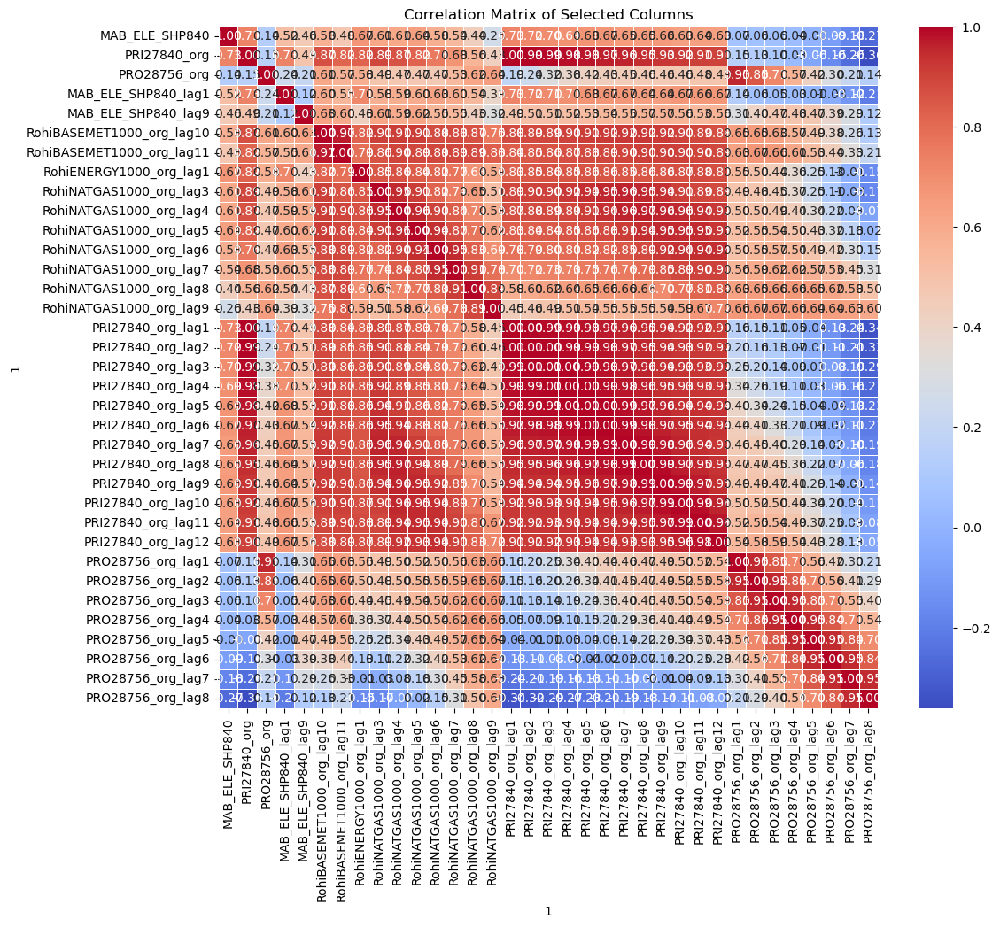

In [1054]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product14_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1055]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                          1                        
RohiBASEMET1000_org_lag10  PRI27840_org                 True
RohiBASEMET1000_org_lag11  PRI27840_org                 True
                           RohiBASEMET1000_org_lag10    True
RohiENERGY1000_org_lag1    PRI27840_org                 True
                           RohiBASEMET1000_org_lag10    True
                                                        ... 
PRO28756_org_lag6          PRO28756_org_lag5            True
PRO28756_org_lag7          PRO28756_org_lag5            True
                           PRO28756_org_lag6            True
PRO28756_org_lag8          PRO28756_org_lag6            True
                           PRO28756_org_lag7            True
Length: 216, dtype: bool


In [1056]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product14_list and column2 in selected_features_product14_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product14_list
selected_features_product14_list = [feature for feature in selected_features_product14_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product14_list)


['MAB_ELE_SHP840', 'PRO28756_org', 'MAB_ELE_SHP840_lag1', 'MAB_ELE_SHP840_lag9', 'RohiNATGAS1000_org_lag6', 'PRO28756_org_lag7']


<h4> XGBoost </h4>
__________________________________________________________   

In [1057]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product14_list].dropna()

# Create the target variable
y = scaled_sales_index['#14_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_14_xgb = y_test.to_frame()
predictions_14_xgb['Prediction'] = y_pred_test
predictions_14_xgb['Residual'] = y_test - predictions_14_xgb['Prediction']
print(predictions_14_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #14_Index  Prediction  Residual
date                                    
2021-07       1.00        0.16      0.84
2021-08       0.04        0.11     -0.07
2021-09       0.03        0.19     -0.17
2021-10       0.25        0.07      0.18
2021-11       0.11        0.04      0.07
2021-12       0.26        0.16      0.10
2022-01       0.07        0.16     -0.09
2022-02       0.09        0.29     -0.19
2022-03       0.62        0.28      0.34
2022-04       0.06        0.28     -0.22
Mean Absolute Error (MAE): 0.22659725482707507
Mean Squared Error (MSE): 0.09954465511373697
Root Mean Squared Error (RMSE): 0.3155069810855807


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1058]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product14_list].dropna()

# Create the target variable
y = scaled_sales_index['#14_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_14_svr = y_test.to_frame()
predictions_14_svr['Prediction'] = y_pred_test
predictions_14_svr['Residual'] = y_test - predictions_14_svr['Prediction']
print(predictions_14_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #14_Index  Prediction  Residual
date                                    
2021-07       1.00        0.16      0.84
2021-08       0.04        0.16     -0.13
2021-09       0.03        0.17     -0.14
2021-10       0.25        0.17      0.07
2021-11       0.11        0.16     -0.05
2021-12       0.26        0.17      0.09
2022-01       0.07        0.17     -0.10
2022-02       0.09        0.16     -0.07
2022-03       0.62        0.18      0.44
2022-04       0.06        0.18     -0.12
Mean Absolute Error (MAE): 0.20458681763139727
Mean Squared Error (MSE): 0.09852864572865318
Root Mean Squared Error (RMSE): 0.3138927296524295


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1059]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product14_list].dropna()

# Create the target variable
y = scaled_sales_index['#14_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_14_rf = y_test.to_frame()
predictions_14_rf['Prediction'] = y_pred_test
predictions_14_rf['Residual'] = y_test - predictions_14_rf['Prediction']
print(predictions_14_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #14_Index  Prediction  Residual
date                                    
2021-07       1.00        0.17      0.83
2021-08       0.04        0.13     -0.09
2021-09       0.03        0.17     -0.14
2021-10       0.25        0.11      0.13
2021-11       0.11        0.11     -0.00
2021-12       0.26        0.17      0.08
2022-01       0.07        0.16     -0.08
2022-02       0.09        0.19     -0.09
2022-03       0.62        0.19      0.43
2022-04       0.06        0.21     -0.15
Mean Absolute Error (MAE): 0.20435487348962936
Mean Squared Error (MSE): 0.09758046289725988
Root Mean Squared Error (RMSE): 0.31237871710034903


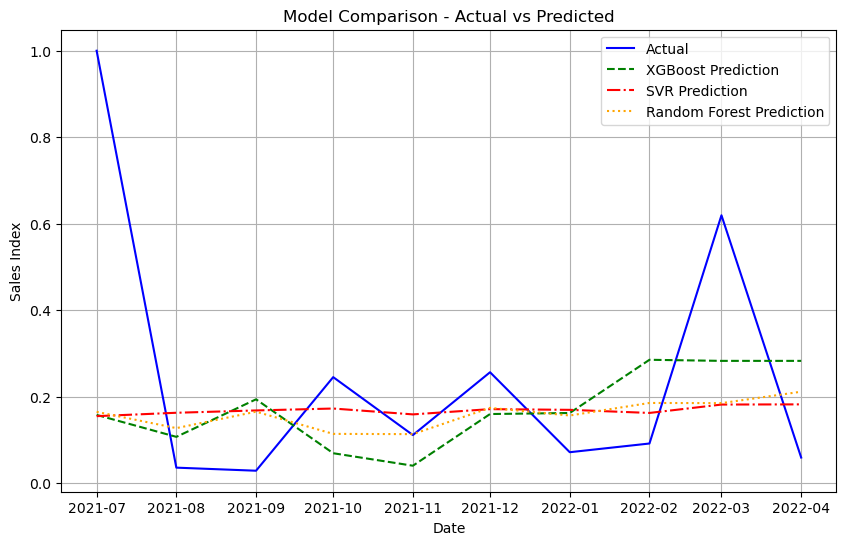

In [1060]:

# Convert index to timestamp
predictions_14_xgb.index = predictions_14_xgb.index.to_timestamp()
predictions_14_svr.index = predictions_14_svr.index.to_timestamp()
predictions_14_rf.index = predictions_14_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_14_xgb.index, predictions_14_xgb['#14_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_14_xgb.index, predictions_14_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_14_svr.index, predictions_14_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_14_rf.index, predictions_14_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1061]:
# Select features for product 14 and add target variable
features = selected_features_product14_list
features.append('#14_Index')

# Drop rows with missing values
final_p14_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p14_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 14
predictions_p14 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p14), freq='M').strftime('%Y-%m')
predictions_p14.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 14
p14_pred_df = pd.concat([final_p14_df, predictions_p14])


# Unscaled predictions_p14['#14_Index'] manually using X_min_14 and X_max_14
unscaled_predictions_p14 = predictions_p14.copy()  # Make a copy of predictions_p14 DataFrame
unscaled_predictions_p14['#14_Index'] = predictions_p14['#14_Index'] * (X_max_14 - X_min_14) + X_min_14
unscaled_predictions_p14['#14'] = (unscaled_predictions_p14['#14_Index'] /100)*sales['#14'].iloc[0]
p14_pred_df['#14_Index'] = p14_pred_df['#14_Index'] * (X_max_14 - X_min_14) + X_min_14
p14_pred_df['#14'] = (p14_pred_df['#14_Index'] /100)*sales['#14'].iloc[0]
TotalForecast['#14']=p14_pred_df['#14']
# Add the unscaled predictions for #14_Index to the existing forecast DataFrame
forecast['#14'] = unscaled_predictions_p14['#14']


<h2>4.6 Product #16 </h2>

In [1062]:

# Target column
target_column = '#16_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.4  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product16_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product16_list

['PRO28756_org',
 'RohiBASEMET1000_org_lag11',
 'RohiNATGAS1000_org_lag1',
 'RohiNATGAS1000_org_lag2',
 'RohiNATGAS1000_org_lag3',
 'RohiNATGAS1000_org_lag4',
 'RohiNATGAS1000_org_lag5',
 'RohiNATGAS1000_org_lag6',
 'RohiNATGAS1000_org_lag7',
 'RohiNATGAS1000_org_lag8',
 'RohiNATGAS1000_org_lag9',
 'PRI27840_org_lag1',
 'PRI27840_org_lag2',
 'PRI27840_org_lag3',
 'PRI27840_org_lag4',
 'PRI27840_org_lag5',
 'PRI27840_org_lag6',
 'PRI27840_org_lag7',
 'PRI27840_org_lag8',
 'PRI27840_org_lag9',
 'PRI27840_org_lag10',
 'PRI27840_org_lag11',
 'PRI27840_org_lag12',
 'PRO28756_org_lag1',
 'PRO28756_org_lag2',
 'PRO28756_org_lag3',
 'PRO28756_org_lag4',
 'PRO28756_org_lag5',
 'PRO28756_org_lag6',
 'PRO28756_org_lag7',
 'PRO28756_org_lag8',
 'PRO28756_org_lag9']

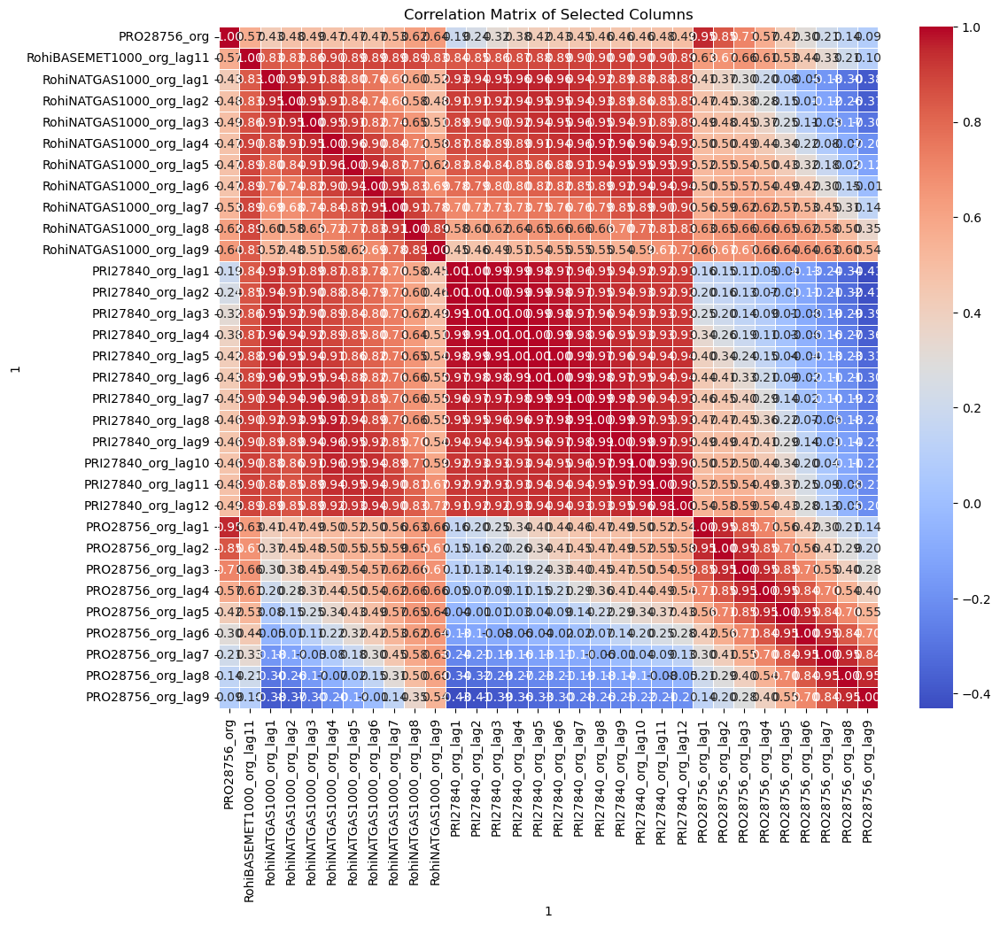

In [1063]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product16_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1064]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                        1                        
RohiNATGAS1000_org_lag1  RohiBASEMET1000_org_lag11    True
RohiNATGAS1000_org_lag2  RohiBASEMET1000_org_lag11    True
                         RohiNATGAS1000_org_lag1      True
RohiNATGAS1000_org_lag3  RohiBASEMET1000_org_lag11    True
                         RohiNATGAS1000_org_lag1      True
                                                      ... 
PRO28756_org_lag7        PRO28756_org_lag6            True
PRO28756_org_lag8        PRO28756_org_lag6            True
                         PRO28756_org_lag7            True
PRO28756_org_lag9        PRO28756_org_lag7            True
                         PRO28756_org_lag8            True
Length: 197, dtype: bool


In [1065]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product16_list and column2 in selected_features_product16_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product16_list
selected_features_product16_list = [feature for feature in selected_features_product16_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product16_list)


['PRO28756_org', 'RohiNATGAS1000_org_lag6', 'PRO28756_org_lag7']


<h4> XGBoost </h4>
__________________________________________________________   

In [1066]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product16_list].dropna()

# Create the target variable
y = scaled_sales_index['#16_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-05':], y_train['2019-05':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_16_xgb = y_test.to_frame()
predictions_16_xgb['Prediction'] = y_pred_test
predictions_16_xgb['Residual'] = y_test - predictions_16_xgb['Prediction']
print(predictions_16_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #16_Index  Prediction  Residual
date                                    
2021-07       0.01        0.03     -0.02
2021-08       0.06        0.07     -0.01
2021-09       0.03        0.06     -0.03
2021-10       0.02        0.03     -0.00
2021-11       0.04        0.03      0.01
2021-12       0.05        0.03      0.02
2022-01       0.01        0.03     -0.02
2022-02       0.00        0.06     -0.06
2022-03       0.01        0.07     -0.05
2022-04       0.02        0.06     -0.04
Mean Absolute Error (MAE): 0.026016649650283614
Mean Squared Error (MSE): 0.000985222737415345
Root Mean Squared Error (RMSE): 0.031388257954454005


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1067]:
# Create the target variable
y = scaled_sales_index['#16_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_16_svr = y_test.to_frame()
predictions_16_svr['Prediction'] = y_pred_test
predictions_16_svr['Residual'] = y_test - predictions_16_svr['Prediction']
print(predictions_16_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #16_Index  Prediction  Residual
date                                    
2021-07       0.01        0.08     -0.06
2021-08       0.06        0.08     -0.02
2021-09       0.03        0.08     -0.04
2021-10       0.02        0.08     -0.05
2021-11       0.04        0.08     -0.04
2021-12       0.05        0.08     -0.03
2022-01       0.01        0.08     -0.06
2022-02       0.00        0.08     -0.07
2022-03       0.01        0.08     -0.06
2022-04       0.02        0.08     -0.06
Mean Absolute Error (MAE): 0.04956103753588358
Mean Squared Error (MSE): 0.002772025986166015
Root Mean Squared Error (RMSE): 0.052650033106979285


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1068]:
# Create the target variable
y = scaled_sales_index['#16_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_16_rf = y_test.to_frame()
predictions_16_rf['Prediction'] = y_pred_test
predictions_16_rf['Residual'] = y_test - predictions_16_rf['Prediction']
print(predictions_16_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #16_Index  Prediction  Residual
date                                    
2021-07       0.01        0.07     -0.05
2021-08       0.06        0.06     -0.00
2021-09       0.03        0.05     -0.02
2021-10       0.02        0.07     -0.04
2021-11       0.04        0.06     -0.02
2021-12       0.05        0.06     -0.01
2022-01       0.01        0.06     -0.05
2022-02       0.00        0.07     -0.07
2022-03       0.01        0.07     -0.05
2022-04       0.02        0.06     -0.04
Mean Absolute Error (MAE): 0.03762288711462058
Mean Squared Error (MSE): 0.0018332316517811636
Root Mean Squared Error (RMSE): 0.04281625452770436


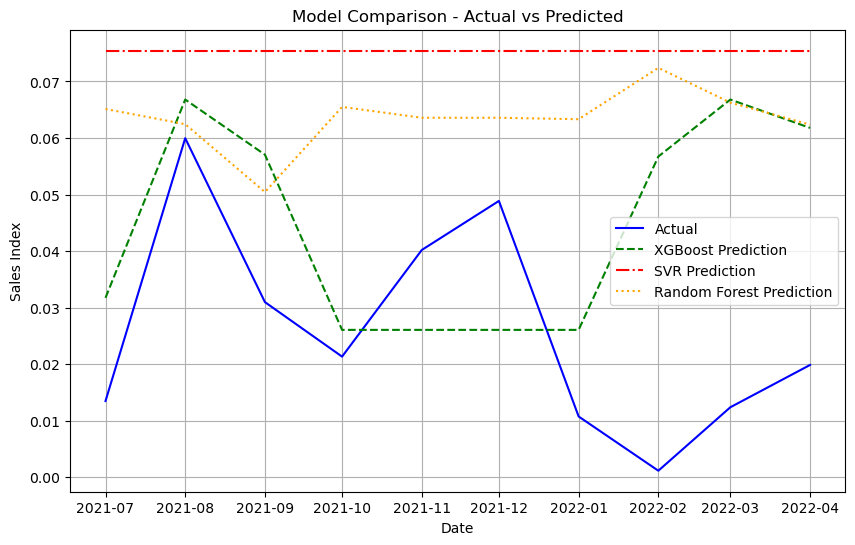

In [1069]:

# Convert index to timestamp
predictions_16_xgb.index = predictions_16_xgb.index.to_timestamp()
predictions_16_svr.index = predictions_16_svr.index.to_timestamp()
predictions_16_rf.index = predictions_16_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_16_xgb.index, predictions_16_xgb['#16_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_16_xgb.index, predictions_16_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_16_svr.index, predictions_16_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_16_rf.index, predictions_16_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1070]:
# Select features for product 16 and add target variable
features = selected_features_product16_list
features.append('#16_Index')

# Drop rows with missing values
final_p16_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p16_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 16
predictions_p16 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p16), freq='M').strftime('%Y-%m')
predictions_p16.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 16
p16_pred_df = pd.concat([final_p16_df, predictions_p16])


# Unscaled predictions_p16['#16_Index'] manually using X_min_16 and X_max_16
unscaled_predictions_p16 = predictions_p16.copy()  # Make a copy of predictions_p16 DataFrame
unscaled_predictions_p16['#16_Index'] = predictions_p16['#16_Index'] * (X_max_16 - X_min_16) + X_min_16
unscaled_predictions_p16['#16'] = (unscaled_predictions_p16['#16_Index'] /100)*sales['#16'].iloc[0]
p16_pred_df['#16_Index'] = p16_pred_df['#16_Index'] * (X_max_16 - X_min_16) + X_min_16
p16_pred_df['#16'] = (p16_pred_df['#16_Index'] /100)*sales['#16'].iloc[0]
TotalForecast['#16']=p16_pred_df['#16']

# Add the unscaled predictions for #16_Index to the existing forecast DataFrame
forecast['#16'] = unscaled_predictions_p16['#16']


<h2>4.7 Product #20 </h2>

In [1071]:

# Target column
target_column = '#20_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.4  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product20_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product20_list



['MAB_ELE_SHP840',
 'MAB_ELE_PRO392_lag1',
 'MAB_ELE_SHP840_lag1',
 'MAB_ELE_SHP840_lag12',
 'RohiBASEMET1000_org_lag11',
 'RohiNATGAS1000_org_lag4',
 'RohiNATGAS1000_org_lag5',
 'RohiNATGAS1000_org_lag6',
 'RohiNATGAS1000_org_lag7',
 'RohiNATGAS1000_org_lag8',
 'PRI27840_org_lag6',
 'PRI27840_org_lag7',
 'PRI27840_org_lag8',
 'PRI27840_org_lag9',
 'PRI27840_org_lag10',
 'PRI27840_org_lag11',
 'PRI27840_org_lag12']

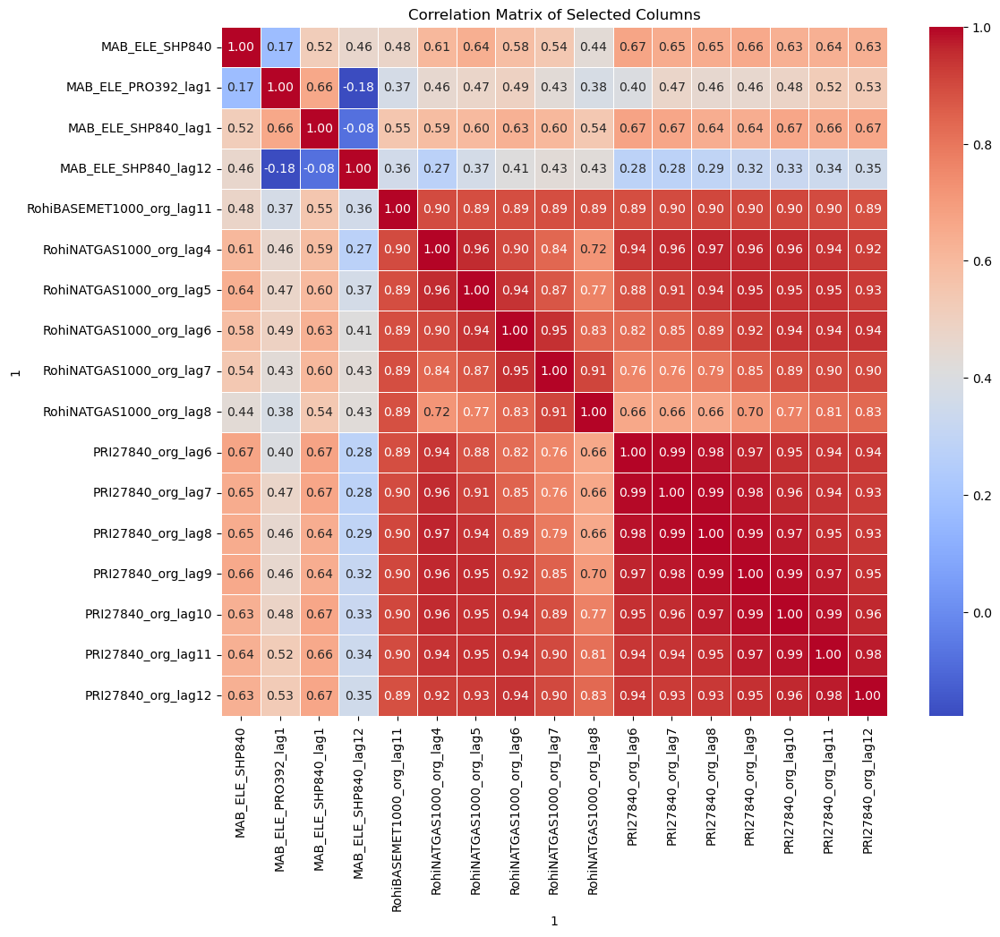

In [1072]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product20_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1073]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.9
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.9
print(high_correlation_pairs)


1                        1                        
RohiNATGAS1000_org_lag4  RohiBASEMET1000_org_lag11    True
RohiNATGAS1000_org_lag5  RohiBASEMET1000_org_lag11    True
                         RohiNATGAS1000_org_lag4      True
RohiNATGAS1000_org_lag6  RohiBASEMET1000_org_lag11    True
                         RohiNATGAS1000_org_lag4      True
                                                      ... 
PRI27840_org_lag12       PRI27840_org_lag7            True
                         PRI27840_org_lag8            True
                         PRI27840_org_lag9            True
                         PRI27840_org_lag10           True
                         PRI27840_org_lag11           True
Length: 68, dtype: bool


In [1074]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product20_list and column2 in selected_features_product20_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product20_list
selected_features_product20_list = [feature for feature in selected_features_product20_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product20_list)


['MAB_ELE_SHP840', 'MAB_ELE_PRO392_lag1', 'MAB_ELE_SHP840_lag1', 'MAB_ELE_SHP840_lag12', 'PRI27840_org_lag12']


<h4> XGBoost </h4>
__________________________________________________________   

In [1075]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product20_list].dropna()

# Create the target variable
y = scaled_sales_index['#20_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_20_xgb = y_test.to_frame()
predictions_20_xgb['Prediction'] = y_pred_test
predictions_20_xgb['Residual'] = y_test - predictions_20_xgb['Prediction']
print(predictions_20_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #20_Index  Prediction  Residual
date                                    
2021-07       0.10        0.05      0.05
2021-08       0.04        0.38     -0.33
2021-09       0.00        0.32     -0.32
2021-10       0.02        0.32     -0.30
2021-11       0.11        0.05      0.06
2021-12       0.02        0.16     -0.14
2022-01       0.00        0.21     -0.21
2022-02       0.07        0.38     -0.31
2022-03       0.34        0.07      0.27
2022-04       0.74        0.76     -0.02
Mean Absolute Error (MAE): 0.20161420883661596
Mean Squared Error (MSE): 0.054287571022356894
Root Mean Squared Error (RMSE): 0.23299693350419207


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1076]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product20_list].dropna()

# Create the target variable
y = scaled_sales_index['#20_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_20_svr = y_test.to_frame()
predictions_20_svr['Prediction'] = y_pred_test
predictions_20_svr['Residual'] = y_test - predictions_20_svr['Prediction']
print(predictions_20_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #20_Index  Prediction  Residual
date                                    
2021-07       0.10        0.50     -0.40
2021-08       0.04        0.25     -0.21
2021-09       0.00        0.24     -0.24
2021-10       0.02        0.30     -0.28
2021-11       0.11        0.20     -0.09
2021-12       0.02        0.24     -0.22
2022-01       0.00        0.42     -0.42
2022-02       0.07        0.21     -0.14
2022-03       0.34        0.28      0.06
2022-04       0.74        0.28      0.46
Mean Absolute Error (MAE): 0.2519934376083913
Mean Squared Error (MSE): 0.08061761648706094
Root Mean Squared Error (RMSE): 0.2839324153510144


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1077]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product20_list].dropna()

# Create the target variable
y = scaled_sales_index['#20_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_20_rf = y_test.to_frame()
predictions_20_rf['Prediction'] = y_pred_test
predictions_20_rf['Residual'] = y_test - predictions_20_rf['Prediction']
print(predictions_20_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #20_Index  Prediction  Residual
date                                    
2021-07       0.10        0.43     -0.33
2021-08       0.04        0.30     -0.26
2021-09       0.00        0.51     -0.51
2021-10       0.02        0.50     -0.48
2021-11       0.11        0.44     -0.33
2021-12       0.02        0.23     -0.21
2022-01       0.00        0.43     -0.43
2022-02       0.07        0.31     -0.24
2022-03       0.34        0.20      0.14
2022-04       0.74        0.38      0.36
Mean Absolute Error (MAE): 0.3297886195436975
Mean Squared Error (MSE): 0.12163973659384333
Root Mean Squared Error (RMSE): 0.34876888707831055


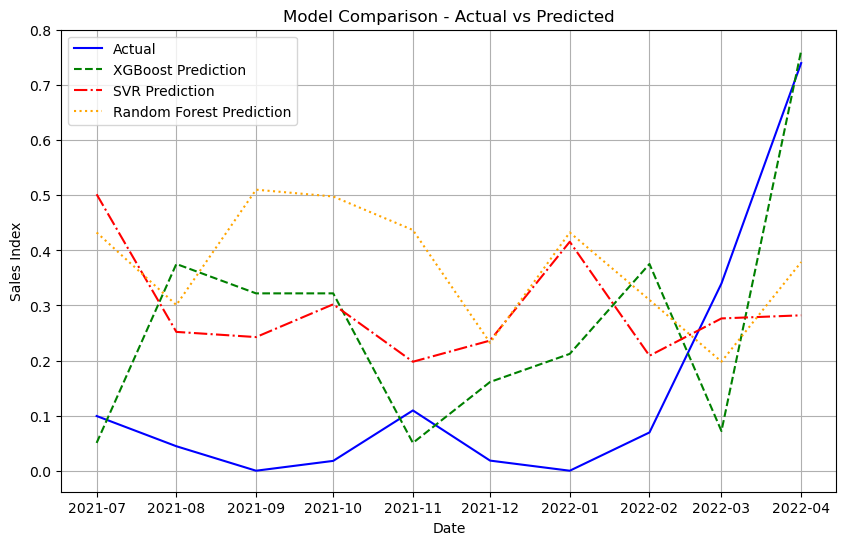

In [1078]:

# Convert index to timestamp
predictions_20_xgb.index = predictions_20_xgb.index.to_timestamp()
predictions_20_svr.index = predictions_20_svr.index.to_timestamp()
predictions_20_rf.index = predictions_20_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_20_xgb.index, predictions_20_xgb['#20_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_20_xgb.index, predictions_20_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_20_svr.index, predictions_20_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_20_rf.index, predictions_20_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1079]:
# Select features for product 20 and add target variable
features = selected_features_product20_list
features.append('#20_Index')

# Drop rows with missing values
final_p20_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p20_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 20
predictions_p20 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p20), freq='M').strftime('%Y-%m')
predictions_p20.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 20
p20_pred_df = pd.concat([final_p20_df, predictions_p20])


# Unscaled predictions_p20['#20_Index'] manually using X_min_20 and X_max_20
unscaled_predictions_p20 = predictions_p20.copy()  # Make a copy of predictions_p20 DataFrame
unscaled_predictions_p20['#20_Index'] = predictions_p20['#20_Index'] * (X_max_20 - X_min_20) + X_min_20
unscaled_predictions_p20['#20'] = (unscaled_predictions_p20['#20_Index'] /100)*sales['#20'].iloc[0]
p20_pred_df['#20_Index'] = p20_pred_df['#20_Index'] * (X_max_20 - X_min_20) + X_min_20
p20_pred_df['#20'] = (p20_pred_df['#20_Index'] /100)*sales['#20'].iloc[0]
TotalForecast['#20']=p20_pred_df['#20']

# Add the unscaled predictions for #20_Index to the existing forecast DataFrame
forecast['#20'] = unscaled_predictions_p20['#20']

<h2>4.8 Product #3 </h2>

In [1080]:

# Target column
target_column = '#3_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.23  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product3_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product3_list

['MAB_ELE_PRO276',
 'MAB_ELE_PRO826',
 'MAB_ELE_PRO1100',
 'PRO27826_org',
 'MAB_ELE_PRO156_lag11',
 'MAB_ELE_SHP250_lag5',
 'MAB_ELE_SHP250_lag8',
 'MAB_ELE_SHP250_lag9',
 'MAB_ELE_PRO826_lag8',
 'MAB_ELE_PRO1100_lag8',
 'PRO27826_org_lag8',
 'PRO27826_org_lag12']

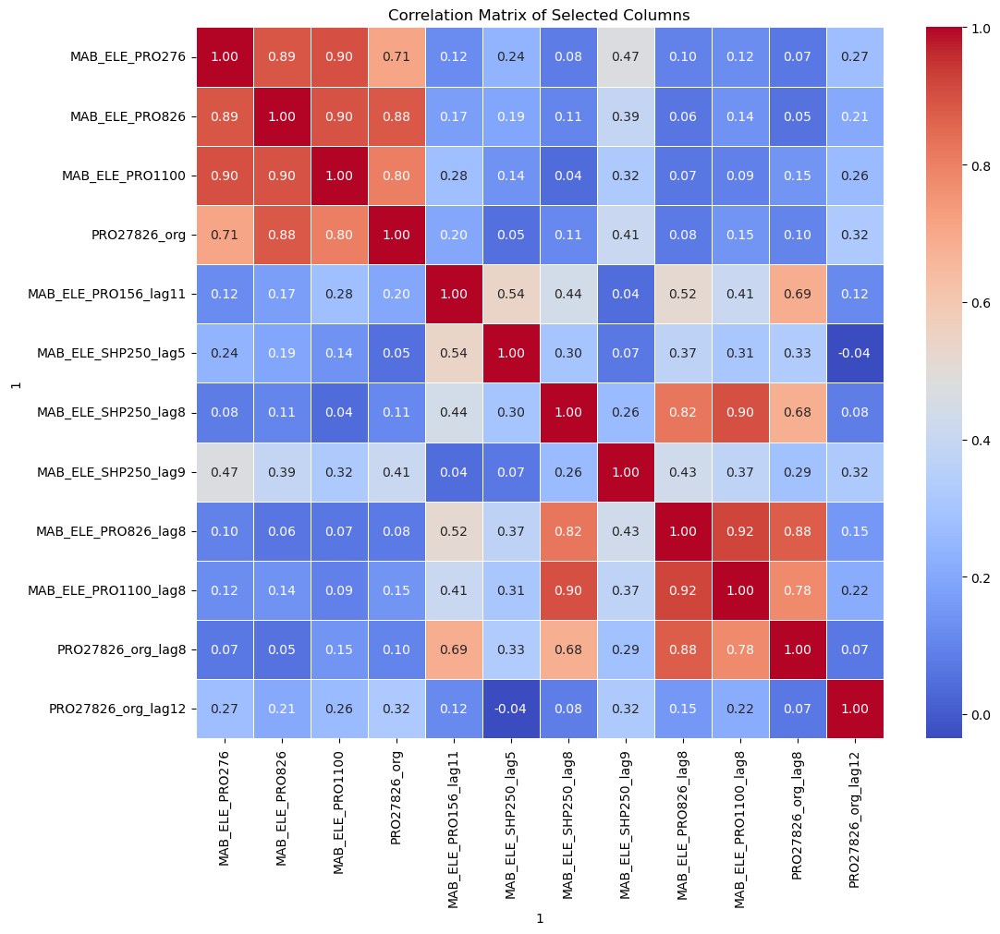

In [1081]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product3_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1082]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)


1                     1                  
MAB_ELE_PRO826        MAB_ELE_PRO276         True
MAB_ELE_PRO1100       MAB_ELE_PRO276         True
                      MAB_ELE_PRO826         True
PRO27826_org          MAB_ELE_PRO826         True
                      MAB_ELE_PRO1100        True
MAB_ELE_PRO826_lag8   MAB_ELE_SHP250_lag8    True
MAB_ELE_PRO1100_lag8  MAB_ELE_SHP250_lag8    True
                      MAB_ELE_PRO826_lag8    True
PRO27826_org_lag8     MAB_ELE_PRO826_lag8    True
dtype: bool


In [1083]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product3_list and column2 in selected_features_product3_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product3_list
selected_features_product3_list = [feature for feature in selected_features_product3_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product3_list)


['PRO27826_org', 'MAB_ELE_PRO156_lag11', 'MAB_ELE_SHP250_lag5', 'MAB_ELE_SHP250_lag9', 'PRO27826_org_lag8', 'PRO27826_org_lag12']


<h4> XGBoost </h4>
__________________________________________________________   

In [1084]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product3_list].dropna()

# Create the target variable
y = scaled_sales_index['#3_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_3_xgb = y_test.to_frame()
predictions_3_xgb['Prediction'] = y_pred_test
predictions_3_xgb['Residual'] = y_test - predictions_3_xgb['Prediction']
print(predictions_3_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #3_Index  Prediction  Residual
date                                   
2021-07      0.64        0.56      0.07
2021-08      0.58        0.48      0.10
2021-09      0.81        0.73      0.08
2021-10      0.67        0.58      0.09
2021-11      1.00        0.75      0.25
2021-12      0.58        0.56      0.02
2022-01      0.67        0.53      0.13
2022-02      0.80        0.61      0.19
2022-03      0.71        0.73     -0.03
2022-04      0.55        0.57     -0.02
Mean Absolute Error (MAE): 0.09744954694203656
Mean Squared Error (MSE): 0.014526355419485442
Root Mean Squared Error (RMSE): 0.12052533102831721


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1085]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product3_list].dropna()

# Create the target variable
y = scaled_sales_index['#3_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_3_svr = y_test.to_frame()
predictions_3_svr['Prediction'] = y_pred_test
predictions_3_svr['Residual'] = y_test - predictions_3_svr['Prediction']
print(predictions_3_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #3_Index  Prediction  Residual
date                                   
2021-07      0.64        0.56      0.08
2021-08      0.58        0.53      0.04
2021-09      0.81        0.57      0.24
2021-10      0.67        0.58      0.10
2021-11      1.00        0.60      0.40
2021-12      0.58        0.54      0.03
2022-01      0.67        0.51      0.15
2022-02      0.80        0.56      0.23
2022-03      0.71        0.57      0.14
2022-04      0.55        0.59     -0.03
Mean Absolute Error (MAE): 0.14559277993202055
Mean Squared Error (MSE): 0.03377334607539293
Root Mean Squared Error (RMSE): 0.1837752596934444


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1086]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product3_list].dropna()

# Create the target variable
y = scaled_sales_index['#3_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_3_rf = y_test.to_frame()
predictions_3_rf['Prediction'] = y_pred_test
predictions_3_rf['Residual'] = y_test - predictions_3_rf['Prediction']
print(predictions_3_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #3_Index  Prediction  Residual
date                                   
2021-07      0.64        0.59      0.04
2021-08      0.58        0.56      0.01
2021-09      0.81        0.72      0.09
2021-10      0.67        0.52      0.15
2021-11      1.00        0.64      0.36
2021-12      0.58        0.56      0.01
2022-01      0.67        0.54      0.13
2022-02      0.80        0.53      0.27
2022-03      0.71        0.70      0.00
2022-04      0.55        0.49      0.06
Mean Absolute Error (MAE): 0.11293420215536601
Mean Squared Error (MSE): 0.025503471655810583
Root Mean Squared Error (RMSE): 0.15969806403275708


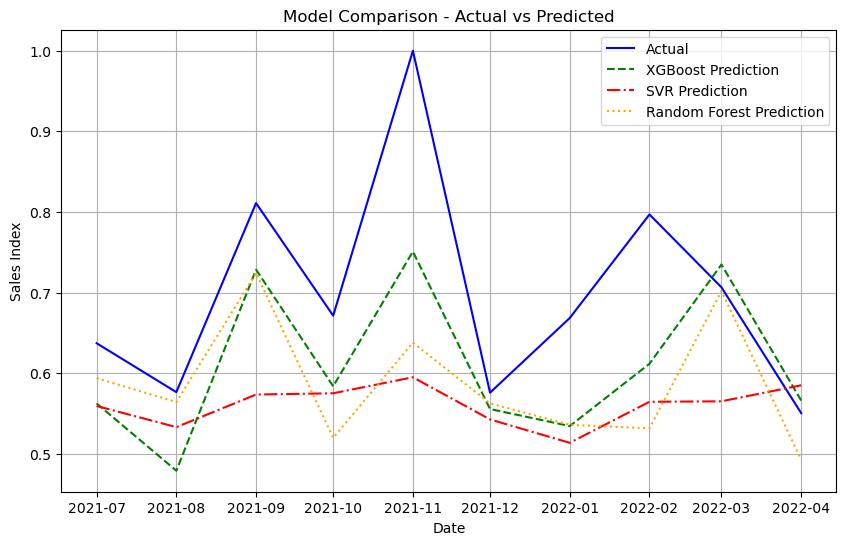

In [1087]:

# Convert index to timestamp
predictions_3_xgb.index = predictions_3_xgb.index.to_timestamp()
predictions_3_svr.index = predictions_3_svr.index.to_timestamp()
predictions_3_rf.index = predictions_3_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_3_xgb.index, predictions_3_xgb['#3_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_3_xgb.index, predictions_3_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_3_svr.index, predictions_3_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_3_rf.index, predictions_3_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1088]:
# Select features for product 3 and add target variable
features = selected_features_product3_list
features.append('#3_Index')

# Drop rows with missing values
final_p3_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p3_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 3
predictions_p3 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p3), freq='M').strftime('%Y-%m')
predictions_p3.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 3
p3_pred_df = pd.concat([final_p3_df, predictions_p3])

# Unscaled predictions_p3['#3_Index'] manually using X_min_3 and X_max_3
unscaled_predictions_p3 = predictions_p3.copy()  # Make a copy of predictions_p3 DataFrame
unscaled_predictions_p3['#3_Index'] = predictions_p3['#3_Index'] * (X_max_3 - X_min_3) + X_min_3
unscaled_predictions_p3['#3'] = (unscaled_predictions_p3['#3_Index'] /100)*sales['#3'].iloc[0]
p3_pred_df['#3_Index'] = p3_pred_df['#3_Index'] * (X_max_3 - X_min_3) + X_min_3
p3_pred_df['#3'] = (p3_pred_df['#3_Index'] /100)*sales['#3'].iloc[0]
TotalForecast['#3']=p3_pred_df['#3']

# Add the unscaled predictions for #3_Index to the existing forecast DataFrame
forecast['#3'] = unscaled_predictions_p3['#3']


<h2>4.9 Product #36 </h2>

In [1089]:

# Target column
target_column = '#36_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.4  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product36_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product36_list

['MAB_ELE_SHP840',
 'PRO28756_org',
 'MAB_ELE_SHP840_lag1',
 'RohiNATGAS1000_org_lag3',
 'RohiNATGAS1000_org_lag4',
 'RohiNATGAS1000_org_lag5',
 'RohiNATGAS1000_org_lag6',
 'RohiNATGAS1000_org_lag7',
 'RohiNATGAS1000_org_lag8',
 'PRI27840_org_lag3',
 'PRI27840_org_lag5',
 'PRI27840_org_lag6',
 'PRI27840_org_lag7',
 'PRI27840_org_lag8',
 'PRI27840_org_lag9',
 'PRI27840_org_lag10',
 'PRI27840_org_lag11',
 'PRI27840_org_lag12',
 'PRO28756_org_lag3',
 'PRO28756_org_lag4',
 'PRO28756_org_lag5',
 'PRO28756_org_lag6',
 'PRO28756_org_lag7',
 'PRO28756_org_lag8']

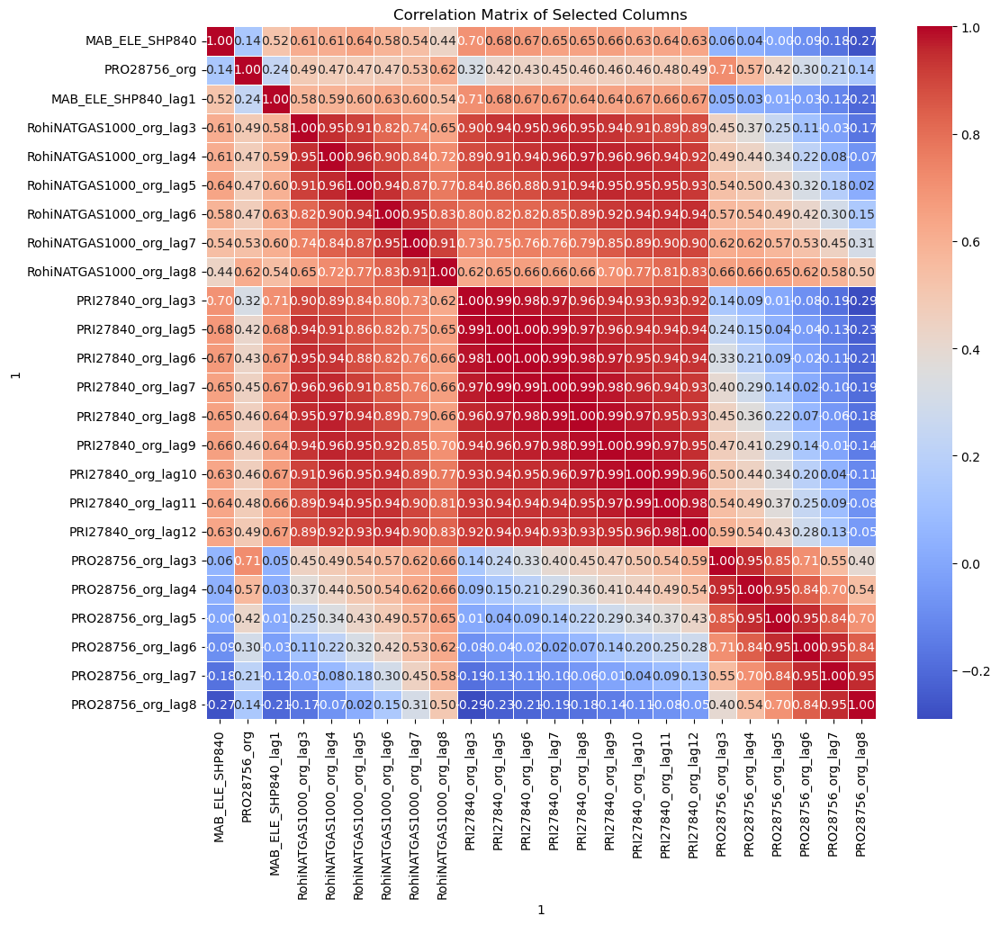

In [1090]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product36_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1091]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)


1                        1                      
RohiNATGAS1000_org_lag4  RohiNATGAS1000_org_lag3    True
RohiNATGAS1000_org_lag5  RohiNATGAS1000_org_lag3    True
                         RohiNATGAS1000_org_lag4    True
RohiNATGAS1000_org_lag6  RohiNATGAS1000_org_lag3    True
                         RohiNATGAS1000_org_lag4    True
                                                    ... 
PRO28756_org_lag6        PRO28756_org_lag5          True
PRO28756_org_lag7        PRO28756_org_lag5          True
                         PRO28756_org_lag6          True
PRO28756_org_lag8        PRO28756_org_lag6          True
                         PRO28756_org_lag7          True
Length: 97, dtype: bool


In [1092]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product36_list and column2 in selected_features_product36_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product36_list
selected_features_product36_list = [feature for feature in selected_features_product36_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product36_list)


['MAB_ELE_SHP840', 'PRO28756_org', 'MAB_ELE_SHP840_lag1', 'RohiNATGAS1000_org_lag6', 'PRO28756_org_lag7']


<h4> XGBoost </h4>
__________________________________________________________   

In [1093]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product36_list].dropna()

# Create the target variable
y = scaled_sales_index['#36_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-05':], y_train['2019-05':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_36_xgb = y_test.to_frame()
predictions_36_xgb['Prediction'] = y_pred_test
predictions_36_xgb['Residual'] = y_test - predictions_36_xgb['Prediction']
print(predictions_36_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #36_Index  Prediction  Residual
date                                    
2021-07       0.07        1.00     -0.93
2021-08       0.03        0.08     -0.05
2021-09       0.10        0.08      0.02
2021-10       0.00        1.00     -1.00
2021-11       0.02        0.07     -0.05
2021-12       0.19        0.09      0.10
2022-01       0.02        1.00     -0.98
2022-02       0.12        0.08      0.04
2022-03       0.01        0.09     -0.08
2022-04       0.06        1.00     -0.93
Mean Absolute Error (MAE): 0.41845194995304513
Mean Squared Error (MSE): 0.3720413893556397
Root Mean Squared Error (RMSE): 0.6099519565962878


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1094]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product36_list].dropna()

# Create the target variable
y = scaled_sales_index['#36_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-05':], y_train['2019-05':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_36_svr = y_test.to_frame()
predictions_36_svr['Prediction'] = y_pred_test
predictions_36_svr['Residual'] = y_test - predictions_36_svr['Prediction']
print(predictions_36_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #36_Index  Prediction  Residual
date                                    
2021-07       0.07        0.32     -0.26
2021-08       0.03        0.06     -0.03
2021-09       0.10        0.19     -0.08
2021-10       0.00        0.25     -0.25
2021-11       0.02        0.15     -0.13
2021-12       0.19        0.11      0.08
2022-01       0.02        0.21     -0.19
2022-02       0.12        0.08      0.03
2022-03       0.01        0.22     -0.21
2022-04       0.06        0.23     -0.17
Mean Absolute Error (MAE): 0.1436956019627099
Mean Squared Error (MSE): 0.0271951289126574
Root Mean Squared Error (RMSE): 0.16490945671081875


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1095]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product36_list].dropna()

# Create the target variable
y = scaled_sales_index['#36_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-05':], y_train['2019-05':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_36_rf = y_test.to_frame()
predictions_36_rf['Prediction'] = y_pred_test
predictions_36_rf['Residual'] = y_test - predictions_36_rf['Prediction']
print(predictions_36_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #36_Index  Prediction  Residual
date                                    
2021-07       0.07        0.68     -0.62
2021-08       0.03        0.11     -0.07
2021-09       0.10        0.71     -0.61
2021-10       0.00        0.71     -0.71
2021-11       0.02        0.68     -0.66
2021-12       0.19        0.10      0.09
2022-01       0.02        0.68     -0.66
2022-02       0.12        0.08      0.03
2022-03       0.01        0.16     -0.15
2022-04       0.06        0.71     -0.65
Mean Absolute Error (MAE): 0.42486351173825676
Mean Squared Error (MSE): 0.2584572179340519
Root Mean Squared Error (RMSE): 0.5083868782079765


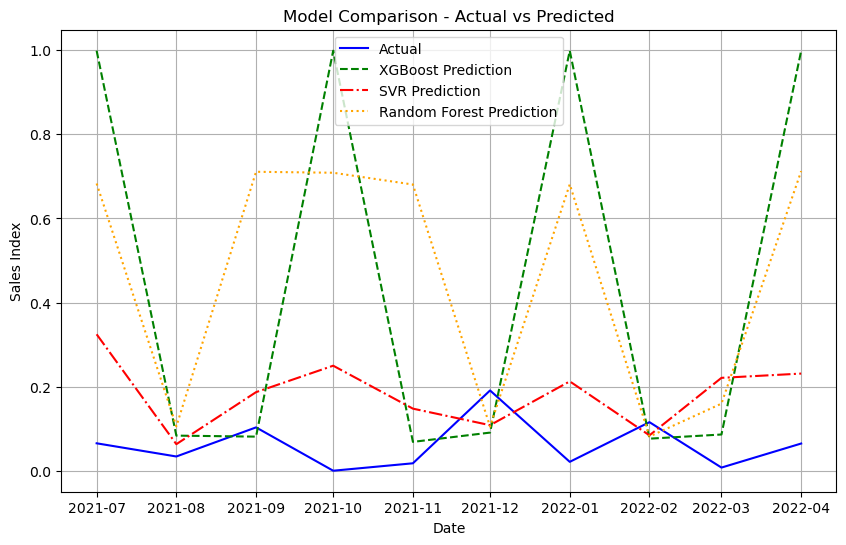

In [1096]:

# Convert index to timestamp
predictions_36_xgb.index = predictions_36_xgb.index.to_timestamp()
predictions_36_svr.index = predictions_36_svr.index.to_timestamp()
predictions_36_rf.index = predictions_36_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_36_xgb.index, predictions_36_xgb['#36_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_36_xgb.index, predictions_36_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_36_svr.index, predictions_36_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_36_rf.index, predictions_36_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1097]:
# Select features for product 36 and add target variable
features = selected_features_product36_list
features.append('#36_Index')

# Drop rows with missing values
final_p36_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=svr_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p36_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 36
predictions_p36 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p36), freq='M').strftime('%Y-%m')
predictions_p36.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 36
p36_pred_df = pd.concat([final_p36_df, predictions_p36])

# Unscaled predictions_p36['#36_Index'] manually using X_min_36 and X_max_36
unscaled_predictions_p36 = predictions_p36.copy()  # Make a copy of predictions_p36 DataFrame
unscaled_predictions_p36['#36_Index'] = predictions_p36['#36_Index'] * (X_max_36 - X_min_36) + X_min_36
unscaled_predictions_p36['#36'] = (unscaled_predictions_p36['#36_Index'] /100)*sales['#36'].iloc[0]
p36_pred_df['#36_Index'] = p36_pred_df['#36_Index'] * (X_max_36 - X_min_36) + X_min_36
p36_pred_df['#36'] = (p36_pred_df['#36_Index'] /100)*sales['#36'].iloc[0]
TotalForecast['#36']=p36_pred_df['#36']

# Add the unscaled predictions for #36_Index to the existing forecast DataFrame
forecast['#36'] = unscaled_predictions_p36['#36']



<h2>4.10 Product #4 </h2>

In [1098]:

# Target column
target_column = '#4_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.32  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product4_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product4_list

['MAB_ELE_PRO392',
 'MAB_ELE_SHP840',
 'MAB_ELE_PRO392_lag3',
 'WKLWEUR840_org_lag1']

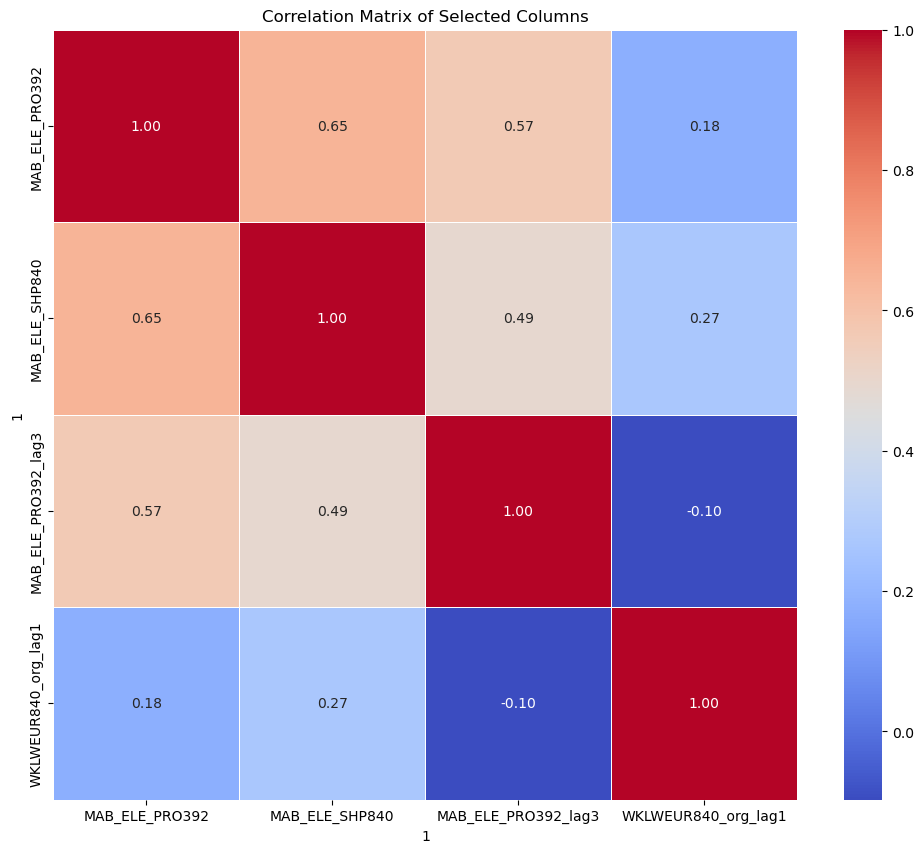

In [1099]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product4_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1100]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)

Series([], dtype: bool)


In [1101]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product4_list and column2 in selected_features_product4_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product4_list
selected_features_product4_list = [feature for feature in selected_features_product4_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product4_list)

['MAB_ELE_PRO392', 'MAB_ELE_SHP840', 'MAB_ELE_PRO392_lag3', 'WKLWEUR840_org_lag1']


<h4> XGBoost </h4>
__________________________________________________________   

In [1102]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product4_list].dropna()

# Create the target variable
y = scaled_sales_index['#4_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_4_xgb = y_test.to_frame()
predictions_4_xgb['Prediction'] = y_pred_test
predictions_4_xgb['Residual'] = y_test - predictions_4_xgb['Prediction']
print(predictions_4_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #4_Index  Prediction  Residual
date                                   
2021-07      0.46        0.54     -0.07
2021-08      0.22        0.33     -0.11
2021-09      0.31        0.26      0.06
2021-10      0.34        0.10      0.24
2021-11      0.27        0.18      0.09
2021-12      0.14        0.15     -0.00
2022-01      0.26        0.12      0.14
2022-02      0.21        0.15      0.06
2022-03      0.43        0.19      0.24
2022-04      0.28        0.14      0.15
Mean Absolute Error (MAE): 0.11483859247237187
Mean Squared Error (MSE): 0.0184696875747465
Root Mean Squared Error (RMSE): 0.1359032287134728


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1103]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product4_list].dropna()

# Create the target variable
y = scaled_sales_index['#4_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_4_svr = y_test.to_frame()
predictions_4_svr['Prediction'] = y_pred_test
predictions_4_svr['Residual'] = y_test - predictions_4_svr['Prediction']
print(predictions_4_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #4_Index  Prediction  Residual
date                                   
2021-07      0.46        0.59     -0.12
2021-08      0.22        0.39     -0.17
2021-09      0.31        0.59     -0.28
2021-10      0.34        0.46     -0.12
2021-11      0.27        0.19      0.08
2021-12      0.14        0.30     -0.15
2022-01      0.26        0.12      0.13
2022-02      0.21        0.17      0.04
2022-03      0.43        0.42      0.01
2022-04      0.28        0.13      0.16
Mean Absolute Error (MAE): 0.1256948659576116
Mean Squared Error (MSE): 0.02077006364341858
Root Mean Squared Error (RMSE): 0.14411822800540736


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1104]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product4_list].dropna()

# Create the target variable
y = scaled_sales_index['#4_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_4_rf = y_test.to_frame()
predictions_4_rf['Prediction'] = y_pred_test
predictions_4_rf['Residual'] = y_test - predictions_4_rf['Prediction']
print(predictions_4_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #4_Index  Prediction  Residual
date                                   
2021-07      0.46        0.51     -0.05
2021-08      0.22        0.52     -0.30
2021-09      0.31        0.45     -0.14
2021-10      0.34        0.40     -0.05
2021-11      0.27        0.30     -0.03
2021-12      0.14        0.33     -0.19
2022-01      0.26        0.17      0.08
2022-02      0.21        0.25     -0.05
2022-03      0.43        0.36      0.07
2022-04      0.28        0.25      0.04
Mean Absolute Error (MAE): 0.09945553400828648
Mean Squared Error (MSE): 0.01653784149752196
Root Mean Squared Error (RMSE): 0.12859953925859127


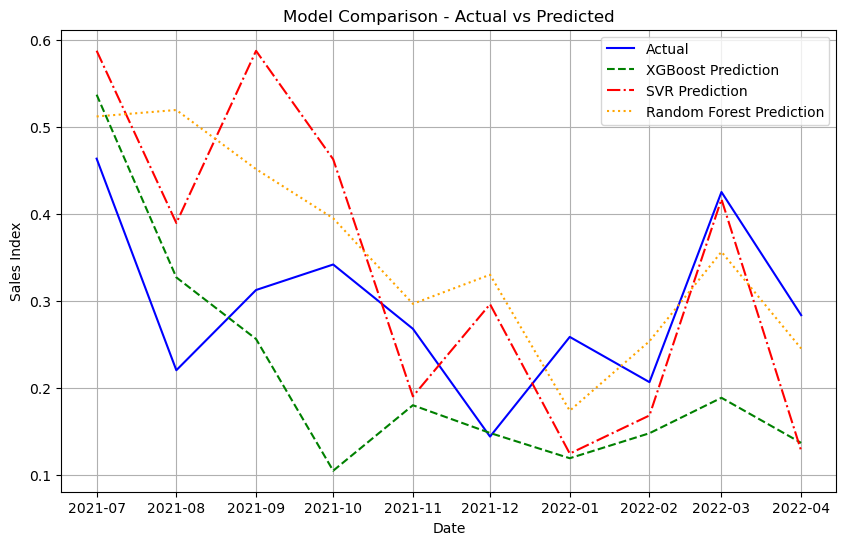

In [1105]:
# Convert index to timestamp
predictions_4_xgb.index = predictions_4_xgb.index.to_timestamp()
predictions_4_svr.index = predictions_4_svr.index.to_timestamp()
predictions_4_rf.index = predictions_4_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_4_xgb.index, predictions_4_xgb['#4_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_4_xgb.index, predictions_4_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_4_svr.index, predictions_4_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_4_rf.index, predictions_4_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1106]:
# Select features for product 4 and add target variable
features = selected_features_product4_list
features.append('#4_Index')

# Drop rows with missing values
final_p4_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=rf_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p4_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 4
predictions_p4 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p4), freq='M').strftime('%Y-%m')
predictions_p4.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 4
p4_pred_df = pd.concat([final_p4_df, predictions_p4])

# Unscaled predictions_p4['#4_Index'] manually using X_min_4 and X_max_4
unscaled_predictions_p4 = predictions_p4.copy()  # Make a copy of predictions_p4 DataFrame
unscaled_predictions_p4['#4_Index'] = predictions_p4['#4_Index'] * (X_max_4 - X_min_4) + X_min_4
unscaled_predictions_p4['#4'] = (unscaled_predictions_p4['#4_Index'] /100)*sales['#4'].iloc[0]
p4_pred_df['#4_Index'] = p4_pred_df['#4_Index'] * (X_max_4 - X_min_4) + X_min_4
p4_pred_df['#4'] = (p4_pred_df['#4_Index'] /100)*sales['#4'].iloc[0]
TotalForecast['#4']=p4_pred_df['#4']

# Add the unscaled predictions for #4_Index to the existing forecast DataFrame
forecast['#4'] = unscaled_predictions_p4['#4']



<h2>4.11 Product #5 </h2>

In [1107]:

# Target column
target_column = '#5_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.26  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product5_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product5_list

['MAB_ELE_PRO276_lag3',
 'MAB_ELE_PRO392_lag3',
 'MAB_ELE_PRO392_lag5',
 'MAB_ELE_PRO392_lag6']

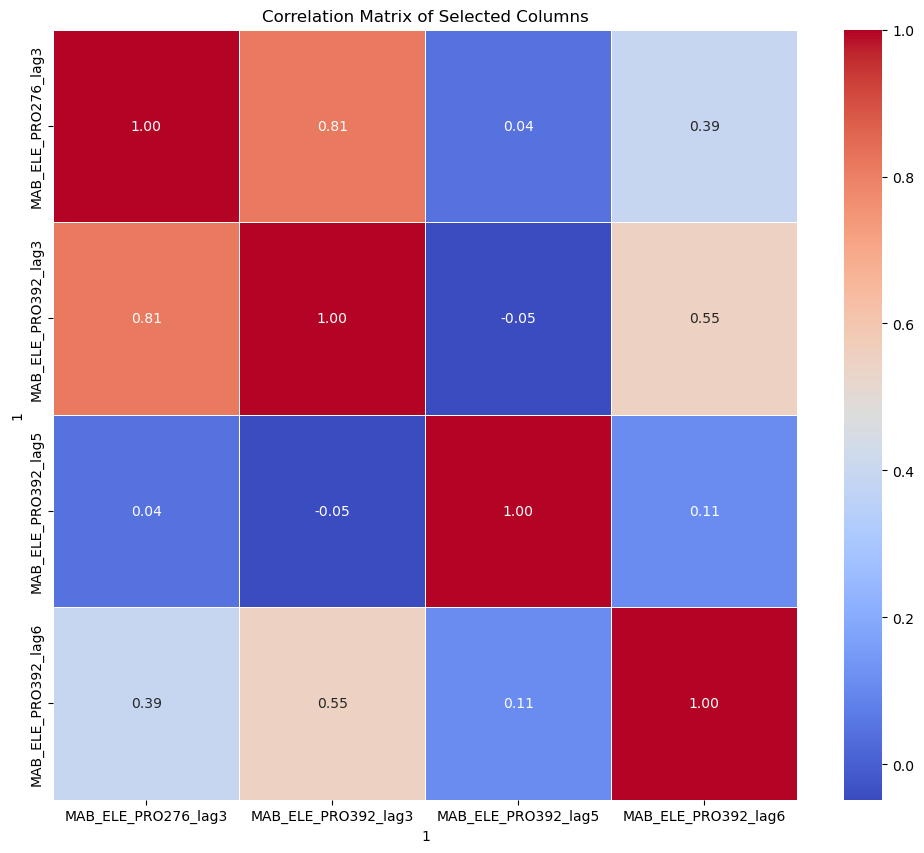

In [1108]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product5_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1109]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)

1                    1                  
MAB_ELE_PRO392_lag3  MAB_ELE_PRO276_lag3    True
dtype: bool


In [1110]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product5_list and column2 in selected_features_product5_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product5_list
selected_features_product5_list = [feature for feature in selected_features_product5_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product5_list)

['MAB_ELE_PRO392_lag3', 'MAB_ELE_PRO392_lag5', 'MAB_ELE_PRO392_lag6']


<h4> XGBoost </h4>
__________________________________________________________   

In [1111]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product5_list].dropna()

# Create the target variable
y = scaled_sales_index['#5_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_5_xgb = y_test.to_frame()
predictions_5_xgb['Prediction'] = y_pred_test
predictions_5_xgb['Residual'] = y_test - predictions_5_xgb['Prediction']
print(predictions_5_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #5_Index  Prediction  Residual
date                                   
2021-07      0.38        0.53     -0.15
2021-08      1.00        0.59      0.41
2021-09      0.79        0.61      0.17
2021-10      0.56        0.62     -0.07
2021-11      0.45        0.59     -0.14
2021-12      0.40        0.44     -0.04
2022-01      0.35        0.58     -0.23
2022-02      0.35        0.55     -0.20
2022-03      0.74        0.50      0.23
2022-04      0.41        0.55     -0.14
Mean Absolute Error (MAE): 0.17791476828974861
Mean Squared Error (MSE): 0.041027602716894686
Root Mean Squared Error (RMSE): 0.20255271589612095


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1112]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product5_list].dropna()

# Create the target variable
y = scaled_sales_index['#5_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_5_svr = y_test.to_frame()
predictions_5_svr['Prediction'] = y_pred_test
predictions_5_svr['Residual'] = y_test - predictions_5_svr['Prediction']
print(predictions_5_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #5_Index  Prediction  Residual
date                                   
2021-07      0.38        0.58     -0.19
2021-08      1.00        0.51      0.49
2021-09      0.79        0.50      0.29
2021-10      0.56        0.55      0.00
2021-11      0.45        0.51     -0.06
2021-12      0.40        0.50     -0.10
2022-01      0.35        0.48     -0.13
2022-02      0.35        0.58     -0.23
2022-03      0.74        0.60      0.14
2022-04      0.41        0.46     -0.05
Mean Absolute Error (MAE): 0.1686570969121119
Mean Squared Error (MSE): 0.04697680038221327
Root Mean Squared Error (RMSE): 0.2167413213538509


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1113]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product5_list].dropna()

# Create the target variable
y = scaled_sales_index['#5_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-10':], y_train['2019-10':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_5_rf = y_test.to_frame()
predictions_5_rf['Prediction'] = y_pred_test
predictions_5_rf['Residual'] = y_test - predictions_5_rf['Prediction']
print(predictions_5_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)


         #5_Index  Prediction  Residual
date                                   
2021-07      0.38        0.53     -0.15
2021-08      1.00        0.46      0.54
2021-09      0.79        0.64      0.14
2021-10      0.56        0.53      0.03
2021-11      0.45        0.46     -0.00
2021-12      0.40        0.56     -0.16
2022-01      0.35        0.57     -0.23
2022-02      0.35        0.53     -0.18
2022-03      0.74        0.64      0.09
2022-04      0.41        0.49     -0.08
Mean Absolute Error (MAE): 0.16066845321357054
Mean Squared Error (MSE): 0.04601097423200438
Root Mean Squared Error (RMSE): 0.21450168817984713


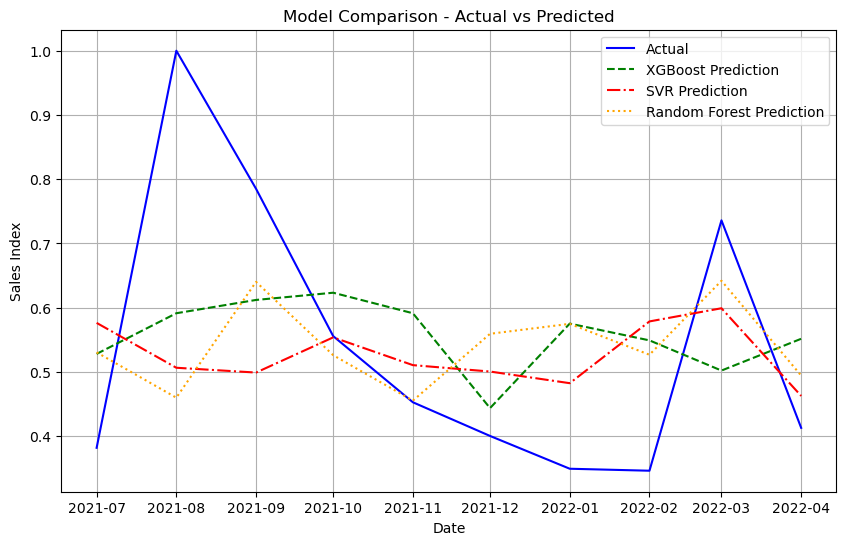

In [1114]:
# Convert index to timestamp
predictions_5_xgb.index = predictions_5_xgb.index.to_timestamp()
predictions_5_svr.index = predictions_5_svr.index.to_timestamp()
predictions_5_rf.index = predictions_5_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_5_xgb.index, predictions_5_xgb['#5_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_5_xgb.index, predictions_5_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_5_svr.index, predictions_5_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_5_rf.index, predictions_5_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1115]:
# Select features for product 5 and add target variable
features = selected_features_product5_list
features.append('#5_Index')

# Drop rows with missing values
final_p5_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p5_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 5
predictions_p5 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p5), freq='M').strftime('%Y-%m')
predictions_p5.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 5
p5_pred_df = pd.concat([final_p5_df, predictions_p5])

# Unscaled predictions_p5['#5_Index'] manually using X_min_5 and X_max_5
unscaled_predictions_p5 = predictions_p5.copy()  # Make a copy of predictions_p5 DataFrame
unscaled_predictions_p5['#5_Index'] = predictions_p5['#5_Index'] * (X_max_5 - X_min_5) + X_min_5
unscaled_predictions_p5['#5'] = (unscaled_predictions_p5['#5_Index'] /100)*sales['#5'].iloc[0]
p12_pred_df['#5_Index'] = p5_pred_df['#5_Index'] * (X_max_5 - X_min_5) + X_min_5
p5_pred_df['#5'] = (p5_pred_df['#5_Index'] /100)*sales['#5'].iloc[0]
TotalForecast['#5']=p5_pred_df['#5']

# Add the unscaled predictions for #5_Index to the existing forecast DataFrame
forecast['#5'] = unscaled_predictions_p5['#5']


<h2>4.12 Product #6 </h2>

In [1116]:

# Target column
target_column = '#6_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.29  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product6_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product6_list

['MAB_ELE_SHP250_lag5',
 'MAB_ELE_PRO276_lag5',
 'MAB_ELE_PRO276_lag9',
 'MAB_ELE_PRO392_lag5',
 'MAB_ELE_PRO756_lag5',
 'MAB_ELE_PRO756_lag6',
 'MAB_ELE_PRO756_lag7',
 'MAB_ELE_PRO756_lag8',
 'MAB_ELE_PRO756_lag9',
 'PRO27756_org_lag5',
 'PRO27756_org_lag6',
 'PRO27756_org_lag7',
 'PRO27756_org_lag8']

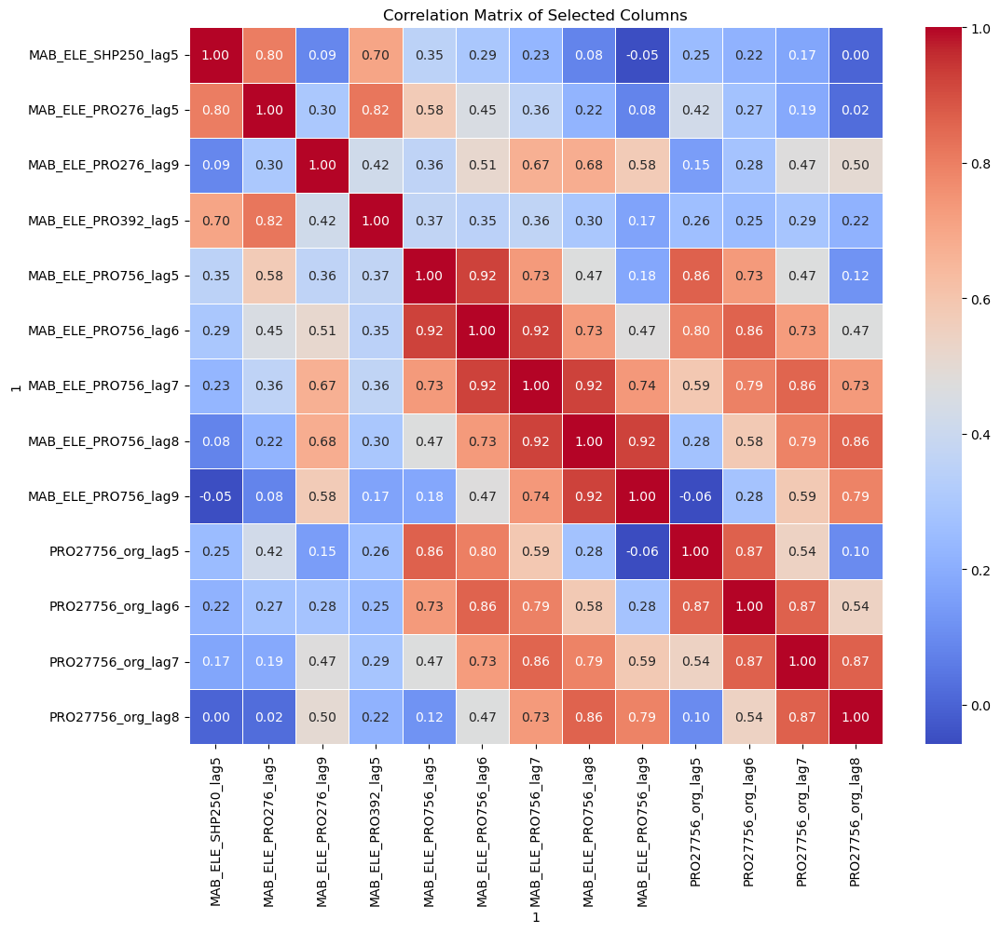

In [1117]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product6_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1118]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)

1                    1                  
MAB_ELE_PRO276_lag5  MAB_ELE_SHP250_lag5    True
MAB_ELE_PRO392_lag5  MAB_ELE_PRO276_lag5    True
MAB_ELE_PRO756_lag6  MAB_ELE_PRO756_lag5    True
MAB_ELE_PRO756_lag7  MAB_ELE_PRO756_lag6    True
MAB_ELE_PRO756_lag8  MAB_ELE_PRO756_lag7    True
MAB_ELE_PRO756_lag9  MAB_ELE_PRO756_lag8    True
PRO27756_org_lag5    MAB_ELE_PRO756_lag5    True
PRO27756_org_lag6    MAB_ELE_PRO756_lag6    True
                     PRO27756_org_lag5      True
PRO27756_org_lag7    MAB_ELE_PRO756_lag7    True
                     PRO27756_org_lag6      True
PRO27756_org_lag8    MAB_ELE_PRO756_lag8    True
                     PRO27756_org_lag7      True
dtype: bool


In [1119]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product6_list and column2 in selected_features_product6_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product6_list
selected_features_product6_list = [feature for feature in selected_features_product6_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product6_list)

['MAB_ELE_PRO276_lag9', 'MAB_ELE_PRO392_lag5', 'MAB_ELE_PRO756_lag7']


<h4> XGBoost </h4>
__________________________________________________________   

In [1120]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product6_list].dropna()

# Create the target variable
y = scaled_sales_index['#6_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_6_xgb = y_test.to_frame()
predictions_6_xgb['Prediction'] = y_pred_test
predictions_6_xgb['Residual'] = y_test - predictions_6_xgb['Prediction']
print(predictions_6_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #6_Index  Prediction  Residual
date                                   
2021-07      0.51        0.59     -0.08
2021-08      0.54        0.71     -0.17
2021-09      0.95        0.65      0.30
2021-10      0.21        0.35     -0.14
2021-11      0.40        0.70     -0.30
2021-12      0.20        0.91     -0.71
2022-01      0.17        0.50     -0.33
2022-02      0.40        0.73     -0.33
2022-03      0.33        0.68     -0.36
2022-04      0.34        0.77     -0.43
Mean Absolute Error (MAE): 0.3152087127004345
Mean Squared Error (MSE): 0.127073585271041
Root Mean Squared Error (RMSE): 0.35647382129834027


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1121]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product6_list].dropna()

# Create the target variable
y = scaled_sales_index['#6_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_6_svr = y_test.to_frame()
predictions_6_svr['Prediction'] = y_pred_test
predictions_6_svr['Residual'] = y_test - predictions_6_svr['Prediction']
print(predictions_6_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #6_Index  Prediction  Residual
date                                   
2021-07      0.51        0.52     -0.02
2021-08      0.54        0.64     -0.10
2021-09      0.95        0.61      0.33
2021-10      0.21        0.48     -0.27
2021-11      0.40        0.59     -0.20
2021-12      0.20        0.80     -0.60
2022-01      0.17        0.41     -0.24
2022-02      0.40        0.59     -0.19
2022-03      0.33        0.65     -0.32
2022-04      0.34        0.68     -0.34
Mean Absolute Error (MAE): 0.2601030997682916
Mean Squared Error (MSE): 0.09004470711070535
Root Mean Squared Error (RMSE): 0.3000745026001132


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1122]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product6_list].dropna()

# Create the target variable
y = scaled_sales_index['#6_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_6_rf = y_test.to_frame()
predictions_6_rf['Prediction'] = y_pred_test
predictions_6_rf['Residual'] = y_test - predictions_6_rf['Prediction']
print(predictions_6_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #6_Index  Prediction  Residual
date                                   
2021-07      0.51        0.55     -0.04
2021-08      0.54        0.55     -0.01
2021-09      0.95        0.58      0.37
2021-10      0.21        0.44     -0.23
2021-11      0.40        0.62     -0.23
2021-12      0.20        0.72     -0.52
2022-01      0.17        0.47     -0.29
2022-02      0.40        0.62     -0.22
2022-03      0.33        0.62     -0.29
2022-04      0.34        0.54     -0.19
Mean Absolute Error (MAE): 0.24068348110058618
Mean Squared Error (MSE): 0.07733377058438876
Root Mean Squared Error (RMSE): 0.2780895010322913


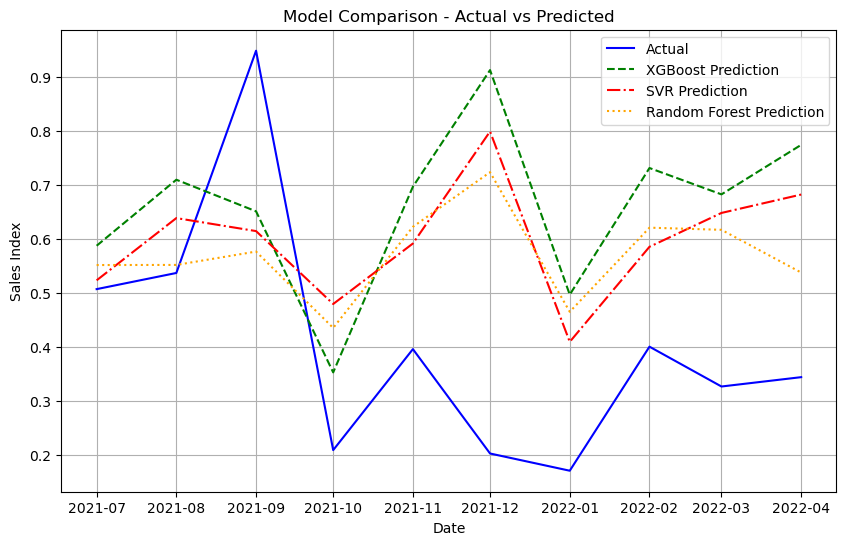

In [1123]:
# Convert index to timestamp
predictions_6_xgb.index = predictions_6_xgb.index.to_timestamp()
predictions_6_svr.index = predictions_6_svr.index.to_timestamp()
predictions_6_rf.index = predictions_6_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_6_xgb.index, predictions_6_xgb['#6_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_6_xgb.index, predictions_6_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_6_svr.index, predictions_6_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_6_rf.index, predictions_6_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1124]:
# Select features for product 6 and add target variable
features = selected_features_product6_list
features.append('#6_Index')

# Drop rows with missing values
final_p6_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=rf_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p6_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 6
predictions_p6 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p6), freq='M').strftime('%Y-%m')
predictions_p6.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 6
p6_pred_df = pd.concat([final_p6_df, predictions_p6])

# Unscaled predictions_p6['#6_Index'] manually using X_min_6 and X_max_6
unscaled_predictions_p6 = predictions_p6.copy()  # Make a copy of predictions_p6 DataFrame
unscaled_predictions_p6['#6_Index'] = predictions_p6['#6_Index'] * (X_max_6 - X_min_6) + X_min_6
unscaled_predictions_p6['#6'] = (unscaled_predictions_p6['#6_Index'] /100)*sales['#6'].iloc[0]
p6_pred_df['#6_Index'] = p6_pred_df['#6_Index'] * (X_max_6 - X_min_6) + X_min_6
p6_pred_df['#6'] = (p6_pred_df['#6_Index'] /100)*sales['#6'].iloc[0]
TotalForecast['#6']=p6_pred_df['#6']

# Add the unscaled predictions for #6_Index to the existing forecast DataFrame
forecast['#6'] = unscaled_predictions_p6['#6']


<h2>4.13 Product #8 </h2>

In [1125]:

# Target column
target_column = '#8_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.25  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product8_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product8_list

['MAB_ELE_PRO392',
 'MAB_ELE_SHP840',
 'RohiENERGY1000_org',
 'RohiNATGAS1000_org',
 'PRI27840_org',
 'PRO28756_org',
 'MAB_ELE_SHP840_lag9',
 'RohiBASEMET1000_org_lag1',
 'RohiBASEMET1000_org_lag11',
 'RohiENERGY1000_org_lag1',
 'RohiNATGAS1000_org_lag2',
 'PRI27840_org_lag1',
 'PRI27840_org_lag2',
 'PRI27840_org_lag3',
 'PRI27840_org_lag12']

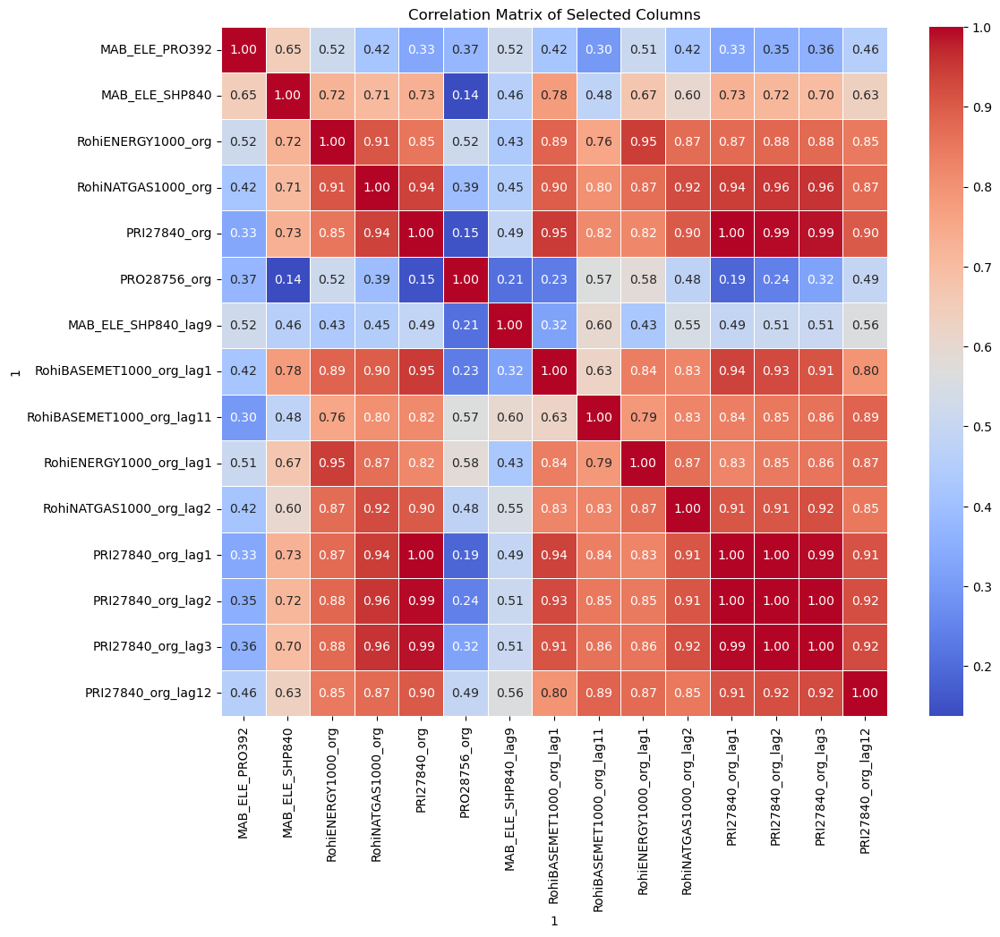

In [1126]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product8_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1127]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)

1                          1                        
RohiNATGAS1000_org         RohiENERGY1000_org           True
PRI27840_org               RohiENERGY1000_org           True
                           RohiNATGAS1000_org           True
RohiBASEMET1000_org_lag1   RohiENERGY1000_org           True
                           RohiNATGAS1000_org           True
                           PRI27840_org                 True
RohiBASEMET1000_org_lag11  RohiNATGAS1000_org           True
                           PRI27840_org                 True
RohiENERGY1000_org_lag1    RohiENERGY1000_org           True
                           RohiNATGAS1000_org           True
                           PRI27840_org                 True
                           RohiBASEMET1000_org_lag1     True
RohiNATGAS1000_org_lag2    RohiENERGY1000_org           True
                           RohiNATGAS1000_org           True
                           PRI27840_org                 True
                           RohiB

In [1128]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product8_list and column2 in selected_features_product8_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product8_list
selected_features_product8_list = [feature for feature in selected_features_product8_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product8_list)

['MAB_ELE_PRO392', 'MAB_ELE_SHP840', 'PRO28756_org', 'MAB_ELE_SHP840_lag9', 'RohiENERGY1000_org_lag1']


<h4> XGBoost </h4>
__________________________________________________________   

In [1129]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product8_list].dropna()

# Create the target variable
y = scaled_sales_index['#8_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_8_xgb = y_test.to_frame()
predictions_8_xgb['Prediction'] = y_pred_test
predictions_8_xgb['Residual'] = y_test - predictions_8_xgb['Prediction']
print(predictions_8_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #8_Index  Prediction  Residual
date                                   
2021-07      0.43        0.38      0.05
2021-08      0.39        0.24      0.14
2021-09      0.76        0.26      0.50
2021-10      0.10        0.44     -0.34
2021-11      0.40        0.29      0.11
2021-12      1.00        0.26      0.74
2022-01      0.43        0.25      0.18
2022-02      0.44        0.25      0.19
2022-03      0.69        0.32      0.37
2022-04      0.48        0.28      0.21
Mean Absolute Error (MAE): 0.2835575693096376
Mean Squared Error (MSE): 0.11998489475959055
Root Mean Squared Error (RMSE): 0.34638835829108133


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1130]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product8_list].dropna()

# Create the target variable
y = scaled_sales_index['#8_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_8_svr = y_test.to_frame()
predictions_8_svr['Prediction'] = y_pred_test
predictions_8_svr['Residual'] = y_test - predictions_8_svr['Prediction']
print(predictions_8_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #8_Index  Prediction  Residual
date                                   
2021-07      0.43        0.29      0.14
2021-08      0.39        0.18      0.21
2021-09      0.76        0.24      0.52
2021-10      0.10        0.19     -0.09
2021-11      0.40        0.21      0.20
2021-12      1.00        0.19      0.81
2022-01      0.43        0.16      0.27
2022-02      0.44        0.19      0.25
2022-03      0.69        0.19      0.51
2022-04      0.48        0.19      0.29
Mean Absolute Error (MAE): 0.3289837581993272
Mean Squared Error (MSE): 0.15144175699904672
Root Mean Squared Error (RMSE): 0.38915518369802904


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1131]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product8_list].dropna()

# Create the target variable
y = scaled_sales_index['#8_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2019-07':], y_train['2019-07':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_8_rf = y_test.to_frame()
predictions_8_rf['Prediction'] = y_pred_test
predictions_8_rf['Residual'] = y_test - predictions_8_rf['Prediction']
print(predictions_8_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #8_Index  Prediction  Residual
date                                   
2021-07      0.43        0.32      0.11
2021-08      0.39        0.19      0.20
2021-09      0.76        0.26      0.49
2021-10      0.10        0.28     -0.19
2021-11      0.40        0.26      0.14
2021-12      1.00        0.24      0.76
2022-01      0.43        0.24      0.19
2022-02      0.44        0.26      0.19
2022-03      0.69        0.25      0.44
2022-04      0.48        0.26      0.22
Mean Absolute Error (MAE): 0.2931772634103298
Mean Squared Error (MSE): 0.1242861474509505
Root Mean Squared Error (RMSE): 0.3525424051812072


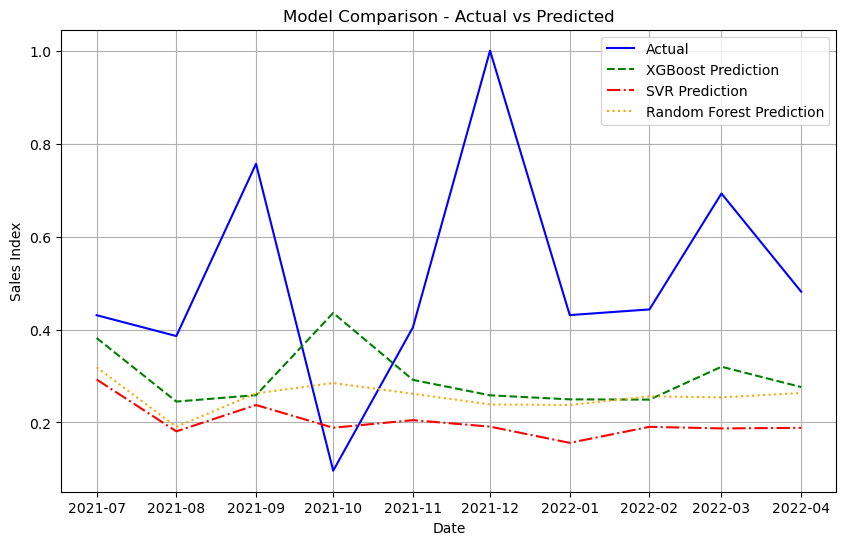

In [1132]:
# Convert index to timestamp
predictions_8_xgb.index = predictions_8_xgb.index.to_timestamp()
predictions_8_svr.index = predictions_8_svr.index.to_timestamp()
predictions_8_rf.index = predictions_8_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_8_xgb.index, predictions_8_xgb['#8_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_8_xgb.index, predictions_8_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_8_svr.index, predictions_8_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_8_rf.index, predictions_8_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1133]:
# Select features for product 8 and add target variable
features = selected_features_product8_list
features.append('#8_Index')

# Drop rows with missing values
final_p8_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=xgb_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p8_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 8
predictions_p8 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p8), freq='M').strftime('%Y-%m')
predictions_p8.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 8
p8_pred_df = pd.concat([final_p8_df, predictions_p8])

# Unscaled predictions_p8['#8_Index'] manually using X_min_8 and X_max_8
unscaled_predictions_p8 = predictions_p8.copy()  # Make a copy of predictions_p8 DataFrame
unscaled_predictions_p8['#8_Index'] = predictions_p8['#8_Index'] * (X_max_8 - X_min_8) + X_min_8
unscaled_predictions_p8['#8'] = (unscaled_predictions_p8['#8_Index'] /100)*sales['#8'].iloc[0]
p8_pred_df['#8_Index'] = p8_pred_df['#8_Index'] * (X_max_8 - X_min_8) + X_min_8
p8_pred_df['#8'] = (p8_pred_df['#8_Index'] /100)*sales['#8'].iloc[0]
TotalForecast['#8']=p8_pred_df['#8']

# Add the unscaled predictions for #8_Index to the existing forecast DataFrame
forecast['#8'] = unscaled_predictions_p8['#8']


<h2>4.14 Product #9 </h2>

In [1134]:

# Target column
target_column = '#9_Index'

# Combine the target column with the features
combined_df = scaled_market_adjusted.copy()
combined_df[target_column] = scaled_sales_index[target_column]

# Dropping rows with NaN values
combined_df_clean = combined_df.dropna()

# Compute RMSE for each feature
rmse_scores = {}
for column in combined_df_clean.columns:
    if column != target_column:  # Exclude the target column
        # Compute RMSE between target and each feature
        rmse = sqrt(mean_squared_error(combined_df_clean[target_column], combined_df_clean[column]))
        rmse_scores[column] = rmse

# Convert dictionary to DataFrame
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Set threshold for RMSE
bar = 0.32  # Adjust as needed

# Features to drop based on RMSE threshold
to_drop = rmse_df[rmse_df['RMSE'] > bar].index

# Dropping features from combined_df_clean
selected_features = combined_df_clean.drop(to_drop, axis=1)
# Selected features list excluding the target column
selected_features_product9_list = selected_features.drop(columns=[target_column]).columns.tolist()
selected_features_product9_list

['MAB_ELE_PRO392',
 'MAB_ELE_SHP840',
 'PRO28756_org',
 'PRO28756_org_lag1',
 'PRO28756_org_lag2']

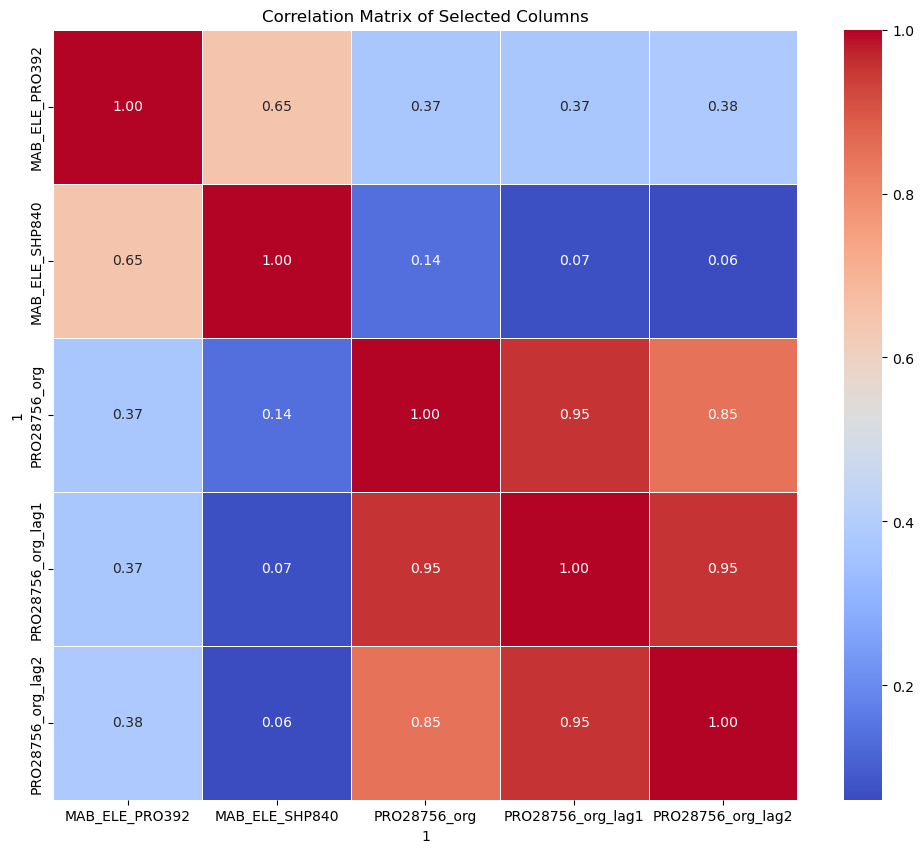

In [1135]:

# Calculating the correlation matrix
correlation_matrix = scaled_market_adjusted[selected_features_product9_list].corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Selected Columns')
plt.show()

In [1136]:
# Create a mask to select upper triangle of the correlation matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Extract upper triangle of correlation matrix (excluding diagonal)
upper_triangle = correlation_matrix.mask(mask)

# Find column pairs where correlation is greater than 0.8
high_correlation_pairs = (upper_triangle.abs() > 0.8).stack()

# Filter out pairs where correlation is 1 (same column)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs]

# Print the column pairs with correlation greater than 0.8
print(high_correlation_pairs)

1                  1                
PRO28756_org_lag1  PRO28756_org         True
PRO28756_org_lag2  PRO28756_org         True
                   PRO28756_org_lag1    True
dtype: bool


In [1137]:
# Identify columns to remove
columns_to_remove = set()
for pair in high_correlation_pairs.index:
    column1, column2 = pair
    if column1 in selected_features_product9_list and column2 in selected_features_product9_list:
        # Remove the feature with higher RMSE from each correlated pair
        rmse1 = rmse_scores[column1]
        rmse2 = rmse_scores[column2]
        if rmse1 > rmse2:
            columns_to_remove.add(column1)
        else:
            columns_to_remove.add(column2)

# Remove identified columns from selected_features_product9_list
selected_features_product9_list = [feature for feature in selected_features_product9_list if feature not in columns_to_remove]

# Print the updated list of selected features
print(selected_features_product9_list)

['MAB_ELE_PRO392', 'MAB_ELE_SHP840', 'PRO28756_org']


<h4> XGBoost </h4>
__________________________________________________________   

In [1138]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product9_list].dropna()

# Create the target variable
y = scaled_sales_index['#9_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
xgb_model.fit(X_train['2018-10':], y_train['2018-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_9_xgb = y_test.to_frame()
predictions_9_xgb['Prediction'] = y_pred_test
predictions_9_xgb['Residual'] = y_test - predictions_9_xgb['Prediction']
print(predictions_9_xgb)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #9_Index  Prediction  Residual
date                                   
2021-07      0.36        0.20      0.15
2021-08      0.11        0.32     -0.21
2021-09      0.31        0.25      0.06
2021-10      0.12        0.27     -0.15
2021-11      0.42        0.17      0.25
2021-12      0.44        0.25      0.19
2022-01      0.15        0.16     -0.01
2022-02      0.12        0.31     -0.19
2022-03      0.20        0.39     -0.19
2022-04      0.17        0.33     -0.16
Mean Absolute Error (MAE): 0.15646854337035915
Mean Squared Error (MSE): 0.02898674926936746
Root Mean Squared Error (RMSE): 0.17025495372930405


<h4> Support Vector Regression (SVR) </h4>
__________________________________________________________   

In [1139]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product9_list].dropna()

# Create the target variable
y = scaled_sales_index['#9_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the SVR model to the training data
svr_model.fit(X_train['2018-10':], y_train['2018-10':])

# Predict y for training and test sets using the SVR model
y_pred_train = svr_model.predict(X_train)
y_pred_test = svr_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_9_svr = y_test.to_frame()
predictions_9_svr['Prediction'] = y_pred_test
predictions_9_svr['Residual'] = y_test - predictions_9_svr['Prediction']
print(predictions_9_svr)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #9_Index  Prediction  Residual
date                                   
2021-07      0.36        0.29      0.06
2021-08      0.11        0.21     -0.10
2021-09      0.31        0.23      0.08
2021-10      0.12        0.18     -0.06
2021-11      0.42        0.24      0.18
2021-12      0.44        0.25      0.19
2022-01      0.15        0.18     -0.03
2022-02      0.12        0.23     -0.11
2022-03      0.20        0.35     -0.15
2022-04      0.17        0.23     -0.06
Mean Absolute Error (MAE): 0.10252117434468937
Mean Squared Error (MSE): 0.013247315049478894
Root Mean Squared Error (RMSE): 0.11509698106153303


<h4> Random Forest Regression </h4>
__________________________________________________________   

In [1140]:
# Select features for product 1 and drop NaN values
X = scaled_market_adjusted[selected_features_product9_list].dropna()

# Create the target variable
y = scaled_sales_index['#9_Index']

# Define the number of months to forecast
months_to_forecast = 10

# Split data into train and test sets
X_train = X[:-months_to_forecast]
X_test = X[-months_to_forecast:]
y_train = y[:-months_to_forecast]
y_test = y[-months_to_forecast:]

# Fit the rf model to the training data
rf_model.fit(X_train['2018-10':], y_train['2018-10':])

# Predict y for training and test sets using the rf model
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

# Visualize predictions vs actual values 
predictions_9_rf = y_test.to_frame()
predictions_9_rf['Prediction'] = y_pred_test
predictions_9_rf['Residual'] = y_test - predictions_9_rf['Prediction']
print(predictions_9_rf)  # Display the first few rows of the DataFrame

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)

# Print evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)

         #9_Index  Prediction  Residual
date                                   
2021-07      0.36        0.24      0.12
2021-08      0.11        0.33     -0.22
2021-09      0.31        0.29      0.02
2021-10      0.12        0.31     -0.19
2021-11      0.42        0.23      0.19
2021-12      0.44        0.32      0.12
2022-01      0.15        0.22     -0.08
2022-02      0.12        0.31     -0.19
2022-03      0.20        0.49     -0.29
2022-04      0.17        0.31     -0.13
Mean Absolute Error (MAE): 0.1547768733395108
Mean Squared Error (MSE): 0.02941207644563973
Root Mean Squared Error (RMSE): 0.17149949400986503


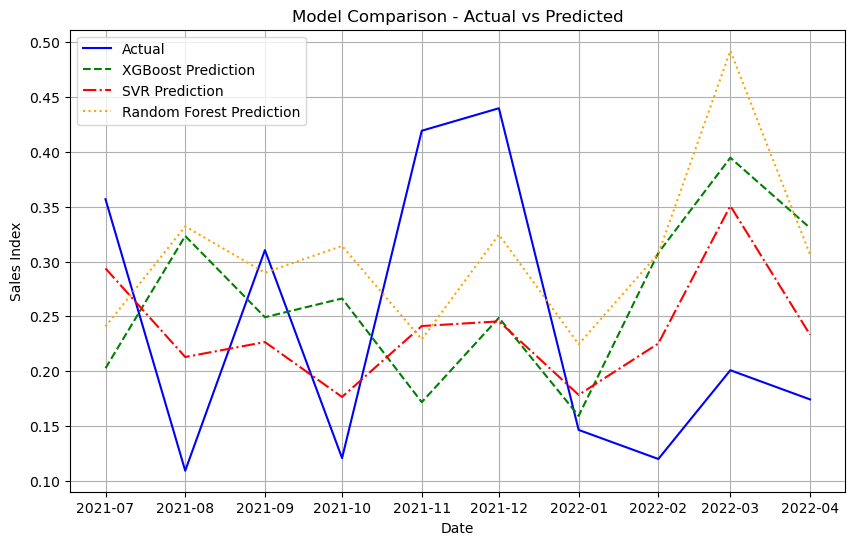

In [1141]:
# Convert index to timestamp
predictions_9_xgb.index = predictions_9_xgb.index.to_timestamp()
predictions_9_svr.index = predictions_9_svr.index.to_timestamp()
predictions_9_rf.index = predictions_9_rf.index.to_timestamp()

# Plotting predictions vs actual values for all models
plt.figure(figsize=(10, 6))

# Plot for XGBoost
plt.plot(predictions_9_xgb.index, predictions_9_xgb['#9_Index'], label='Actual', color='blue', linestyle='-')
plt.plot(predictions_9_xgb.index, predictions_9_xgb['Prediction'], label='XGBoost Prediction', color='green', linestyle='--')

# Plot for SVR
plt.plot(predictions_9_svr.index, predictions_9_svr['Prediction'], label='SVR Prediction', color='red', linestyle='-.')

# Plot for Random Forest
plt.plot(predictions_9_rf.index, predictions_9_rf['Prediction'], label='Random Forest Prediction', color='orange', linestyle=':')

plt.title('Model Comparison - Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Sales Index')
plt.legend()
plt.grid(True)
plt.show()

In [1142]:
# Select features for product 9 and add target variable
features = selected_features_product9_list
features.append('#9_Index')

# Drop rows with missing values
final_p9_df = merged_data[features].dropna()

# Create and fit forecaster multi series
forecaster = ForecasterAutoregMultiSeries(
    regressor=svr_model,  # Random Forest model used as regressor
    lags=10            # Number of lagged values to consider
)

forecaster.fit(series=final_p9_df)  # Fit the forecaster to the final dataset

# Predict and predict_interval
steps = 10  # Number of steps to predict

# Predictions for product 9
predictions_p9 = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions_p9), freq='M').strftime('%Y-%m')
predictions_p9.index = new_index  # Set proper index for predictions

# Concatenate original data with predictions for product 9
p9_pred_df = pd.concat([final_p9_df, predictions_p9])

# Unscaled predictions_p9['#9_Index'] manually using X_min_9 and X_max_9
unscaled_predictions_p9 = predictions_p9.copy()  # Make a copy of predictions_p9 DataFrame
unscaled_predictions_p9['#9_Index'] = predictions_p9['#9_Index'] * (X_max_9 - X_min_9) + X_min_9
unscaled_predictions_p9['#9'] = (unscaled_predictions_p9['#9_Index'] /100)*sales['#9'].iloc[0]
p9_pred_df['#9_Index'] = p9_pred_df['#9_Index'] * (X_max_9 - X_min_9) + X_min_9
p9_pred_df['#9'] = (p9_pred_df['#9_Index'] /100)*sales['#9'].iloc[0]
TotalForecast['#9']=p9_pred_df['#9']

# Add the unscaled predictions for #9_Index to the existing forecast DataFrame
forecast['#9'] = unscaled_predictions_p9['#9']


In [1143]:
TotalForecast

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2019-08,38042677.05,NaN,19217.00,NaN,1602.00,725678.33,NaN,NaN,1306.00,301973.43,8606.97,206931.17,397537.20,6371.50
2019-09,40602780.64,NaN,292490.40,NaN,12851.20,752884.16,NaN,NaN,16582.55,443349.32,18775.78,499147.73,1084685.92,13930.26
2019-10,39012299.19,218976.78,140819.69,65754.55,1378.55,285644.67,1566.00,11382774.45,1556.50,93226.32,13981.67,581767.85,111791.34,555.00
2019-11,37323903.07,1194770.75,320942.28,43190.76,2571.30,291844.03,149.00,13826060.48,14921.72,298011.68,9239.34,181159.20,542923.42,24181.80
2019-12,37701509.37,1278545.62,349515.29,26729.76,0.00,66419.16,0.00,11077603.56,5906.37,275968.15,16673.97,913378.80,491332.72,7611.36
2020-01,34116651.47,584370.00,213315.32,19519.59,2955.22,384800.46,274.91,11699896.34,11840.67,218623.48,7970.62,-15202.96,323769.20,7647.50
2020-02,33505879.26,1233609.73,324443.35,13747.17,10900.00,82821.54,0.00,10041616.85,11813.40,225262.14,15197.81,724398.75,326973.94,425.10
2020-03,39064430.88,2969948.65,185833.89,23513.59,10325.15,160397.35,555.00,12281515.46,28300.82,197670.48,10795.10,529808.94,845857.76,2233.00
2020-04,37981531.32,813303.01,79632.00,30716.11,-2851.45,70530.70,224.00,12008066.85,27121.60,387939.98,9082.91,782042.98,302765.68,1476.85
2020-05,31400212.54,842526.10,153949.24,3762.82,32670.00,195141.70,390.00,10708632.18,9649.30,315488.98,11678.06,750367.70,712746.38,3764.12


In [1144]:

# Generate date range from '2018-10' to '2022-02' to match the length of sales data
date_range = pd.date_range(start='2019-08', end='2023-03', freq='M')

# Creating a lineplot to visualize the monthly sales development of the different products
fig = px.line(TotalForecast, x=date_range, y=TotalForecast.columns)

fig.show()


In [1145]:
forecast

,#1,#11,#12,#13,#14,#16,#20,#3,#36,#4,#5,#6,#8,#9
2022-05,31747938.89,345072.32,242266.10,23162.96,13473.59,188587.96,4878.00,13182192.17,23998.16,180826.36,8080322.39,363813.74,1193349.27,4804.94
2022-06,27454979.63,1537736.31,360356.23,30592.97,25746.86,245848.28,2327.46,13103237.08,32064.40,326591.81,9135487.69,393676.27,1775496.60,6976.14
2022-07,33141704.24,434478.10,250949.32,30769.56,10698.54,178182.12,5888.93,12226749.21,32133.35,268018.25,7910370.80,422409.90,1210872.31,6645.62
2022-08,31894533.75,686889.77,282101.21,30204.91,21770.20,221071.37,3853.91,14253027.36,39547.52,243464.00,4593151.24,411924.83,1341586.12,9826.75
2022-09,35151304.46,1895771.29,286115.45,33427.43,35092.27,282002.14,4649.32,13153540.82,45911.58,254519.78,14374058.60,427910.60,2482111.35,11273.69
2022-10,36276655.58,1268619.59,245720.91,38700.08,27567.03,190106.07,3708.16,12585524.88,47773.88,234578.68,8226311.55,399858.47,1322358.46,10656.19
2022-11,31730541.14,959366.37,301468.79,38433.78,28297.23,175886.22,6374.16,12590037.39,57240.07,183320.53,9608704.09,399639.98,1329283.89,11173.07
2022-12,29472201.03,1563868.57,289050.76,42969.77,49825.60,192803.79,4036.25,13623792.32,64030.00,269225.60,13894756.95,371053.50,2613214.07,11601.36
2023-01,29829714.04,937636.22,267153.70,53270.71,40324.79,177814.91,5793.54,12140521.06,77147.22,209795.03,5962564.66,361328.03,1265539.02,10843.05
2023-02,29901286.18,761805.80,299544.03,59033.40,61880.92,139307.64,5932.62,13298298.48,94120.17,204057.53,11655544.90,353423.32,1357801.09,10468.55
